In [1]:
import sys
sys.path.insert(0, '../../stock_factor_lab/')

# 美股實驗彙總

## 回測期間設定

In [2]:
START_DATE = '2003-3-31'
END_DATE = '2024-12-31'

## 前置作業

### import

In [3]:
import talib
from get_data import Data
import backtest
from combinations import sim_conditions
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
# import plotly.graph_objs as go
import plotly.express as px
from itertools import cycle
from plotly.subplots import make_subplots
from matplotlib import rcParams
rcParams['font.sans-serif'] = ['Microsoft JhengHei']
# plt.rcParams['font.sans-serif'] = ['Microsoft JhengHei']  # 微軟正黑體
# plt.rcParams['axes.unicode_minus'] = False  # 用來正常顯示負號
import matplotlib as mpl
mpl.rcParams['axes.unicode_minus'] = False
import matplotlib.ticker as ticker
from matplotlib.ticker import FuncFormatter
from matplotlib.ticker import FixedLocator, FixedFormatter
import matplotlib.dates as mdates
import seaborn as sns
from datetime import datetime
from dateutil.relativedelta import relativedelta
import itertools
import re

from dataframe import CustomDataFrame

### get data

In [4]:
data=Data(market='US')

## 資料下載

In [5]:
close = data.get('price:close')

### 盈再率

In [6]:
netIncome = data.get('annual_report_fundamentals:netIncome')

# 4 年加總 #
netIncome_df = netIncome.copy()
# 提取index的月份
netIncome_df['month'] = netIncome_df.index.month
# 依據月份分組，對每個月份的每四年進行加總
netprofit_rol = netIncome_df.groupby('month', group_keys=False).apply(lambda group: group.rolling(4, min_periods=4).sum(), include_groups=False)

# 去除稅後淨利為負 (計算盈再率)
adj_netprofit = netprofit_rol[(netprofit_rol > 0) & (netIncome > 0)]

# 長期投資
longTermInvestments = data.get('annual_report_fundamentals:longTermInvestments')
# 固定資產
propertyPlantEquipmentNet = data.get('annual_report_fundamentals:propertyPlantEquipmentNet')


capex = longTermInvestments + propertyPlantEquipmentNet
# 以月份為單位，所以要減掉 48 個月前的資料 (第四年 - 第0年)
capex_rol = capex.diff(48)


rr = capex_rol / adj_netprofit

### 本益比

In [7]:
# 每季本益比 #
pe = data.get('quarter_report:PE')
pe = pe[pe > 0] # FMP不會過濾掉負值，但是本益比為負時不能算

In [8]:
# 計算每日本益比 #
eps = data.get('quarter_report:EPS')

eps_rol = eps + eps.shift(3) + eps.shift(6) + eps.shift(9)
pe_daily = (close / eps_rol)
pe_daily = pe_daily[pe_daily > 0]

In [9]:
annual_eps = data.get('annual_report:EPS')
# pe_daily = close/annual_eps
# pe_daily = pe_daily[pe_daily > 0]

### 年度ROE、股利支付率(配息率)、稅前淨利、上市時長

In [10]:
roe = data.get('annual_report:ROE')
dpr = data.get('annual_report_fundamentals:dividendPayoutRatio')
income_bf_tax = data.get('annual_report_fundamentals:incomeBeforeTax')
comp_profile = data.get('company_profile')

#### 上市櫃滿兩年
在滿兩年之前都設為False

In [11]:
stock_data = {}

for index, row in comp_profile.iterrows():
    stock_code = row['company_symbol']
    listed_date_ = row['ipo_date']
    end_date = listed_date_ + pd.DateOffset(years=2)
    
    # 創建一個全為 True 的 series
    series = pd.Series(True, index=close.index)
    # 在上市日之前和之後兩年內設置為 False
    series.loc[:end_date] = False
    
    stock_data[stock_code] = series

listed_df = pd.concat(stock_data, axis=1)

## 原始條件

In [12]:
# ROE 5年平均 > 15%
roe_df = roe.copy()
# 提取index的月份
roe_df['month'] = roe_df.index.month
# 依據月份分組，對每個月份的每5年計算平均
roe_rol = roe_df.groupby('month', group_keys=False).apply(lambda group: group.rolling(5, min_periods=5).mean(), include_groups=False)

roe_cond = roe_rol > 0.15

In [13]:
rr_cond = rr < 0.4

稅後淨利、稅前淨利

In [14]:
netprofit_cond = netIncome > 75000000
income_bf_tax_cond = income_bf_tax > 75000000

股利支付率 (配息率)

In [ ]:
payout_ratio = dpr[(netIncome > 0) & (dpr > 0)]

# 3 年至少 > 40%
payout_df = payout_ratio.copy()
# 提取index的月份
payout_df['month'] = payout_df.index.month
# 依據月份分組
payout_ratio_rol = payout_df.groupby('month', group_keys=False).apply(lambda group: group.rolling(3, min_periods=3).min(), include_groups=False)

payout_cond = payout_ratio_rol > 0.4

上市櫃滿兩年

In [16]:
listed_cond = listed_df.resample('ME').last()

#### 本益比進出場條件

每季本益比

In [17]:
pe_cond_entry = pe < 12
pe_cond_exit = pe > 30

每月本益比

In [18]:
daily_pe_entry = (pe_daily < 12).resample('ME').last()
daily_pe_exit = (pe_daily > 30).resample('ME').last()

---

### 美股各選股原則滿足條件的公司比例

In [19]:
stock_data_test = {}

for index, row in comp_profile.iterrows():
    stock_code = row['company_symbol']
    listed_date = row['ipo_date']
    
    # 創建一個全為 True 的 series
    series = pd.Series(True, index=close.index)
    # 在上市日之前和之後兩年內設置為 False
    series.loc[:listed_date] = False
    
    stock_data_test[stock_code] = series

listed_df_count = pd.concat(stock_data_test, axis=1).resample('ME').last()

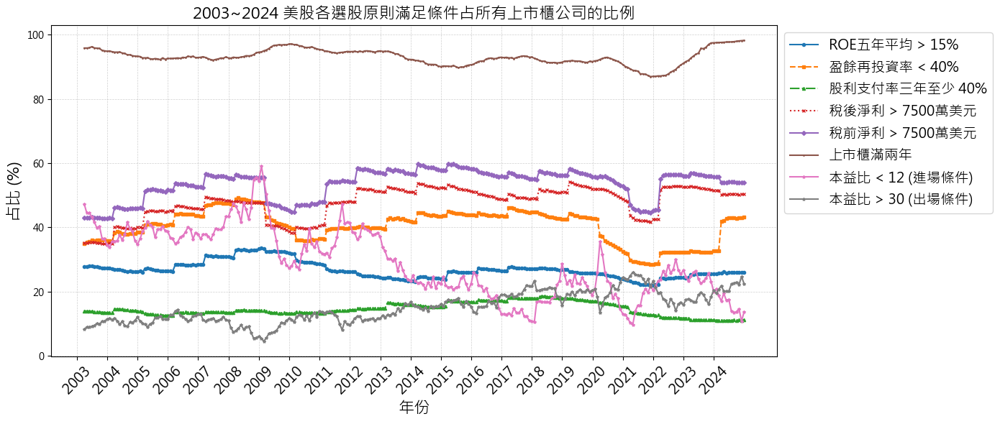

In [20]:
plt.figure(figsize=(14, 6))

roe_data = (roe_cond[START_DATE:END_DATE].sum(axis=1) / listed_df_count[START_DATE:END_DATE].sum(axis=1).resample('ME').last()) * 100
rr_data = (rr_cond[START_DATE:END_DATE].sum(axis=1) / listed_df_count[START_DATE:END_DATE].sum(axis=1).resample('ME').last()) * 100
payout_data = (payout_cond[START_DATE:END_DATE].sum(axis=1) / listed_df_count[START_DATE:END_DATE].sum(axis=1).resample('ME').last()) * 100
profit_data = (netprofit_cond[START_DATE:END_DATE].sum(axis=1) / listed_df_count[START_DATE:END_DATE].sum(axis=1).resample('ME').last()) * 100
bf_tax_data = (income_bf_tax_cond[START_DATE:END_DATE].sum(axis=1) / listed_df_count[START_DATE:END_DATE].sum(axis=1).resample('ME').last()) * 100
listed_data = (listed_cond[START_DATE:END_DATE].sum(axis=1) / listed_df_count[START_DATE:END_DATE].sum(axis=1).resample('ME').last()) * 100
pe_cond_entry_data = (daily_pe_entry[START_DATE:END_DATE].sum(axis=1) / listed_df_count[START_DATE:END_DATE].sum(axis=1).resample('ME').last()) * 100
pe_cond_exit_data = (daily_pe_exit[START_DATE:END_DATE].sum(axis=1) / listed_df_count[START_DATE:END_DATE].sum(axis=1).resample('ME').last()) * 100

# 繪製折線圖
plt.plot(roe_data.index, roe_data, marker='o', linestyle='-', markersize=3, label='ROE五年平均 > 15%')
plt.plot(rr_data.index, rr_data, marker='s', linestyle='--', markersize=3, label='盈餘再投資率 < 40%')
plt.plot(payout_data.index, payout_data, marker='^', linestyle='-.', markersize=3, label='股利支付率三年至少 40%')
plt.plot(profit_data.index, profit_data, marker='x', linestyle=':', markersize=3, label='稅後淨利 > 7500萬美元')
plt.plot(bf_tax_data.index, bf_tax_data, marker='D', linestyle='-', markersize=3, label='稅前淨利 > 7500萬美元')
plt.plot(listed_data.index, listed_data, marker='o', linestyle='-', markersize=1, label='上市櫃滿兩年')
plt.plot(pe_cond_entry_data.index, pe_cond_entry_data, marker='*', linestyle='-', markersize=3, label='本益比 < 12 (進場條件)')
plt.plot(pe_cond_exit_data.index, pe_cond_exit_data, marker='*', linestyle='-', markersize=3, label='本益比 > 30 (出場條件)')

# 設置 X 軸為每年年份
plt.xlabel("年份", fontsize=16)
plt.ylabel("占比 (%)", fontsize=16)
plt.title("2003~2024 美股各選股原則滿足條件占所有上市櫃公司的比例", fontsize=16)
plt.grid(True)
plt.xticks(
    ticks=pd.date_range(start="2003-01-01", end="2024-12-31", freq="YS"),
    labels=pd.date_range(start="2003-01-01", end="2024-12-31", freq="YS").strftime("%Y"),
    rotation=45,
    fontsize=14
)


plt.grid(linestyle='--', linewidth=0.5, alpha=0.6)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), fontsize=14)  # 將圖例移動到圖表右上角外
plt.tight_layout()
plt.show()

---

## 羅素1000清單

In [21]:
russell_1000_df = pd.read_csv('./russell_component_lists/russell_1000_company.csv')
russell_1000_symbol = russell_1000_df['Symbol'].to_list()
filtered_russell_1000_symbol = [symbol for symbol in russell_1000_symbol if symbol in close.columns]

## 回測

In [22]:
# 無本益比進出場 #
# 稅後淨利條件
orig_all_cond = (roe_cond & rr_cond & payout_cond & netprofit_cond & listed_cond)[START_DATE:END_DATE]
# 稅前淨利條件
orig_all_cond_inc_bf_tax = (roe_cond & rr_cond & payout_cond & income_bf_tax_cond & listed_cond)[START_DATE:END_DATE]

# 有本益比進出場 #
# 每季本益比 #
# 稅後淨利條件
orig_all_cond_and_pe = ((orig_all_cond & pe_cond_entry[START_DATE:END_DATE]).hold_until((~orig_all_cond) | pe_cond_exit[START_DATE:END_DATE]))
# 稅前淨利條件
orig_all_cond_and_pe_inc_bf_tax = ((orig_all_cond_inc_bf_tax & pe_cond_entry[START_DATE:END_DATE]).hold_until((~orig_all_cond_inc_bf_tax) | pe_cond_exit[START_DATE:END_DATE]))

# 每月月底本益比 #
# 稅後淨利條件
orig_all_cond_and_pe_daily = ((orig_all_cond & daily_pe_entry[START_DATE:END_DATE]).hold_until((~orig_all_cond) | daily_pe_exit[START_DATE:END_DATE]))
# 稅前淨利條件
orig_all_cond_and_pe_daily_inc_bf_tax = ((orig_all_cond_inc_bf_tax & daily_pe_entry[START_DATE:END_DATE]).hold_until((~orig_all_cond_inc_bf_tax) | daily_pe_exit[START_DATE:END_DATE]))

In [23]:
orig_all_cond_and_pe_daily_rep = backtest.sim(orig_all_cond_and_pe_daily, resample='ME', data=data)
orig_all_cond_and_pe_daily_rep.display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,10.78%,23.99,-53.11%,68.18%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
K,2018-05-01,2024-10-01,2018-04-30,2024-09-30,0.038462,1615.0,4611.0,6226.0,0.839346,-0.081862,0.853015,0.294657,-0.301000,1537.0,0.0000,0.000000
PSA,2022-12-01,2024-10-01,2022-11-30,2024-09-30,0.047619,459.0,5767.0,6226.0,0.308804,-0.162992,0.336935,0.081130,-0.225802,240.0,0.0000,0.000000
AFG,2023-04-03,NaT,2023-03-31,NaT,0.050000,440.0,5850.0,-1.0,0.189352,-0.117544,0.305772,0.018569,-0.133631,272.0,0.0625,0.066667
ALX,2024-05-01,NaT,2024-04-30,NaT,0.055556,169.0,6121.0,-1.0,-0.050157,-0.049177,0.182171,0.182171,-0.195698,144.0,0.0625,0.066667
AMCR,2023-11-01,NaT,2023-10-31,NaT,0.052632,293.0,5997.0,-1.0,0.126473,0.000000,0.370773,0.000000,-0.177093,292.0,0.0625,0.066667
APAM,2022-04-01,NaT,2022-03-31,NaT,0.055556,691.0,5599.0,-1.0,0.298113,-0.319052,0.491948,0.046187,-0.349114,391.0,0.0625,0.066667
BKE,2022-06-01,NaT,2022-05-31,NaT,0.052632,650.0,5640.0,-1.0,0.908807,-0.168051,1.042296,0.002266,-0.336138,599.0,0.0625,0.066667
CNA,2022-04-01,NaT,2022-03-31,NaT,0.055556,691.0,5599.0,-1.0,0.147731,-0.253471,0.243418,0.004308,-0.256673,231.0,0.0625,0.066667
CPB,2020-12-01,NaT,2020-11-30,2024-12-31,0.043478,1027.0,5263.0,-1.0,-0.063345,-0.179928,0.221067,0.056962,-0.318030,409.0,0.0625,0.000000


In [24]:
rep_all_cond_dic = {}

rep_all_cond_dic['美股_原始條件_稅後淨利_不含本益比進出場'] = orig_all_cond
rep_all_cond_dic['美股_原始條件_稅前淨利_不含本益比進出場'] = orig_all_cond_inc_bf_tax

# rep_all_cond_dic['美股_原始條件_稅後淨利_每季本益比進出場'] = orig_all_cond_and_pe
# rep_all_cond_dic['美股_原始條件_稅前淨利_每季本益比進出場'] = orig_all_cond_and_pe_inc_bf_tax

rep_all_cond_dic['美股_原始條件_稅後淨利_每月月底本益比進出場'] = orig_all_cond_and_pe_daily
rep_all_cond_dic['美股_原始條件_稅前淨利_每月月底本益比進出場'] = orig_all_cond_and_pe_daily_inc_bf_tax

In [25]:
rep_all_cond = sim_conditions(rep_all_cond_dic, resample='ME', data=data)

Backtesting progress: 100%|██████████| 4/4 [00:05<00:00,  1.48s/condition]


In [26]:
# rep_all_cond.plot_creturns()

In [27]:
# rep_all_cond.plot_stats()

In [28]:
rep_all_cond.selected_stock_count_analysis()

,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
美股_原始條件_稅前淨利_不含本益比進出場,11.04,-50.79,43.19,39.0,27.25,63.00,13.0,76.0
美股_原始條件_稅前淨利_每月月底本益比進出場,11.01,-51.16,22.81,24.0,18.00,28.00,10.0,37.0
美股_原始條件_稅後淨利_每月月底本益比進出場,10.78,-53.11,22.28,24.0,18.00,26.75,11.0,38.0
美股_原始條件_稅後淨利_不含本益比進出場,10.75,-52.54,41.71,37.0,28.00,58.00,14.0,75.0


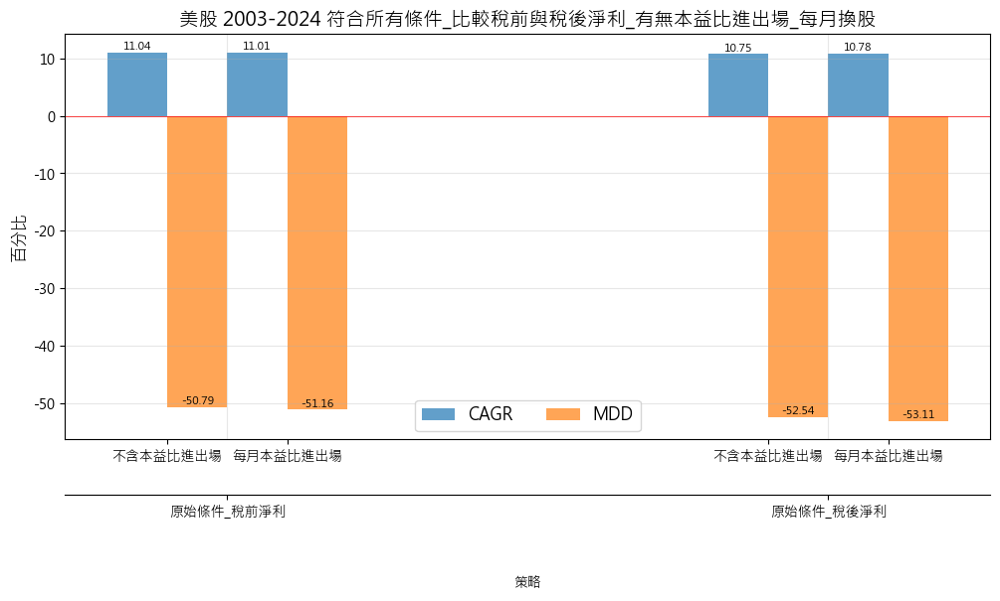

In [29]:
rep_all_cond_df = rep_all_cond.selected_stock_count_analysis()
rep_all_cond_df = rep_all_cond_df.reset_index()

# 分組資料
no_pe = rep_all_cond_df[rep_all_cond_df['Strategy'].str.contains('不含本益比進出場')]
monthly_pe = rep_all_cond_df[rep_all_cond_df['Strategy'].str.contains('月底本益比進出場')]

# 提取x軸標籤
no_pe_labels = [s.split('_')[1:3] for s in no_pe['Strategy']]
no_pe_labels = ['_'.join(label) for label in no_pe_labels]

# 設置圖表
plt.figure(figsize=(12, 6))
width = 0.1

# 設置x軸位置
x = range(len(no_pe_labels))

# 繪製bars
bars1 = plt.bar([i - width*1.5 for i in x], no_pe['CAGR (%)'], width, label='CAGR', color='tab:blue', alpha=0.7)
bars2 = plt.bar([i - width/2 for i in x], no_pe['MDD (%)'], width, label='MDD', color='tab:orange', alpha=0.7)
bars3 = plt.bar([i + width/2 for i in x], monthly_pe['CAGR (%)'], width, label='', color='tab:blue', alpha=0.7)
bars4 = plt.bar([i + width*1.5 for i in x], monthly_pe['MDD (%)'], width, label='', color='tab:orange', alpha=0.7)

# 添加數值標籤
for bar in bars1:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom', fontsize=8)

for bar in bars2:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom', fontsize=8)

for bar in bars3:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom', fontsize=8)

for bar in bars4:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom', fontsize=8)

# 獲取軸對象
ax = plt.gca()

# 設置Y軸刻度，以10為間隔
ax.yaxis.set_major_locator(plt.MultipleLocator(10))

# 設置網格線
plt.grid(True, alpha=0.3, which='both', axis='both')

# 設置主要x軸標籤（策略名稱）
ax.set_xticks([i for i in x])
ax.set_xticklabels(no_pe_labels, rotation=0)

# 添加次要x軸標籤（本益比條件）
ax2 = ax.secondary_xaxis('bottom') 
# 調整標籤位置，使其對齊對應的柱狀圖組
ax2.set_xticks([i - width for i in x] + [i + width for i in x])
ax2.set_xticklabels(['不含本益比進出場']*len(no_pe_labels) + ['每月本益比進出場']*len(no_pe_labels), fontsize=10)

# 移動主要x軸到次要x軸的下方
ax.xaxis.set_label_position('bottom')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('outward', 40))

# 設置圖表外觀
ax.set_xlabel('策略', labelpad=40)  # 增加labelpad使標籤遠離軸
ax.tick_params(axis='y', labelsize=10)

plt.ylabel('百分比', fontsize=12)
plt.title('美股 2003-2024 符合所有條件_比較稅前與稅後淨利_有無本益比進出場_每月換股', fontsize=14)
plt.legend(loc='lower center', ncol=2, fontsize=12)
plt.axhline(0, color='red', linewidth=0.5)

# 調整版面配置
plt.subplots_adjust(bottom=0.2)  # 增加底部空間以容納標籤

# 顯示圖表
plt.show()

In [30]:
# rep_all_cond.selected_stock_count_analysis(ratio=True)

In [31]:
rep_all_cond.holding_period_analysis()

,CAGR (%),MDD (%),持有期間平均,25%,中位數,75%,最大值,最小值
Strategy,,,,,,,,
美股_原始條件_稅前淨利_不含本益比進出場,11.04,-50.79,1118.937908,365.0,728.5,1460.5,7945.0,31.0
美股_原始條件_稅前淨利_每月月底本益比進出場,11.01,-51.16,944.911458,336.0,455.5,1105.0,5935.0,31.0
美股_原始條件_稅後淨利_每月月底本益比進出場,10.78,-53.11,923.067708,336.0,412.0,1066.0,5935.0,31.0
美股_原始條件_稅後淨利_不含本益比進出場,10.75,-52.54,1106.147157,365.0,701.0,1444.5,7945.0,31.0


---

In [32]:
# rep_all_cond.reports['美股_原始條件_稅後淨利_不含本益比進出場'].display()

In [33]:
orig_strat_pos, orig_strat_neg = rep_all_cond.reports['美股_原始條件_稅後淨利_不含本益比進出場'].calc_returns_contrib(5)

In [34]:
orig_daily_pe_strat_pos, orig_daily_pe_strat_neg = rep_all_cond.reports['美股_原始條件_稅後淨利_每月月底本益比進出場'].calc_returns_contrib(5)

In [35]:
# rep_all_cond.visualize_ytd_performance(['美股_原始條件_稅後淨利_不含本益比進出場', '美股_原始條件_稅後淨利_每月月底本益比進出場'])

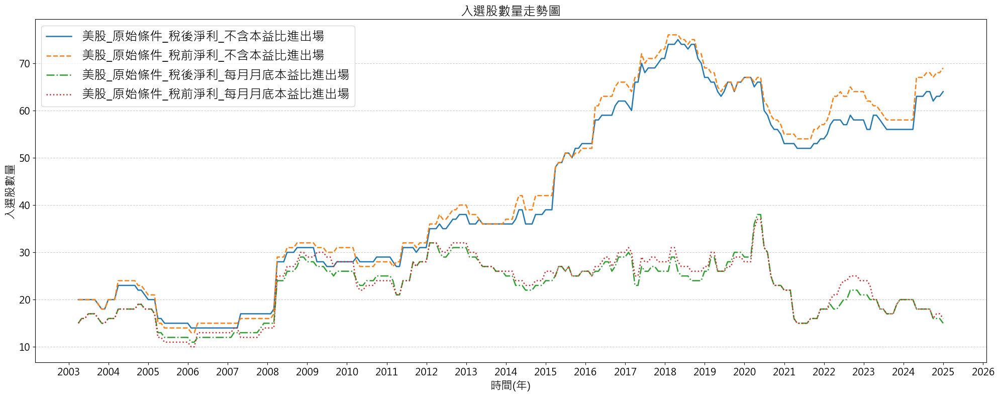

In [36]:
rep_all_cond.plot_reps_stock_counts()

In [37]:
# rep_all_cond.reports['美股_原始條件_稅後淨利_每月月底本益比進出場'].plot_company_counts()

## 切分時間段2003~2009、2009~2024

In [38]:
orig_all_cond_2003_2009 = (roe_cond & rr_cond & payout_cond & netprofit_cond & listed_cond)[START_DATE:'2009-3-31']
orig_all_cond_bftax_2003_2009 = (roe_cond & rr_cond & payout_cond & income_bf_tax_cond & listed_cond)[START_DATE:'2009-3-31']

orig_all_cond_2009_2024 = (roe_cond & rr_cond & payout_cond & netprofit_cond & listed_cond)['2009-3-31':END_DATE]
orig_all_cond_bftax_2009_2024 = (roe_cond & rr_cond & payout_cond & income_bf_tax_cond & listed_cond)['2009-3-31':END_DATE]

# all_cond_and_pe_2003_2009 = ((orig_all_cond_2003_2009 & pe_cond_entry[START_DATE:'2009-3-31']).hold_until((~orig_all_cond_2003_2009) | pe_cond_exit[START_DATE:'2009-3-31']))
# all_cond_and_pe_bftax_2003_2009 = ((orig_all_cond_bftax_2003_2009 & pe_cond_entry[START_DATE:'2009-3-31']).hold_until((~orig_all_cond_bftax_2003_2009) | pe_cond_exit[START_DATE:'2009-3-31']))

# all_cond_and_pe_2009_2024 = ((orig_all_cond_2009_2024 & pe_cond_entry['2009-3-31':END_DATE]).hold_until((~orig_all_cond_2009_2024) | pe_cond_exit['2009-3-31':END_DATE]))
# all_cond_and_pe_bftax_2009_2024 = ((orig_all_cond_bftax_2009_2024 & pe_cond_entry['2009-3-31':END_DATE]).hold_until((~orig_all_cond_bftax_2009_2024) | pe_cond_exit['2009-3-31':END_DATE]))

all_cond_and_pe_daily_2003_2009 = ((orig_all_cond_2003_2009 & daily_pe_entry[START_DATE:'2009-3-31']).hold_until((~orig_all_cond_2003_2009) | daily_pe_exit[START_DATE:'2009-3-31']))
all_cond_and_pe_daily_bftax_2003_2009 = ((orig_all_cond_bftax_2003_2009 & daily_pe_entry[START_DATE:'2009-3-31']).hold_until((~orig_all_cond_bftax_2003_2009) | daily_pe_exit[START_DATE:'2009-3-31']))

all_cond_and_pe_daily_2009_2024 = ((orig_all_cond_2009_2024 & daily_pe_entry['2009-3-31':END_DATE]).hold_until((~orig_all_cond_2009_2024) | daily_pe_exit['2009-3-31':END_DATE]))
all_cond_and_pe_daily_bftax_2009_2024 = ((orig_all_cond_bftax_2009_2024 & daily_pe_entry['2009-3-31':END_DATE]).hold_until((~orig_all_cond_bftax_2009_2024) | daily_pe_exit['2009-3-31':END_DATE]))

In [39]:
time_period_dic = {}

time_period_dic['美股_稅後淨利_不含本益比進出場_2003-2009'] = orig_all_cond_2003_2009
time_period_dic['美股_稅前淨利_不含本益比進出場_2003-2009'] = orig_all_cond_bftax_2003_2009
time_period_dic['美股_稅後淨利_不含本益比進出場_2009-2024'] = orig_all_cond_2009_2024
time_period_dic['美股_稅前淨利_不含本益比進出場_2009-2024'] = orig_all_cond_bftax_2009_2024

# time_period_dic['美股_稅後淨利_每季本益比進出場_2003-2009'] = all_cond_and_pe_2003_2009
# time_period_dic['美股_稅前淨利_每季本益比進出場_2003-2009'] = all_cond_and_pe_bftax_2003_2009
# time_period_dic['美股_稅後淨利_每季本益比進出場_2009-2024'] = all_cond_and_pe_2009_2024
# time_period_dic['美股_稅前淨利_每季本益比進出場_2009-2024'] = all_cond_and_pe_bftax_2009_2024

time_period_dic['美股_稅後淨利_每月月底本益比進出場_2003-2009'] = all_cond_and_pe_daily_2003_2009
time_period_dic['美股_稅前淨利_每月月底本益比進出場_2003-2009'] = all_cond_and_pe_daily_bftax_2003_2009
time_period_dic['美股_稅後淨利_每月月底本益比進出場_2009-2024'] = all_cond_and_pe_daily_2009_2024
time_period_dic['美股_稅前淨利_每月月底本益比進出場_2009-2024'] = all_cond_and_pe_daily_bftax_2009_2024

time_period_rep_collec = sim_conditions(time_period_dic, resample='ME', data=data)

Backtesting progress: 100%|██████████| 8/8 [00:09<00:00,  1.24s/condition]


In [40]:
time_period_rep_collec.selected_stock_count_analysis()

,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
美股_稅前淨利_不含本益比進出場_2009-2024,14.97,-38.26,52.08,56.5,37.0,65.0,27.0,76.0
美股_稅後淨利_不含本益比進出場_2009-2024,14.75,-38.83,50.11,53.5,36.0,62.0,27.0,75.0
美股_稅前淨利_每月月底本益比進出場_2009-2024,14.68,-39.46,25.21,26.0,23.0,28.0,15.0,37.0
美股_稅後淨利_每月月底本益比進出場_2009-2024,14.57,-39.38,24.48,25.0,22.0,27.0,15.0,38.0
美股_稅前淨利_每月月底本益比進出場_2003-2009,1.36,-51.16,16.63,15.0,13.0,18.0,10.0,30.0
美股_稅前淨利_不含本益比進出場_2003-2009,1.00,-50.79,19.90,18.0,15.0,24.0,13.0,32.0
美股_稅後淨利_每月月底本益比進出場_2003-2009,0.82,-53.11,16.56,15.0,12.0,18.0,11.0,29.0
美股_稅後淨利_不含本益比進出場_2003-2009,0.53,-52.54,19.67,18.0,15.0,23.0,14.0,31.0


In [41]:
def plot_grouped_bar_chart(df):
    # 重置索引
    df.reset_index(inplace=True)
    
    # 解析 Strategy column
    df[['條件', '策略', '時間段']] = df['Strategy'].str.split('_', expand=True).iloc[:, 1:]

    # 排除非數值列
    numeric_columns = df.select_dtypes(include='number').columns
    grouped = df.groupby(['條件', '策略', '時間段'])[numeric_columns].mean().reset_index()

    # 獲取 unique 的條件和策略
    conditions = grouped['條件'].unique()
    strategies = grouped['策略'].unique()

    # 設置 bar 的寬度和位置
    bar_width = 0.2
    index = range(len(conditions) * len(strategies))

    # 創建子圖
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 8))

    # 繪製 CAGR (%) 的 grouped bar chart
    for i, time_period in enumerate(['2003-2009', '2009-2024']):
        data = grouped[grouped['時間段'] == time_period]
        cagr_values = data['CAGR (%)'].values
        bar_positions = [x + i * bar_width for x in index]
        ax1.bar(bar_positions, cagr_values, bar_width, label=f'{time_period}')

    # 設置 x 軸標籤
    ax1.set_xticks([x + bar_width / 2 for x in index])
    ax1.set_xticklabels([f'{cond}_{strat}' for cond in conditions for strat in strategies], rotation=0, ha='center', fontsize=14)
    ax1.grid(True, alpha=0.3)

    # 添加標籤和標題
    ax1.set_xlabel('Strategy')
    ax1.set_ylabel('CAGR (%)', fontsize=14)
    ax1.yaxis.set_major_locator(FixedLocator(ax1.get_yticks()))
    ax1.yaxis.set_major_formatter(FixedFormatter([f'{int(x)}' for x in ax1.get_yticks()]))
    ax1.set_title('美股 2009-2009、2009-2024 不同時間段 CAGR 比較', fontsize=18)
    ax1.tick_params(axis='y', labelsize=16)  # 設置Y軸刻度字體大小

    # 繪製 MDD (%) 的 grouped bar chart
    for i, time_period in enumerate(['2003-2009', '2009-2024']):
        data = grouped[grouped['時間段'] == time_period]
        mdd_values = data['MDD (%)'].values
        bar_positions = [x + i * bar_width for x in index]
        ax2.bar(bar_positions, mdd_values, bar_width, label=f'{time_period}')

    # 設置 x 軸標籤
    ax2.set_xticks([x + bar_width / 2 for x in index])
    ax2.set_xticklabels([f'{cond}_{strat}' for cond in conditions for strat in strategies], rotation=0, ha='center', fontsize=14)

    # 添加標籤和標題
    ax2.set_xlabel('Strategy')
    ax2.set_ylabel('MDD (%)', fontsize=14)
    ax2.yaxis.set_major_locator(FixedLocator(ax2.get_yticks()))
    ax2.yaxis.set_major_formatter(FixedFormatter([f'{int(x)}' for x in ax2.get_yticks()]))
    ax2.set_title('美股 2009-2009、2009-2024 不同時間段 MDD 比較', fontsize=18)
    ax2.grid(True, alpha=0.3)
    ax2.tick_params(axis='y', labelsize=16)  # 設置Y軸刻度字體大小

    # 添加統一的 legend
    handles, labels = ax1.get_legend_handles_labels()
    fig.legend(handles, labels, loc='lower center', ncol=2, fontsize=18)

    plt.tight_layout(rect=[0, 0.05, 1, 1])
    plt.show()

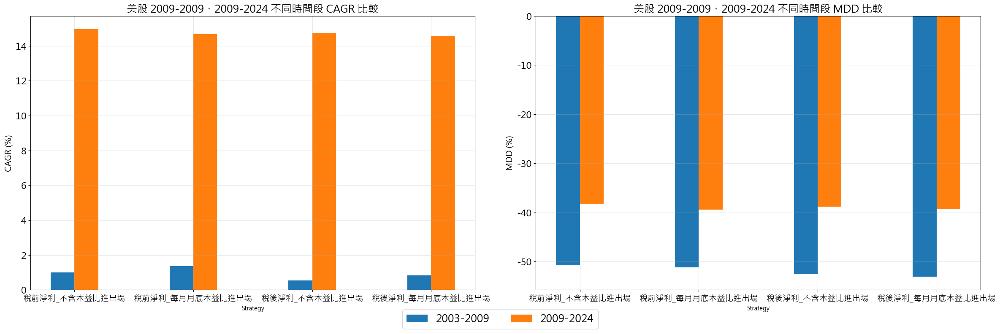

In [42]:
time_period_test_df = time_period_rep_collec.selected_stock_count_analysis()
plot_grouped_bar_chart(time_period_test_df)

In [43]:
us_bench = data.get('ruaindex:close')[START_DATE:END_DATE]
us_bench['close'] = us_bench['close'] / us_bench['close'].iloc[0]

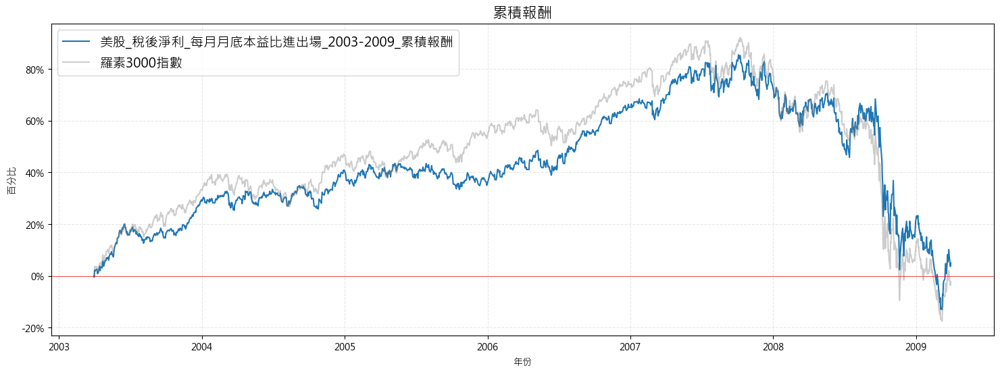

In [44]:
cum_returns = time_period_rep_collec.reports['美股_稅後淨利_每月月底本益比進出場_2003-2009'].stock_data['cum_returns']
us_close = us_bench['close'].reindex(cum_returns.index)

plt.figure(figsize=(18, 6))

# Plot cumulative returns
plt.plot(cum_returns.index, cum_returns, label='美股_稅後淨利_每月月底本益比進出場_2003-2009_累積報酬')

# Plot normalized close prices
plt.plot(us_close.index, us_close, label='羅素3000指數', color='gray', alpha=0.4)

plt.xlabel('年份')
plt.ylabel('百分比')
plt.axhline(1, color='red', linewidth=0.5)
plt.title('累積報酬', fontsize=16)
plt.legend(fontsize=14)
plt.grid(True, alpha=0.3, linestyle='--')

# Custom y-ticks formatter
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, pos: f'{(x - 1) * 100:.0f}%'))

plt.show()


## Rerun

In [45]:
# time_period_rep_collec.reports['美股_稅後淨利_每月月底本益比進出場_2003-2009'].plot_strategy_cumm_return(title='美股_原始條件_每月月底本益比進出場_2003-2009_累積報酬')

In [46]:
# cum_returns = rep_all_cond.reports['美股_原始條件_稅後淨利_每月月底本益比進出場'].stock_data['cum_returns']
# us_close = us_bench['close'].reindex(cum_returns.index)

# plt.figure(figsize=(18, 6))

# # Plot cumulative returns
# plt.plot(cum_returns.index, cum_returns, label='美股_原始條件_稅後淨利_每月月底本益比進出場_2003-2024_累積報酬')

# # Plot normalized close prices
# plt.plot(us_close.index, us_close, label='羅素3000指數', color='gray', alpha=0.4)

# plt.xlabel('年份')
# plt.ylabel('百分比')
# plt.axhline(1, color='red', linewidth=0.5)
# plt.title('累積報酬', fontsize=16)
# plt.legend(fontsize=14)
# plt.grid(True, alpha=0.3, linestyle='--')

# # Custom y-ticks formatter
# plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, pos: f'{(x - 1) * 100:.0f}%'))

# plt.show()


In [47]:
# rep_all_cond.reports['美股_原始條件_稅後淨利_每月月底本益比進出場'].plot_strategy_cumm_return(title='美股_原始條件_每月月底本益比進出場_2003-2024_累積報酬')

## 美股_布林通道濾網

In [48]:
us_benchmark = data.get('ruaindex:close')['2002':'2024']
upperband, middleband, lowerband = talib.BBANDS(us_benchmark.close, timeperiod=300, nbdevup=2.0, nbdevdn=2.0)

### 建立濾網
1. 第一次跌破下通道先記錄下來，等到下一次跌破而且到更低的收盤價賣出
2. 等回到均線之上再買入

In [49]:
# 創建一個買賣訊號的DataFrame，初始值全部為True
us_bollinger_signal = pd.Series(True, index=us_benchmark.index)

# 記錄第一次跌破的價格
first_break_price = None
# 記錄是否已經回到lower band之上
crossed_above_lower = False
# 是否進入持續的 False 狀態直到突破中通道
in_selling_state = False

# 遍歷所有的日期
for date in us_benchmark.index:
    price = us_benchmark.close[date]
    lower = lowerband[date]
    middle = middleband[date]
    
    # 第一次跌破下通道
    if price < lower and first_break_price is None:
        first_break_price = price
        crossed_above_lower = False
    
    # 價格回到下通道之上
    elif price > lower:
        crossed_above_lower = True
    
    # 再次跌破下通道且符合賣出條件
    if price < lower and crossed_above_lower and price < first_break_price:

        # print(f'{date} - {price} - {lower} - {first_break_price}')
        
        us_bollinger_signal[date] = False
        in_selling_state = True
    
    # 突破中通道則重置狀態
    if price > middle:
        us_bollinger_signal[date] = True
        first_break_price = None
        crossed_above_lower = False
        in_selling_state = False
    
    # 在突破中通道之前保持賣出狀態
    if in_selling_state and price <= middle:
        us_bollinger_signal[date] = False

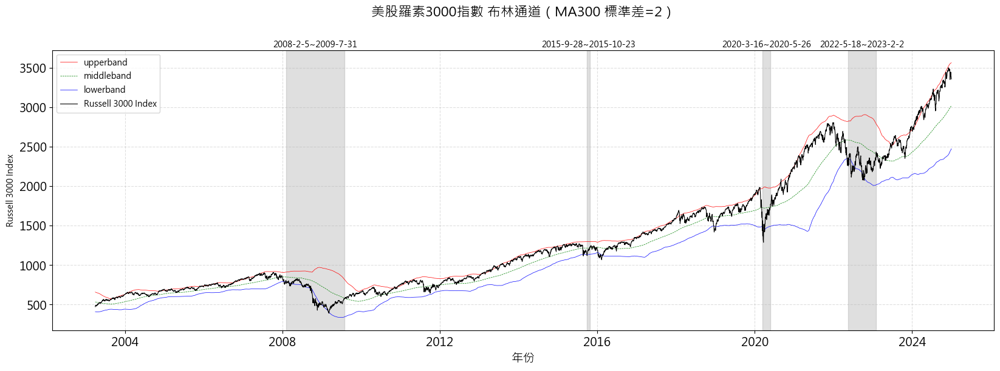

In [50]:
plt.figure(figsize=(20, 6))

plt.plot(upperband['2003-3-31':'2024'],
         label="upperband",color='r',
         linestyle='solid', linewidth=0.5)
plt.plot(middleband['2003-3-31':'2024'],
         label="middleband",color='g',linestyle='--', linewidth=0.5)
plt.plot(lowerband['2003-3-31':'2024'],
         label="lowerband",color='b',
         linestyle='solid', linewidth=0.5)
plt.plot(us_benchmark['2003-3-31':'2024'],
         label="Russell 3000 Index",color='black', linewidth=0.8)

# # 添加背景顏色
# plt.axvspan(pd.Timestamp('2008-2-5'), pd.Timestamp('2009-7-31'), color='gray', alpha=0.25)
# plt.axvspan(pd.Timestamp('2015-9-28'), pd.Timestamp('2015-10-23'), color='gray', alpha=0.25)
# plt.axvspan(pd.Timestamp('2020-3-16'), pd.Timestamp('2020-5-26'), color='gray', alpha=0.25)
# plt.axvspan(pd.Timestamp('2022-5-18'), pd.Timestamp('2023-2-2'), color='gray', alpha=0.25)

spans = [
    ('2008-2-5', '2009-7-31'),
    ('2015-9-28', '2015-10-23'),
    ('2020-3-16', '2020-5-26'),
    ('2022-5-18', '2023-2-2')
]

# 繪製灰底和添加標籤
for start, end in spans:
    # 添加灰底
    plt.axvspan(pd.Timestamp(start), pd.Timestamp(end), color='gray', alpha=0.25)
    
    # 計算區間中點位置(用於放置標籤)
    mid_point = pd.Timestamp(start) + (pd.Timestamp(end) - pd.Timestamp(start))/2
    
    # 添加日期區間標籤
    label_text = f'{start}~{end}'
    plt.text(mid_point, plt.ylim()[1]*1.01, label_text,
             horizontalalignment='center',
             fontsize=10)

plt.title("美股羅素3000指數 布林通道（MA300 標準差=2）", fontsize=16, pad=40) 
plt.xlabel("年份", fontsize=14)
plt.xticks(fontsize=14)
plt.ylabel("Russell 3000 Index")
plt.yticks(fontsize=14)

plt.legend()
plt.grid(True, linestyle='--', alpha=0.4)
plt.show()

In [51]:
bolling_filt = orig_all_cond.copy()

# 將 df 的 index 對齊 us_bollinger_signal_1 的 index，並填充為 True，這樣可以保證日期範圍內的所有日期都包括
aligned_signal = us_bollinger_signal.reindex(bolling_filt.index, method='ffill', fill_value=True)

# 將 df 中日期對應的行設置為 aligned_signal 的值
bolling_filt.loc[aligned_signal.index, :] = aligned_signal.values[:, None]

In [52]:
filtered_russell_1000_symbol = [symbol for symbol in filtered_russell_1000_symbol if symbol not in ['ALAB', 'LOAR']]

In [53]:
# END_DATE = '2009-3-31'

In [54]:
# bf_tax_cond = income_bf_tax > 75000000
orig_cond_bft = rr_cond & roe_cond & income_bf_tax_cond & payout_cond & listed_cond
nodpr_bft_cond = rr_cond & roe_cond & income_bf_tax_cond & listed_cond


overall_russell_filt_conds = {}

# overall_conds['所有條件_盈再率<80_無本益比'] = orig_cond
overall_russell_filt_conds['所有條件_無本益比'] = orig_all_cond[START_DATE:END_DATE]
# overall_conds['所有條件_無本益比_稅前淨利'] = orig_cond_bft[START_DATE:END_DATE]
overall_russell_filt_conds['所有條件_無本益比_羅素1000'] = orig_all_cond[filtered_russell_1000_symbol][START_DATE:END_DATE]
overall_russell_filt_conds['所有條件_無本益比_羅素1000_布林通道'] = (orig_all_cond[filtered_russell_1000_symbol] & bolling_filt)[START_DATE:END_DATE]
# overall_conds['所有條件_無本益比_稅前淨利_羅素1000'] = orig_cond_bft[START_DATE:END_DATE][filtered_russell_1000_symbol]
overall_russell_filt_conds['所有條件_無本益比_布林通道'] = (orig_all_cond & bolling_filt)[START_DATE:END_DATE]
overall_russell_filt_conds['所有條件_無本益比_ROE出場條件'] = (orig_all_cond & (roe > 0.15))[START_DATE:END_DATE]
overall_russell_filt_conds['所有條件_無本益比_ROE出場條件_布林通道'] = (orig_all_cond[START_DATE:END_DATE] & bolling_filt[START_DATE:END_DATE] & (roe[START_DATE:END_DATE] > 0.15))[START_DATE:END_DATE]
overall_russell_filt_conds['所有條件_無本益比_ROE出場條件_羅素1000'] = (orig_all_cond & (roe[START_DATE:END_DATE] > 0.15))[filtered_russell_1000_symbol][START_DATE:END_DATE]
overall_russell_filt_conds['所有條件_無本益比_ROE出場條件_羅素1000_布林通道'] = (orig_all_cond & bolling_filt & (roe[START_DATE:END_DATE] > 0.15))[filtered_russell_1000_symbol][START_DATE:END_DATE]

# overall_conds['所有條件_盈再率<80_每季本益比'] = orig_quarter_pe
overall_russell_filt_conds['所有條件_有本益比'] = orig_all_cond_and_pe_daily
overall_russell_filt_conds['所有條件_有本益比_ROE出場條件'] = (orig_all_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 0.15))
overall_russell_filt_conds['所有條件_有本益比_布林通道'] = (orig_all_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE] & bolling_filt[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE] | ~bolling_filt[START_DATE:END_DATE])
overall_russell_filt_conds['所有條件_有本益比_ROE出場條件_布林通道'] = (orig_all_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE] & bolling_filt[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 0.15) | ~bolling_filt[START_DATE:END_DATE])
overall_russell_filt_conds['所有條件_有本益比_ROE出場條件_羅素1000_布林通道'] = (orig_all_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE] & bolling_filt[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 0.15) | ~bolling_filt[START_DATE:END_DATE])[filtered_russell_1000_symbol]


# overall_conds['所有條件_有本益比_稅前淨利'] = (orig_cond_bft[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE]).hold_until((~orig_cond_bft[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE])
overall_russell_filt_conds['所有條件_有本益比_羅素1000'] = orig_all_cond_and_pe_daily[filtered_russell_1000_symbol][START_DATE:END_DATE]
overall_russell_filt_conds['所有條件_有本益比_羅素1000_布林通道'] = (orig_all_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE] & bolling_filt[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE] | ~bolling_filt[START_DATE:END_DATE])[filtered_russell_1000_symbol]
overall_russell_filt_conds['所有條件_有本益比_ROE出場條件_羅素1000'] = (orig_all_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE] & bolling_filt[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 0.15))[filtered_russell_1000_symbol] 
# overall_conds['所有條件_有本益比_稅前淨利_羅素1000'] = (orig_cond_bft[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE]).hold_until((~orig_cond_bft[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE])[filtered_russell_1000_symbol]

# # overall_conds['去掉配息盈再率<80_無本益比'] = test_cond
# overall_conds['去掉配息_無本益比'] = nodpr_cond_opt
# # overall_conds['去掉配息_無本益比_稅前淨利'] = nodpr_bft_cond[START_DATE:END_DATE]
# overall_conds['去掉配息_無本益比_羅素1000'] = nodpr_cond_opt_filter
# # overall_conds['去掉配息_無本益比_稅前淨利_羅素1000'] = nodpr_bft_cond[START_DATE:END_DATE][filtered_russell_1000_symbol]
# # overall_conds['去掉配息_盈再率<80_每季本益比'] = test_noDPR_pe
# overall_conds['去掉配息_無本益比_布林通道'] = nodpr_cond_opt & bolling_1_filt

# overall_conds['去掉配息_有本益比'] = opt_noDPR_pe
# overall_conds['去掉配息_有本益比_ROE出場條件'] = (nodpr_cond_opt & daily_pe_entry[START_DATE:END_DATE]).hold_until((~nodpr_cond_opt) | daily_pe_exit[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 0.15))
# # overall_conds['去掉配息_有本益比_稅前淨利'] = (nodpr_bft_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE]).hold_until((~nodpr_bft_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE])
# overall_conds['去掉配息_有本益比_布林通道'] = (nodpr_cond_opt & daily_pe_entry[START_DATE:END_DATE]).hold_until((~nodpr_cond_opt) | daily_pe_exit[START_DATE:END_DATE] | ~bolling_1_filt)
# overall_conds['去掉配息_有本益比_布林通道_ROE出場條件'] = (nodpr_cond_opt & daily_pe_entry[START_DATE:END_DATE]).hold_until((~nodpr_cond_opt) | daily_pe_exit[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 0.15) | ~bolling_1_filt)

# overall_conds['去掉配息_有本益比_羅素1000'] = opt_noDPR_pe_filt
# overall_conds['去掉配息_有本益比_羅素1000_ROE出場條件'] = (nodpr_cond_opt_filter & daily_pe_entry[START_DATE:END_DATE]).hold_until((~nodpr_cond_opt_filter) | daily_pe_exit[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 0.15))
# # overall_conds['去掉配息_有本益比_稅前淨利_羅素1000'] = (nodpr_bft_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE]).hold_until((~nodpr_bft_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE])[filtered_russell_1000_symbol]


# overall_conds['單一條件_ROE五年平均'] = roe_cond[START_DATE:END_DATE]
# # overall_conds['單一條件_ROE五年平均_布林通道'] = roe_cond[START_DATE:END_DATE] & bolling_1_filt
# overall_conds['單一條件_ROE五年平均_羅素1000'] = roe_cond[START_DATE:END_DATE][filtered_russell_1000_symbol]

# overall_conds['單一條件_盈再率<40%'] = rr_cond[START_DATE:END_DATE]
# overall_conds['單一條件_盈再率<40%_羅素1000'] = rr_cond[START_DATE:END_DATE][filtered_russell_1000_symbol]
# # overall_conds['單一條件_盈再率<80%'] = (rr<0.8)[START_DATE:END_DATE]


overall_russell_filt_collecs = sim_conditions(overall_russell_filt_conds, resample='ME', data=data)
overall_russell_filt_collecs.selected_stock_count_analysis()

Backtesting progress: 100%|██████████| 16/16 [00:20<00:00,  1.30s/condition]


,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
所有條件_無本益比_ROE出場條件_羅素1000,12.41,-45.81,31.05,31.0,21.0,43.00,8.0,50.0
所有條件_有本益比_ROE出場條件_羅素1000_布林通道,11.92,-37.97,10.99,10.0,7.0,17.00,0.0,24.0
所有條件_無本益比_羅素1000,11.60,-49.98,35.50,34.0,25.0,48.00,13.0,59.0
所有條件_有本益比_ROE出場條件,11.55,-50.62,19.11,20.0,15.0,23.00,8.0,32.0
所有條件_有本益比_ROE出場條件_羅素1000,11.37,-51.44,14.56,14.0,12.0,18.00,7.0,24.0
所有條件_無本益比_ROE出場條件,11.35,-48.60,36.34,34.0,22.0,53.00,9.0,62.0
所有條件_有本益比_ROE出場條件_布林通道,11.15,-37.20,13.33,12.0,10.0,19.00,0.0,26.0
所有條件_無本益比_ROE出場條件_羅素1000_布林通道,11.05,-37.42,27.07,29.0,13.0,42.00,0.0,50.0
所有條件_有本益比_羅素1000,10.88,-50.26,18.33,18.0,15.0,22.75,10.0,27.0


In [55]:
overall_russell_filt_collecs.reports['所有條件_有本益比_ROE出場條件_羅素1000_布林通道'].display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,11.92%,24.62,-37.97%,74.14%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
PSA,2023-03-01,2024-10-01,2023-02-28,2024-09-30,0.250000,399,5827,6226,0.299071,-0.169169,0.327068,0.073150,-0.225802,184.0,0.000000,0.000000
AFG,2023-04-03,NaT,2023-03-31,NaT,0.166667,440,5850,-1,0.189352,-0.117544,0.305772,0.018569,-0.133631,272.0,0.166667,0.166667
AMCR,2023-11-01,NaT,2023-10-31,NaT,0.125000,293,5997,-1,0.126473,0.000000,0.370773,0.000000,-0.177093,292.0,0.166667,0.166667
EOG,2024-05-01,NaT,2024-04-30,NaT,0.142857,169,6121,-1,-0.060136,-0.090120,0.058040,0.014258,-0.134173,40.0,0.166667,0.166667
IPG,2023-11-01,NaT,2023-10-31,NaT,0.125000,293,5997,-1,0.020147,-0.014706,0.191544,0.191544,-0.173095,291.0,0.166667,0.166667
OMC,2023-09-01,NaT,2023-08-31,NaT,0.166667,335,5955,-1,0.105809,-0.088186,0.357152,0.000000,-0.179933,275.0,0.166667,0.166667
OMF,2023-03-01,NaT,2023-02-28,NaT,0.250000,463,5827,-1,0.376436,-0.218085,0.527394,0.005319,-0.257811,324.0,0.166667,0.166667


In [56]:
russell_filt_df = overall_russell_filt_collecs.selected_stock_count_analysis()

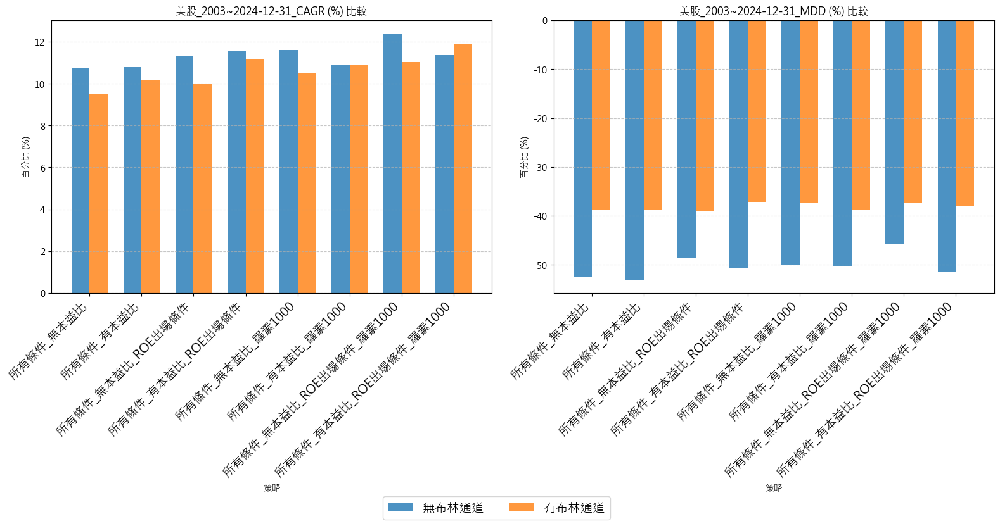

In [57]:
def plot_grouped_bolling_chart(russell_filt_df):

    df = russell_filt_df.copy()
    df.reset_index(inplace=True)
    
    # 創建新的欄位來標記是否包含布林通道
    df['has_bolling'] = df['Strategy'].str.contains('布林通道')
    
    # 獲取基本策略名稱（布林通道之前的部分）
    def get_base_strategy(strategy):
        if '布林通道' in strategy:
            return strategy.split('_布林通道')[0]
        return strategy
    
    df['base_strategy'] = df['Strategy'].apply(get_base_strategy)
    
    # 定義策略順序
    strategy_order = [
        "所有條件_無本益比",
        "所有條件_有本益比",
        "所有條件_無本益比_ROE出場條件",
        "所有條件_有本益比_ROE出場條件",
        "所有條件_無本益比_羅素1000",
        "所有條件_有本益比_羅素1000",
        "所有條件_無本益比_ROE出場條件_羅素1000",
        "所有條件_有本益比_ROE出場條件_羅素1000"
    ]
    
    # 按照指定順序篩選基本策略
    base_strategies = [s for s in strategy_order if s in df['base_strategy'].unique()]
    n_strategies = len(base_strategies)
    
    # 準備繪圖數據
    metrics = ['CAGR (%)', 'MDD (%)']
    
    # 設置圖形大小和樣式
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(max(16, n_strategies * 2), 8))
    bar_width = 0.35
    
    # 設置每組柱狀圖的位置
    indices = range(n_strategies)
    
    # 繪製分組柱狀圖
    for i, (metric, ax) in enumerate(zip(metrics, [ax1, ax2])):
        # 無布林通道的數據
        no_bolling_values = [
            df[(df['base_strategy'] == strategy) & (~df['has_bolling'])][metric].iloc[0]
            if len(df[(df['base_strategy'] == strategy) & (~df['has_bolling'])]) > 0
            else None
            for strategy in base_strategies
        ]
        
        # 有布林通道的數據
        with_bolling_values = [
            df[(df['base_strategy'] == strategy) & (df['has_bolling'])][metric].iloc[0]
            if len(df[(df['base_strategy'] == strategy) & (df['has_bolling'])]) > 0
            else None
            for strategy in base_strategies
        ]
        
        # 繪製柱狀圖
        ax.bar([x - bar_width/2 for x in indices],
               [v for v in no_bolling_values if v is not None],
               bar_width,
               label='無布林通道',
               alpha=0.8)
        
        ax.bar([x + bar_width/2 for x in indices],
               [v for v in with_bolling_values if v is not None],
               bar_width,
               label='有布林通道',
               alpha=0.8)
        
        # 設置圖表樣式
        ax.set_xlabel('策略')
        ax.set_ylabel('百分比 (%)')
        ax.set_title(f'美股_2003~{END_DATE}_{metric} 比較')
        ax.set_xticks(indices)
        ax.set_xticklabels(base_strategies, rotation=45, ha='right', fontsize=14)
        # ax.legend()
        ax.grid(axis='y', linestyle='--', alpha=0.7)
    
    # 添加共同的legend在底部中央
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, 
            loc='center',
            bbox_to_anchor=(0.5, -0.01),  # 調整legend的位置
            ncol=2,  # 將legend排成兩列
            fontsize=14,
            title_fontsize=16)

    # 調整版面配置
    plt.tight_layout()
    
    plt.show()


plot_grouped_bolling_chart(russell_filt_df)

In [58]:
# overall_russell_filt_collecs.plot_reps_stock_counts(['所有條件_有本益比', '所有條件_有本益比_ROE出場條件', '所有條件_有本益比_羅素1000', '所有條件_有本益比_ROE出場條件_羅素1000', '所有條件_有本益比_布林通道', '所有條件_有本益比_ROE出場條件_布林通道', '所有條件_有本益比_羅素1000_布林通道', '所有條件_有本益比_ROE出場條件_羅素1000_布林通道'])

In [59]:
# overall_russell_filt_collecs.plot_reps_stock_counts(['所有條件_無本益比_布林通道', '所有條件_無本益比_ROE出場條件_布林通道', '所有條件_無本益比_羅素1000_布林通道', '所有條件_無本益比_ROE出場條件_羅素1000_布林通道'])

In [60]:
# overall_russell_filt_collecs.plot_reps_stock_counts(['所有條件_有本益比_布林通道', '所有條件_有本益比_ROE出場條件_布林通道', '所有條件_有本益比_羅素1000_布林通道', '所有條件_有本益比_ROE出場條件_羅素1000_布林通道'])

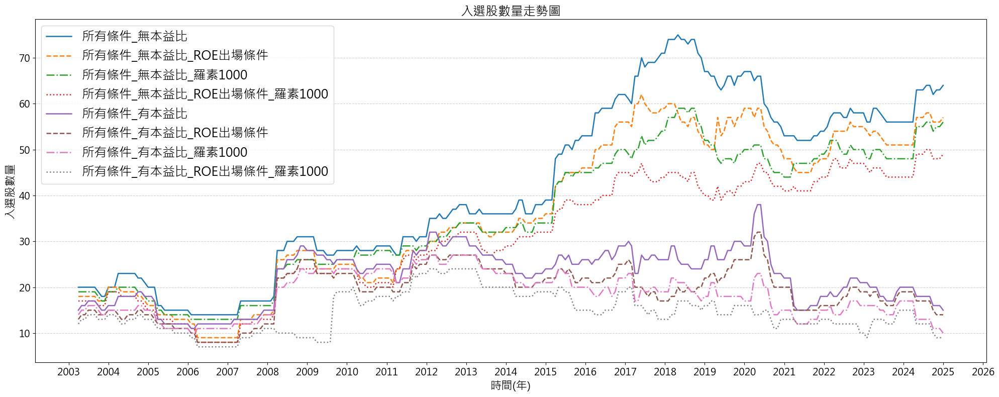

In [61]:
overall_russell_filt_collecs.plot_reps_stock_counts(['所有條件_無本益比', '所有條件_無本益比_ROE出場條件', '所有條件_無本益比_羅素1000', '所有條件_無本益比_ROE出場條件_羅素1000', '所有條件_有本益比', '所有條件_有本益比_ROE出場條件', '所有條件_有本益比_羅素1000', '所有條件_有本益比_ROE出場條件_羅素1000'])

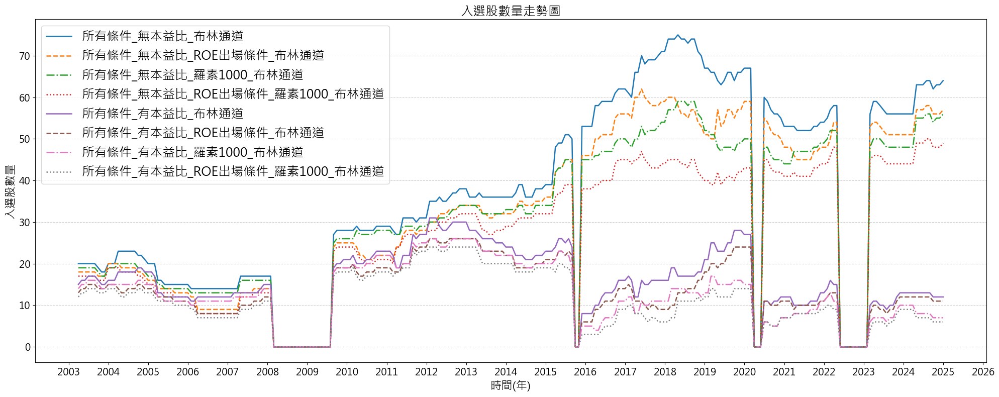

In [62]:
overall_russell_filt_collecs.plot_reps_stock_counts(['所有條件_無本益比_布林通道', '所有條件_無本益比_ROE出場條件_布林通道', '所有條件_無本益比_羅素1000_布林通道', '所有條件_無本益比_ROE出場條件_羅素1000_布林通道', '所有條件_有本益比_布林通道', '所有條件_有本益比_ROE出場條件_布林通道', '所有條件_有本益比_羅素1000_布林通道', '所有條件_有本益比_ROE出場條件_羅素1000_布林通道'])

Backtesting progress: 100%|██████████| 5/5 [00:05<00:00,  1.02s/condition]


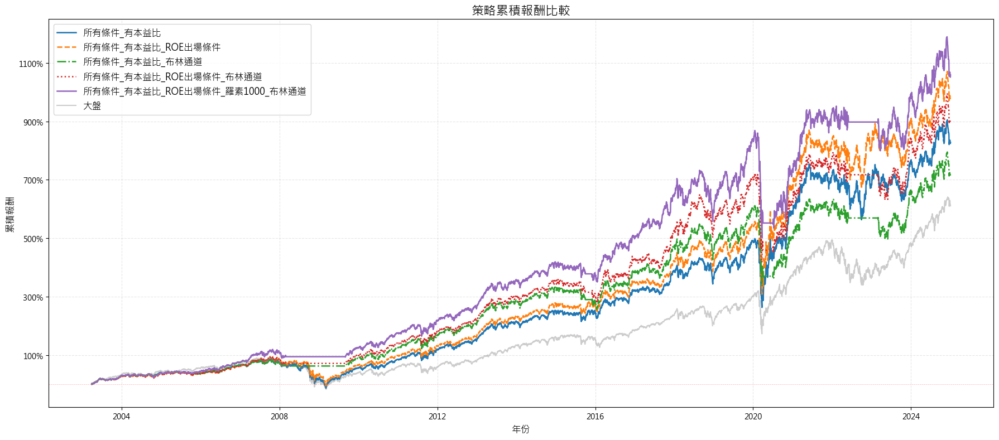

In [63]:
pe_russell_filt_conds = {}

pe_russell_filt_conds['所有條件_有本益比'] = orig_all_cond_and_pe_daily[START_DATE:END_DATE]
pe_russell_filt_conds['所有條件_有本益比_ROE出場條件'] = (orig_all_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 0.15))
pe_russell_filt_conds['所有條件_有本益比_布林通道'] = (orig_all_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE] & bolling_filt[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE] | ~bolling_filt[START_DATE:END_DATE])
pe_russell_filt_conds['所有條件_有本益比_ROE出場條件_布林通道'] = (orig_all_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE] & bolling_filt[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 0.15) | ~bolling_filt[START_DATE:END_DATE])
pe_russell_filt_conds['所有條件_有本益比_ROE出場條件_羅素1000_布林通道'] = (orig_all_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE] & bolling_filt[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 0.15) | ~bolling_filt[START_DATE:END_DATE])[filtered_russell_1000_symbol]

pe_russell_filt_collecs = sim_conditions(pe_russell_filt_conds, resample='ME', data=data)

pe_russell_filt_collecs.plot_strategies_cumm_return()

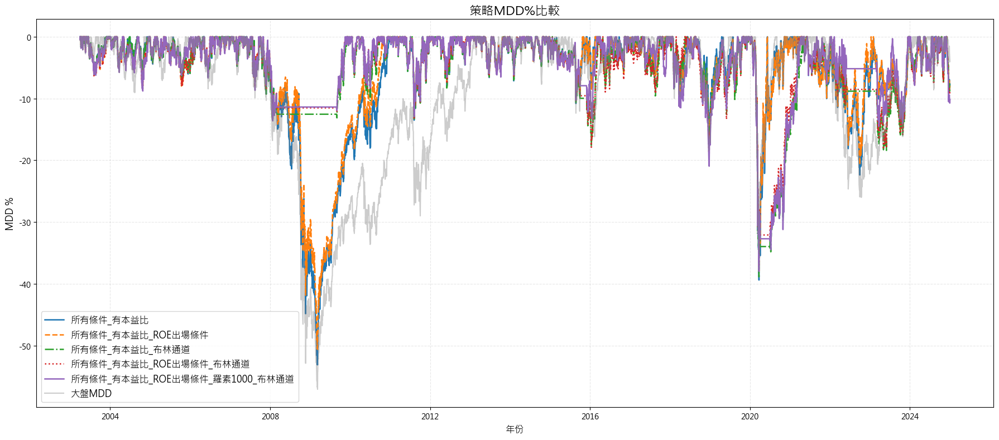

In [64]:
pe_russell_filt_collecs.plot_strategies_MDD()

---

## 不同換股頻率實驗

### 每季本益比

In [65]:
# 每年底 resample
pe_cond_entry_A = (pe < 12).resample('YE').last()[START_DATE:END_DATE]
pe_cond_exit_A = (pe > 30).resample('YE').last()[START_DATE:END_DATE]
all_cond_A = orig_all_cond.resample('YE').last()[START_DATE:END_DATE]

all_cond_pe_A = (all_cond_A & pe_cond_entry_A).hold_until(~all_cond_A | pe_cond_exit_A)
all_cond_pe_A_rep = backtest.sim(all_cond_pe_A, resample='YE', data=data)

# 每年三月底 resample
pe_cond_entry_AMAR = (pe < 12).resample('YE-MAR').last()[START_DATE:END_DATE]
pe_cond_exit_AMAR = (pe > 30).resample('YE-MAR').last()[START_DATE:END_DATE]
all_cond_AMAR = orig_all_cond.resample('YE-MAR').last()[START_DATE:END_DATE]

all_cond_pe_AMAR = (all_cond_AMAR & pe_cond_entry_AMAR).hold_until(~all_cond_AMAR | pe_cond_exit_AMAR)
all_cond_pe_AMAR_rep = backtest.sim(all_cond_pe_AMAR, resample='YE-MAR', data=data)

# 三月底 + 15天
all_cond_pe_AMAR15_rep = backtest.sim(all_cond_pe_AMAR, resample='YE-MAR', resample_offset='15D', data=data)

# 每季 resample
pe_cond_entry_Q = (pe < 12).resample('QE').last()[START_DATE:END_DATE]
pe_cond_exit_Q = (pe > 30).resample('QE').last()[START_DATE:END_DATE]
all_cond_Q = orig_all_cond.resample('QE').last()[START_DATE:END_DATE]

all_cond_pe_Q = (all_cond_Q & pe_cond_entry_Q).hold_until(~all_cond_Q| pe_cond_exit_Q )
all_cond_pe_Q_rep = backtest.sim(all_cond_pe_Q, resample='QE', data=data)

# 每月月初 resample
pe_cond_entry_MS = (pe < 12).resample('MS').first()[START_DATE:END_DATE]
pe_cond_exit_MS = (pe > 30).resample('MS').first()[START_DATE:END_DATE]
all_cond_MS = orig_all_cond.resample('MS').first()[START_DATE:END_DATE]

all_cond_pe_MS = (all_cond_MS & pe_cond_entry_MS).hold_until(~all_cond_MS | pe_cond_exit_MS)
all_cond_pe_MS_rep = backtest.sim(all_cond_pe_MS, resample='MS', data=data)

all_cond_pe_M15_rep = backtest.sim(all_cond_pe_MS, resample='MS', resample_offset='15D', data=data)

# # 每月月底 resample
# # pe_cond_entry_M = (pe < 12).resample('ME').last()[START_DATE:END_DATE]
# # pe_cond_exit_M = (pe > 30).resample('ME').last()[START_DATE:END_DATE]

# all_cond_pe_M = (orig_all_cond & pe_entry).hold_until(~orig_all_cond | pe_exit)
# all_cond_pe_M_rep = backtest.sim(all_cond_pe_M, resample='ME', data=data)

In [66]:
# # 每月月初 resample
# pe_cond_entry_MS = (pe < 12).resample('MS').first()[START_DATE:END_DATE]
# pe_cond_exit_MS = (pe > 30).resample('MS').first()[START_DATE:END_DATE]

all_cond_pe_MS_rep = backtest.sim(orig_all_cond_and_pe, resample='MS', data=data)

all_cond_pe_M15_rep = backtest.sim(orig_all_cond_and_pe, resample='MS', resample_offset='15D', data=data)

# # 每月月底 resample
# pe_cond_entry_M = (pe < 12).resample('ME').last()[START_DATE:END_DATE]
# pe_cond_exit_M = (pe > 30).resample('ME').last()[START_DATE:END_DATE]

all_cond_pe_M_rep = backtest.sim(orig_all_cond_and_pe, resample='ME', data=data)

# # 每日 resample
# pe_cond_entry_D = (pe < 12).resample('D').last()[START_DATE:END_DATE]
# pe_cond_exit_D = (pe > 30).resample('D').last()[START_DATE:END_DATE]

all_cond_pe_D_rep = backtest.sim(orig_all_cond_and_pe, resample='D', data=data)

In [67]:
# # 每兩週 resample
# pe_cond_entry_2W = (pe < 12).resample('2W').last()[START_DATE:END_DATE]
# pe_cond_exit_2W = (pe > 30).resample('2W').last()[START_DATE:END_DATE]

all_cond_pe_2W_rep = backtest.sim(orig_all_cond_and_pe, resample='2W', data=data)

# # 每周 resample
# pe_cond_entry_W = (pe < 12).resample('W').last()[START_DATE:END_DATE]
# pe_cond_exit_W = (pe > 30).resample('W').last()[START_DATE:END_DATE]

all_cond_pe_W_rep = backtest.sim(orig_all_cond_and_pe, resample='W', data=data)

In [68]:
print(f"每年\n{all_cond_pe_A_rep.get_stats()}")
print(f"每年三月底\n{all_cond_pe_AMAR_rep.get_stats()}")
print(f"每季\n{all_cond_pe_Q_rep.get_stats()}")
print(f"每月月初\n{all_cond_pe_MS_rep.get_stats()}")
print(f"每月月中\n{all_cond_pe_M15_rep.get_stats()}")
print(f"每月月底\n{all_cond_pe_M_rep.get_stats()}")
print(f"每兩週\n{all_cond_pe_2W_rep.get_stats()}")
print(f"每周\n{all_cond_pe_W_rep.get_stats()}")
print(f"每日\n{all_cond_pe_D_rep.get_stats()}")

每年
{'CAGR': 0.07297188319991177, 'daily_sharpe': 30.85, 'max_drawdown': -0.5859339659097078, 'avg_drawdown': -0.09477129959510396, 'win_ratio': 0.6129032258064516, 'ytd': 0.14331963408802273}
每年三月底
{'CAGR': 0.12570395325692418, 'daily_sharpe': 21.98, 'max_drawdown': -0.5165538843206717, 'avg_drawdown': -0.0613117025888602, 'win_ratio': 0.7636363636363637, 'ytd': 0.09556805483957143}
每季
{'CAGR': 0.11441779536451624, 'daily_sharpe': 24.19, 'max_drawdown': -0.5706240684677851, 'avg_drawdown': -0.0599631388490003, 'win_ratio': 0.6384180790960452, 'ytd': 0.10567316434970064}
每月月初
{'CAGR': 0.11268130798626541, 'daily_sharpe': 23.9, 'max_drawdown': -0.5767293644712688, 'avg_drawdown': -0.05458108755437182, 'win_ratio': 0.66, 'ytd': 0.06275348439335149}
每月月中
{'CAGR': 0.11240762245221281, 'daily_sharpe': 23.85, 'max_drawdown': -0.5840210963219423, 'avg_drawdown': -0.05530780193814367, 'win_ratio': 0.6600985221674877, 'ytd': 0.0597354876768188}
每月月底
{'CAGR': 0.11281952073687784, 'daily_sharpe': 

In [69]:
# orig_all_cond_pe_A_rep.display()

In [70]:
# orig_all_cond_pe_A_rep.display()

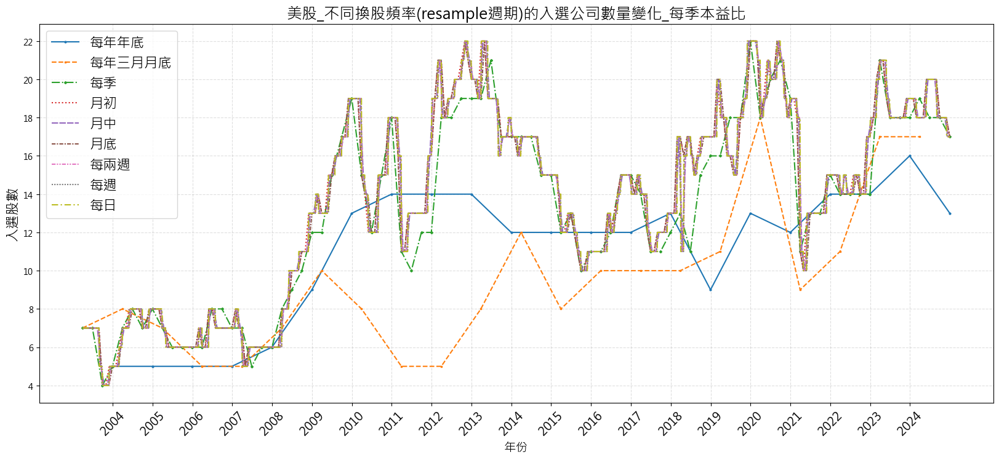

In [71]:
data_series = {
    '每年年底': all_cond_pe_A_rep.stock_data['company_count'].dropna(),
    '每年三月月底': all_cond_pe_AMAR_rep.stock_data['company_count'].dropna(),
    '每季': all_cond_pe_Q_rep.stock_data['company_count'].dropna(),
    '月初': all_cond_pe_MS_rep.stock_data['company_count'].dropna(),
    '月中': all_cond_pe_M15_rep.stock_data['company_count'].dropna(),
    '月底': all_cond_pe_M_rep.stock_data['company_count'].dropna(),
    '每兩週': all_cond_pe_2W_rep.stock_data['company_count'].dropna(),
    '每週': all_cond_pe_W_rep.stock_data['company_count'].dropna(),
    '每日': all_cond_pe_D_rep.stock_data['company_count']
}

# 定義不同的 linestyle
linestyles = ['-', '--', '-.', ':', (0, (5, 1)), (0, (3, 1, 1, 1)), (0, (3, 1, 1, 1, 1, 1)), (0, (1, 1)), (0, (5, 2, 1, 2))]
markers = ['o', 's', 'D', '', '', '', '', '', '']

plt.figure(figsize=(20, 8))

for (label, series), linestyle, marker in zip(data_series.items(), linestyles, markers):
    plt.plot(series.index, series.values, linestyle=linestyle, label=label, marker=marker, markersize=2)

# 圖表設定
plt.title('美股_不同換股頻率(resample週期)的入選公司數量變化_每季本益比', fontsize=18)
plt.xlabel('年份', fontsize=14)
plt.ylabel('入選股數', fontsize=16)
plt.legend(fontsize=16)
plt.grid(True, linestyle='--', alpha=0.4)

# 設置 X 軸為每年年份
plt.xticks(
    ticks=pd.date_range(start=series.index.min(), end=series.index.max(), freq="YS"),
    labels=pd.date_range(start=series.index.min(), end=series.index.max(), freq="YS").strftime("%Y"),
    rotation=45,
    fontsize=14
)

# 設置 Y 軸為正整數
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

# 顯示圖表
plt.show()

In [72]:
print(f"每年年底\n入選股數平均：{round(all_cond_pe_A_rep.stock_data['company_count'].mean(), 2)}中位數：{all_cond_pe_A_rep.stock_data['company_count'].median()}, min: {all_cond_pe_A_rep.stock_data['company_count'].min()}, max: {all_cond_pe_A_rep.stock_data['company_count'].max()}")

print(f"每年三月底\n入選股數平均：{round(all_cond_pe_AMAR_rep.stock_data['company_count'].mean(), 2)}中位數：{all_cond_pe_AMAR_rep.stock_data['company_count'].median()}, min: {all_cond_pe_AMAR_rep.stock_data['company_count'].min()}, max: {all_cond_pe_AMAR_rep.stock_data['company_count'].max()}")

print(f"每年三月底 + 15天\n入選股數平均：{round(all_cond_pe_AMAR15_rep.stock_data['company_count'].mean(), 2)}中位數：{all_cond_pe_AMAR15_rep.stock_data['company_count'].median()}, min: {all_cond_pe_AMAR15_rep.stock_data['company_count'].min()}, max: {all_cond_pe_AMAR15_rep.stock_data['company_count'].max()}")

print(f"每季\n入選股數平均：{round(all_cond_pe_Q_rep.stock_data['company_count'].mean(), 2)}中位數：{all_cond_pe_Q_rep.stock_data['company_count'].median()}, min: {all_cond_pe_Q_rep.stock_data['company_count'].min()}, max: {all_cond_pe_Q_rep.stock_data['company_count'].max()}")

print(f"每月月初\n入選股數平均：{round(all_cond_pe_MS_rep.stock_data['company_count'].mean(), 2)}中位數：{all_cond_pe_MS_rep.stock_data['company_count'].median()}, min: {all_cond_pe_MS_rep.stock_data['company_count'].min()}, max: {all_cond_pe_MS_rep.stock_data['company_count'].max()}")

print(f"每月月中\n入選股數平均：{round(all_cond_pe_M15_rep.stock_data['company_count'].mean(), 2)}中位數：{all_cond_pe_M15_rep.stock_data['company_count'].median()}, min: {all_cond_pe_M15_rep.stock_data['company_count'].min()}, max: {all_cond_pe_M15_rep.stock_data['company_count'].max()}")

print(f"每月月底\n入選股數平均：{round(all_cond_pe_M_rep.stock_data['company_count'].mean(), 2)}中位數：{all_cond_pe_M_rep.stock_data['company_count'].median()}, min: {all_cond_pe_M_rep.stock_data['company_count'].min()}, max: {all_cond_pe_M_rep.stock_data['company_count'].max()}")

print(f"每兩週\n入選股數平均：{round(all_cond_pe_2W_rep.stock_data['company_count'].mean(), 2)}中位數：{all_cond_pe_2W_rep.stock_data['company_count'].median()}, min: {all_cond_pe_2W_rep.stock_data['company_count'].min()}, max: {all_cond_pe_2W_rep.stock_data['company_count'].max()}")

print(f"每周\n入選股數平均：{round(all_cond_pe_W_rep.stock_data['company_count'].mean(), 2)}中位數：{all_cond_pe_W_rep.stock_data['company_count'].median()}, min: {all_cond_pe_W_rep.stock_data['company_count'].min()}, max: {all_cond_pe_W_rep.stock_data['company_count'].max()}")

print(f"每日\n入選股數平均：{round(all_cond_pe_D_rep.stock_data['company_count'].mean(), 2)}中位數：{all_cond_pe_D_rep.stock_data['company_count'].median()}, min: {all_cond_pe_D_rep.stock_data['company_count'].min()}, max: {all_cond_pe_D_rep.stock_data['company_count'].max()}")

每年年底
入選股數平均：11.0中位數：12.0, min: 5.0, max: 16.0
每年三月底
入選股數平均：9.45中位數：8.5, min: 5.0, max: 18.0
每年三月底 + 15天
入選股數平均：10.14中位數：9.5, min: 5.0, max: 18.0
每季
入選股數平均：13.17中位數：13.5, min: 4.0, max: 22.0
每月月初
入選股數平均：13.73中位數：15.0, min: 4.0, max: 22.0
每月月中
入選股數平均：13.69中位數：14.0, min: 4.0, max: 22.0
每月月底
入選股數平均：13.68中位數：14.0, min: 4.0, max: 22.0
每兩週
入選股數平均：13.69中位數：14.0, min: 4.0, max: 22.0
每周
入選股數平均：13.67中位數：14.0, min: 4.0, max: 22.0
每日
入選股數平均：13.67中位數：14.0, min: 4, max: 22


### reports

In [73]:
# orig_all_cond_pe_A_rep.display()
# orig_all_cond_pe_Q_rep.display()
# orig_all_cond_pe_MS_rep.display()
# orig_all_cond_pe_M15_rep.display()
# orig_all_cond_pe_M_rep.display()
# orig_all_cond_pe_2W_rep.display()
# orig_all_cond_pe_W_rep.display()
# orig_all_cond_pe_D_rep.display()

In [74]:
### 

### 每日本益比

In [75]:
# 每年底 resample
daily_pe_entry_A = (pe_daily < 12).resample('YE').last()[START_DATE:END_DATE]
daily_pe_exit_A = (pe_daily > 30).resample('YE').last()[START_DATE:END_DATE]

orig_daily_pe_A = (all_cond_A & daily_pe_entry_A).hold_until(~all_cond_A | daily_pe_exit_A)
orig_daily_pe_A_rep = backtest.sim(orig_daily_pe_A, resample='YE', data=data)

# 每年三月底 resample
daily_pe_entry_AMAR = (pe_daily < 12).resample('YE-MAR').last()[START_DATE:END_DATE]
daily_pe_exit_AMAR = (pe_daily > 30).resample('YE-MAR').last()[START_DATE:END_DATE]

orig_daily_pe_AMAR = (all_cond_AMAR & daily_pe_entry_AMAR).hold_until(~all_cond_AMAR | daily_pe_exit_AMAR)
orig_daily_pe_AMAR_rep = backtest.sim(orig_daily_pe_AMAR, resample='YE-MAR', data=data)

# # 每季 resample
daily_pe_entry_Q = (pe_daily < 12).resample('QE').last()[START_DATE:END_DATE]
daily_pe_exit_Q = (pe_daily > 30).resample('QE').last()[START_DATE:END_DATE]

orig_daily_pe_Q = (all_cond_Q & daily_pe_entry_Q).hold_until(~all_cond_Q | daily_pe_exit_Q)
orig_daily_pe_Q_rep = backtest.sim(orig_daily_pe_Q, resample='QE', data=data)

In [76]:
# 每月月初 resample
daily_pe_entry_MS = (pe_daily < 12).resample('MS').first()[START_DATE:END_DATE]
daily_pe_exit_MS = (pe_daily > 30).resample('MS').first()[START_DATE:END_DATE]

orig_daily_pe_MS = (all_cond_MS & daily_pe_entry_MS).hold_until(~all_cond_MS | daily_pe_exit_MS)
orig_daily_pe_MS_rep = backtest.sim(orig_daily_pe_MS, resample='MS', data=data)

# 每月月中 resample
orig_daily_pe_M15_rep = backtest.sim(orig_daily_pe_MS, resample='MS', resample_offset='15D', data=data)

# 每月月底 resample
orig_daily_pe_M_rep = backtest.sim(orig_all_cond_and_pe_daily, resample='ME', data=data)

# 每兩週 resample
daily_pe_entry_2W = (pe_daily < 12).resample('2W').last()[START_DATE:END_DATE]
daily_pe_exit_2W = (pe_daily > 30).resample('2W').last()[START_DATE:END_DATE]

orig_daily_pe_2W = (orig_all_cond & daily_pe_entry_2W).hold_until(~orig_all_cond | daily_pe_exit_2W)
orig_daily_pe_2W_rep = backtest.sim(orig_daily_pe_2W, resample='2W', data=data)

# 每周 resample
daily_pe_entry_W = (pe_daily < 12).resample('W').last()[START_DATE:END_DATE]
daily_pe_exit_W = (pe_daily> 30).resample('W').last()[START_DATE:END_DATE]

orig_daily_pe_W = (orig_all_cond & daily_pe_entry_W).hold_until(~orig_all_cond | daily_pe_exit_W)
orig_daily_pe_W_rep = backtest.sim(orig_daily_pe_W, resample='W', data=data)

In [77]:
# 每日 resample

orig_daily_pe_D = (orig_all_cond & (pe_daily < 12)).hold_until(~orig_all_cond | (pe_daily> 30))
orig_daily_pe_D_rep = backtest.sim(orig_daily_pe_D, resample='D', data=data)

In [78]:
# orig_daily_pe_W_rep.plot_company_counts()

In [79]:
print(f"每年\n{orig_daily_pe_A_rep.get_stats()}")
print(f"每年三月底\n{orig_daily_pe_AMAR_rep.get_stats()}")
print(f"每季\n{orig_daily_pe_Q_rep.get_stats()}")
print(f"每月月初\n{orig_daily_pe_MS_rep.get_stats()}")
print(f"每月月中\n{orig_daily_pe_M15_rep.get_stats()}")
print(f"每月月底\n{orig_daily_pe_M_rep.get_stats()}")
print(f"每兩週\n{orig_daily_pe_2W_rep.get_stats()}")
print(f"每周\n{orig_daily_pe_W_rep.get_stats()}")
print(f"每日\n{orig_daily_pe_D_rep.get_stats()}")

每年
{'CAGR': 0.09255724356383288, 'daily_sharpe': 26.34, 'max_drawdown': -0.5080601638249558, 'avg_drawdown': -0.05368152117553196, 'win_ratio': 0.696969696969697, 'ytd': 0.12324665472005658}
每年三月底
{'CAGR': 0.11334443639919578, 'daily_sharpe': 23.54, 'max_drawdown': -0.5503740067894125, 'avg_drawdown': -0.06819798929306992, 'win_ratio': 0.6697247706422018, 'ytd': 0.19445862730121566}
每季
{'CAGR': 0.1067956860685293, 'daily_sharpe': 24.78, 'max_drawdown': -0.5187415221071764, 'avg_drawdown': -0.05962850569846297, 'win_ratio': 0.6751592356687898, 'ytd': 0.06972819304248001}
每月月初
{'CAGR': 0.1077007018556142, 'daily_sharpe': 23.46, 'max_drawdown': -0.5281110837420913, 'avg_drawdown': -0.05624677863192867, 'win_ratio': 0.7125748502994012, 'ytd': 0.0757848742414422}
每月月中
{'CAGR': 0.10420617440406899, 'daily_sharpe': 24.58, 'max_drawdown': -0.5272908665282263, 'avg_drawdown': -0.05700891235845505, 'win_ratio': 0.686046511627907, 'ytd': 0.07329515975606271}
每月月底
{'CAGR': 0.10783361381834489, 'da

In [80]:
print(f"每年年底\n入選股數平均:{round(orig_daily_pe_A_rep.stock_data['company_count'].dropna().mean(), 2)}, 中位數:{orig_daily_pe_A_rep.stock_data['company_count'].dropna().median()}")
print(f"每年三月月底\n入選股數平均:{round(orig_daily_pe_AMAR_rep.stock_data['company_count'].dropna().mean(), 2)}, 中位數:{orig_daily_pe_AMAR_rep.stock_data['company_count'].dropna().median()}")
print(f"每季\n入選股數平均:{round(orig_daily_pe_Q_rep.stock_data['company_count'].dropna().mean(), 2)}, 中位數:{orig_daily_pe_Q_rep.stock_data['company_count'].dropna().median()}")
print(f"每月月初\n入選股數平均:{round(orig_daily_pe_MS_rep.stock_data['company_count'].dropna().mean(), 2)}, 中位數:{orig_daily_pe_MS_rep.stock_data['company_count'].dropna().median()}")
print(f"每月月中\n入選股數平均:{round(orig_daily_pe_M15_rep.stock_data['company_count'].dropna().mean(), 2)}, 中位數:{orig_daily_pe_M15_rep.stock_data['company_count'].dropna().median()}")
print(f"每月月底\n入選股數平均:{round(orig_daily_pe_M_rep.stock_data['company_count'].dropna().mean(), 2)}, 中位數:{orig_daily_pe_M_rep.stock_data['company_count'].dropna().median()}")
print(f"每兩週\n入選股數平均:{round(orig_daily_pe_2W_rep.stock_data['company_count'].dropna().mean(), 2)}, 中位數:{orig_daily_pe_2W_rep.stock_data['company_count'].dropna().median()}")
print(f"每周\n入選股數平均:{round(orig_daily_pe_W_rep.stock_data['company_count'].dropna().mean(), 2)}, 中位數:{orig_daily_pe_W_rep.stock_data['company_count'].dropna().median()}")
print(f"每日\n入選股數平均:{round(orig_daily_pe_D_rep.stock_data['company_count'].mean(), 2)}, 中位數:{orig_daily_pe_D_rep.stock_data['company_count'].median()}")

每年年底
入選股數平均:18.05, 中位數:16.5
每年三月月底
入選股數平均:19.05, 中位數:19.0
每季
入選股數平均:21.5, 中位數:24.0
每月月初
入選股數平均:22.36, 中位數:24.0
每月月中
入選股數平均:22.44, 中位數:24.0
每月月底
入選股數平均:22.28, 中位數:24.0
每兩週
入選股數平均:22.68, 中位數:24.0
每周
入選股數平均:22.8, 中位數:24.0
每日
入選股數平均:23.04, 中位數:24.0


In [81]:
orig_pe_M_stocklist = all_cond_pe_M_rep.trades.reset_index()['stock_id'].to_list()
orig_daily_pe_M_stocklist = orig_daily_pe_M_rep.trades.reset_index()['stock_id'].to_list()
orig_daily_pe_D_stocklist = orig_daily_pe_D_rep.trades.reset_index()['stock_id'].to_list()
orig_pe_D_stocklist = all_cond_pe_D_rep.trades.reset_index()['stock_id'].to_list()
orig_daily_pe_A_stocklist = orig_daily_pe_A_rep.trades.reset_index()['stock_id'].to_list()

# unique_stocks = set(orig_pe_M_stocklist).symmetric_difference(set(orig_daily_pe_M_stocklist))
# unique_stocks_list = list(unique_stocks)
# print(len(unique_stocks_list))

In [82]:
only_in_daily_pe_M = set(orig_daily_pe_M_stocklist) - set(orig_pe_M_stocklist)
print("Stocks only in 每日本益比每月resample:", len(only_in_daily_pe_M))

only_in_pe_M = set(orig_pe_M_stocklist) - set(orig_daily_pe_M_stocklist)
print("Stocks only in 每季本益比每月resample:", len(only_in_pe_M))

only_in_daily_pe_D = set(orig_daily_pe_D_stocklist) - set(orig_pe_D_stocklist)
print("\n\nStocks only in 每日本益比每日resample:", len(only_in_daily_pe_D))

only_in_pe_D = set(orig_pe_D_stocklist) - set(orig_daily_pe_D_stocklist)
print("Stocks only in 每季本益比每日resample:", len(only_in_pe_D))

Stocks only in 每日本益比每月resample: 25
Stocks only in 每季本益比每月resample: 13


Stocks only in 每日本益比每日resample: 26
Stocks only in 每季本益比每日resample: 11


In [83]:
only_in_daily_pe_M = set(orig_daily_pe_M_stocklist) - set(orig_daily_pe_D_stocklist)
print("Stocks only in 每日本益比每月resample:", len(only_in_daily_pe_M))

only_in_daily_pe_D = set(orig_daily_pe_D_stocklist) - set(orig_daily_pe_M_stocklist)
print("Stocks only in 每日本益比每日resample:", len(only_in_daily_pe_D))

Stocks only in 每日本益比每月resample: 0
Stocks only in 每日本益比每日resample: 4


In [84]:
only_in_daily_pe_M = set(orig_daily_pe_M_stocklist) - set(orig_daily_pe_A_stocklist)
print("Stocks only in 每日本益比每月resample:", len(only_in_daily_pe_M))

only_in_daily_pe_A = set(orig_daily_pe_A_stocklist) - set(orig_daily_pe_M_stocklist)
print("Stocks only in 每日本益比每年resample:", len(only_in_daily_pe_A))

Stocks only in 每日本益比每月resample: 48
Stocks only in 每日本益比每年resample: 0


In [85]:
same_stocks = set(orig_pe_M_stocklist).intersection(set(orig_daily_pe_M_stocklist))
same_stocks_list = list(same_stocks)
print(len(same_stocks_list))

124


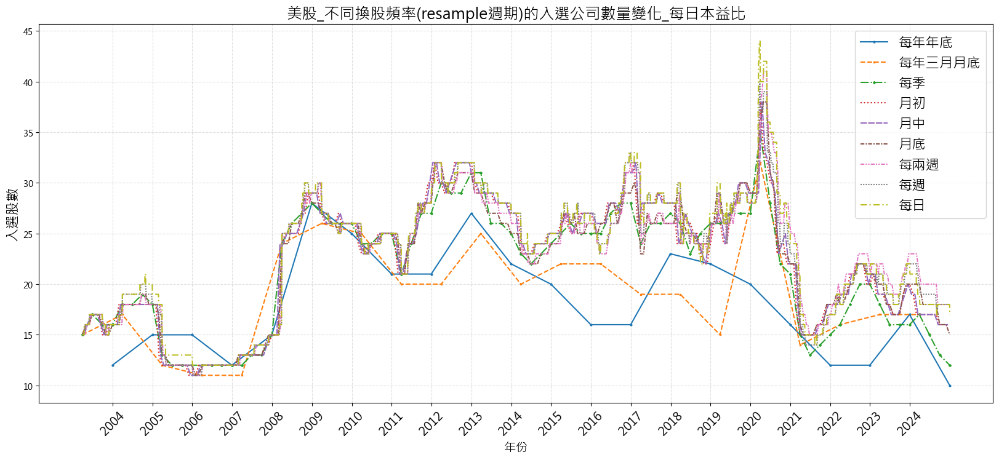

In [86]:
data_series_daily = {
    '每年年底': orig_daily_pe_A_rep.stock_data['company_count'].dropna(),
    # '每年三月月底_Q': orig_all_cond_pe_AMAR_rep.stock_data['company_count'].dropna(),
    '每年三月月底': orig_daily_pe_AMAR_rep.stock_data['company_count'].dropna(),
    '每季': orig_daily_pe_Q_rep.stock_data['company_count'].dropna(),
    '月初': orig_daily_pe_MS_rep.stock_data['company_count'].dropna(),
    '月中': orig_daily_pe_M15_rep.stock_data['company_count'].dropna(),
    # '月底_Q': orig_all_cond_pe_M_rep.stock_data['company_count'].dropna(),
    '月底': orig_daily_pe_M_rep.stock_data['company_count'].dropna(),
    '每兩週': orig_daily_pe_2W_rep.stock_data['company_count'].dropna(),
    '每週': orig_daily_pe_W_rep.stock_data['company_count'].dropna(),
    '每日': orig_daily_pe_D_rep.stock_data['company_count']
}

linestyles = ['-', '--', '-.', ':', (0, (5, 1)), (0, (3, 1, 1, 1)), (0, (3, 1, 1, 1, 1, 1)), (0, (1, 1)), (0, (5, 2, 1, 2))]
markers = ['o', 's', 'D', '', '', '', '', '', '']

plt.figure(figsize=(20, 8))

for (label, series), linestyle, marker in zip(data_series_daily.items(), linestyles, markers):
    plt.plot(series.index, series.values, linestyle=linestyle, label=label, marker=marker, markersize=2)

# 圖表設定
plt.title('美股_不同換股頻率(resample週期)的入選公司數量變化_每日本益比', fontsize=18)
plt.xlabel('年份', fontsize=14)
plt.ylabel('入選股數', fontsize=16)
plt.legend(fontsize=16)
plt.grid(True, linestyle='--', alpha=0.4)

# 設置 X 軸為每年年份
plt.xticks(
    ticks=pd.date_range(start=series.index.min(), end=series.index.max(), freq="YS"),
    labels=pd.date_range(start=series.index.min(), end=series.index.max(), freq="YS").strftime("%Y"),
    rotation=45,
    fontsize=14
)

# 顯示圖表
plt.show()

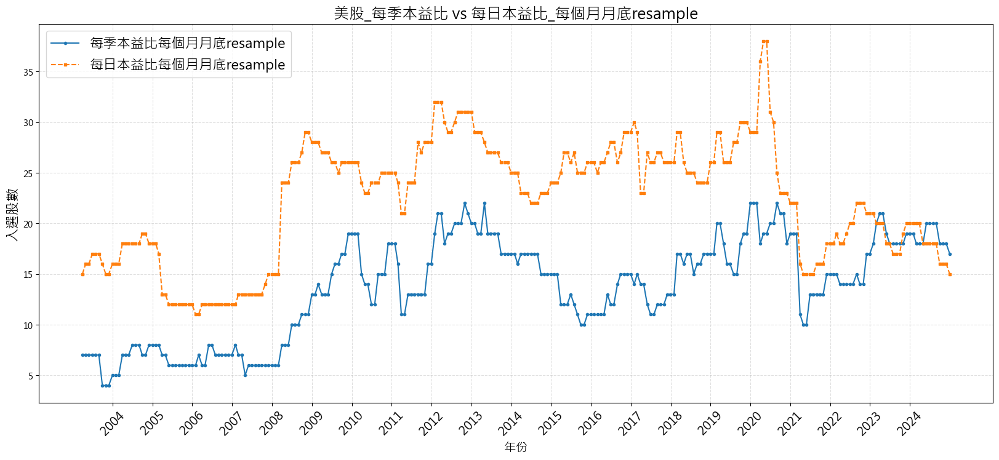

In [87]:
data_series_compare = {
    "每季本益比每個月月底resample":all_cond_pe_M_rep.stock_data['company_count'].dropna(), # 每季本益比
    "每日本益比每個月月底resample":orig_daily_pe_M_rep.stock_data['company_count'].dropna(), # 每日本益比
}

plt.figure(figsize=(20, 8))

for (label, series), linestyle, marker in zip(data_series_compare.items(), linestyles, markers):
    plt.plot(series.index, series.values, linestyle=linestyle, label=label, marker=marker, markersize=3)

# 圖表設定
plt.title('美股_每季本益比 vs 每日本益比_每個月月底resample', fontsize=18)
plt.xlabel('年份', fontsize=14)
plt.ylabel('入選股數', fontsize=16)
plt.legend(fontsize=16)
plt.grid(True, linestyle='--', alpha=0.4)

# 設置 X 軸為每年年份
plt.xticks(
    ticks=pd.date_range(start=series.index.min(), end=series.index.max(), freq="YS"),
    labels=pd.date_range(start=series.index.min(), end=series.index.max(), freq="YS").strftime("%Y"),
    rotation=45,
    fontsize=14
)

# 顯示圖表
plt.show()

In [88]:
# 將兩個序列轉換為 DataFrame
df_compare = pd.DataFrame({
    'quarterly_pe': all_cond_pe_M_rep.stock_data['company_count'].dropna(),
    'daily_pe': orig_daily_pe_M_rep.stock_data['company_count'].dropna()
})

# 計算差值 (每日本益比 - 每季本益比)
df_compare['difference'] = df_compare['daily_pe'] - df_compare['quarterly_pe']

# 計算統計值
stats = {
    '最大差距': df_compare['difference'].max(),
    '最小差距': df_compare['difference'].min(),
    '平均差距': df_compare['difference'].mean(),
    '標準差': df_compare['difference'].std()
}

# 印出統計結果
for metric, value in stats.items():
    print(f"{metric}: {value:.2f}")

# 找出最大差距和最小差距發生的日期
max_diff_date = df_compare['difference'].idxmax()
min_diff_date = df_compare['difference'].idxmin()

print(f"\n最大差距發生日期: {max_diff_date.strftime('%Y-%m-%d')}")
print(f"最小差距發生日期: {min_diff_date.strftime('%Y-%m-%d')}")

最大差距: 19.00
最小差距: -2.00
平均差距: 8.60
標準差: 4.69

最大差距發生日期: 2020-04-30
最小差距發生日期: 2024-05-31


### reports

In [89]:
# orig_daily_pe_A_rep.display()
# orig_daily_pe_Q_rep.display()
# orig_daily_pe_MS_rep.display()
# orig_daily_pe_M15_rep.display()
# orig_daily_pe_M_rep.display()
# orig_daily_pe_2W_rep.display()
# orig_daily_pe_W_rep.display()
# orig_daily_pe_D_rep.display()

---

---

## 比較是否考慮某項條件其對績效的影響

In [90]:
dataframes = {
    'roe_15': roe_cond,
    'rr_cond': rr_cond,
    'payout_ratio_cond': payout_cond,
    'profit_cond': netprofit_cond,
    'listed': listed_cond,
}

# 定義 DataFrame 對應的中文名稱
dataframe_names = {
    'roe_15': 'ROE五年平均',
    'rr_cond': '盈再率',
    'payout_ratio_cond': '配息率',
    'profit_cond': '稅後淨利',
    'hold_cond': '董監持股',
    'listed': '上市櫃滿兩年'
}


# 用於儲存組合結果
compare_conds_strat = {}

# 產生不同長度的組合
counter = 1
for r in range(1, len(dataframes) + 1):
    for combination in itertools.combinations(dataframes.keys(), r):
        # 計算DataFrame間的 AND 運算
        combined_signal = dataframes[combination[0]]
        for df_name in combination[1:]:
            combined_signal &= dataframes[df_name]

        # 限制日期區間
        combined_signal = CustomDataFrame(combined_signal)
        combined_signal = combined_signal[START_DATE:END_DATE]

        # 使用組合的中文名稱生成key_name
        key_name = "+".join([dataframe_names[df] for df in combination])

        # 將計算結果儲存到字典
        compare_conds_strat[key_name] = combined_signal
        counter += 1




compare_strat_collecs = sim_conditions(compare_conds_strat, resample='ME', data=data)

Backtesting progress: 100%|██████████| 31/31 [04:52<00:00,  9.44s/condition]


In [91]:
compare_strat_collecs_df = compare_strat_collecs.selected_stock_count_analysis()
# compare_strat_collecs_df.to_csv('./performance_file/US/美股_比較是否考慮某項條件其對績效的影響_無本益比進出場.csv', encoding="cp950")

包含本益比進出場

In [92]:
# 用於儲存組合結果
compare_conds_strat_PE={}

# 產生不同長度的組合，從1到6
counter = 1
for r in range(1, len(dataframes) + 1):
    for combination in itertools.combinations(dataframes.keys(), r):
        # 計算DataFrame間的 AND 運算
        combined_signal = dataframes[combination[0]]
        for df_name in combination[1:]:
            combined_signal &= dataframes[df_name]

        # 限制日期區間
        combined_signal = CustomDataFrame(combined_signal)
        combined_signal = (combined_signal[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE]).hold_until((~combined_signal[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE])

        # 使用組合的中文名稱生成key_name
        key_name = "+".join([dataframe_names[df] for df in combination])

        # 將計算結果儲存到字典
        compare_conds_strat_PE[key_name] = combined_signal
        counter += 1


compare_strat_collecs_PE = sim_conditions(compare_conds_strat_PE, resample='ME', data=data)

Backtesting progress: 100%|██████████| 31/31 [03:00<00:00,  5.81s/condition]


In [93]:
compare_strat_collecs_PE_df = compare_strat_collecs_PE.selected_stock_count_analysis()
# compare_strat_collecs_PE_df.to_csv('./performance_file/US/美股_比較是否考慮某項條件其對績效的影響_本益比進出場.csv', encoding="cp950")

---

In [94]:
# 條件的字典
condition_dict = {
    'ROE五年平均': roe_cond,
    '盈再率': rr_cond,
    '三年配息率': payout_cond,
    '稅後淨利': netprofit_cond,
    '上市櫃滿兩年': listed_cond,
}

# 分離 "董監持股+上市櫃滿兩年" 與其他條件
additional_condition_key = '上市櫃滿兩年'
additional_condition = condition_dict.pop(additional_condition_key)

# 剩餘條件的 key
keys = list(condition_dict.keys())

# 創建交易訊號字典
signal_dict = {}

# 遍歷 2, 3, 4 的組合長度
for r in range(2, 5):
    combinations = itertools.combinations(keys, r)
    for combo in combinations:
        # 組合名稱
        combo_name = '+'.join(combo)

        # 條件的 AND 結果
        combined_condition = condition_dict[combo[0]]
        for key in combo[1:]:
            combined_condition &= condition_dict[key]

        # 加入不含 "董監持股+上市櫃滿兩年" 的組合
        signal_dict[combo_name] = combined_condition[START_DATE:END_DATE]

        # 加入含 "董監持股+上市櫃滿兩年" 的組合
        combo_name_with_additional = f"{combo_name}_{additional_condition_key}"
        signal_dict[combo_name_with_additional] = (combined_condition & additional_condition)[START_DATE:END_DATE]

# 添加本益比進出場的組合
pe_signal_dict = {}
for name, sig in signal_dict.items():
    # 原組合的本益比進出場
    pe_signal_dict[f"{name}_本益比進出場"] = (sig[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE]).hold_until((~sig[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE])

    # 含 "董監持股+上市櫃滿兩年" 的組合的本益比進出場
    if additional_condition_key in name:
        pe_signal_dict[f"{name}_本益比進出場"] = (sig[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE]).hold_until((~sig[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE])

# 合併所有組合
signal_dict.update(pe_signal_dict)

# 確認結果
for name, condition in signal_dict.items():
    print(name)

ROE五年平均+盈再率
ROE五年平均+盈再率_上市櫃滿兩年
ROE五年平均+三年配息率
ROE五年平均+三年配息率_上市櫃滿兩年
ROE五年平均+稅後淨利
ROE五年平均+稅後淨利_上市櫃滿兩年
盈再率+三年配息率
盈再率+三年配息率_上市櫃滿兩年
盈再率+稅後淨利
盈再率+稅後淨利_上市櫃滿兩年
三年配息率+稅後淨利
三年配息率+稅後淨利_上市櫃滿兩年
ROE五年平均+盈再率+三年配息率
ROE五年平均+盈再率+三年配息率_上市櫃滿兩年
ROE五年平均+盈再率+稅後淨利
ROE五年平均+盈再率+稅後淨利_上市櫃滿兩年
ROE五年平均+三年配息率+稅後淨利
ROE五年平均+三年配息率+稅後淨利_上市櫃滿兩年
盈再率+三年配息率+稅後淨利
盈再率+三年配息率+稅後淨利_上市櫃滿兩年
ROE五年平均+盈再率+三年配息率+稅後淨利
ROE五年平均+盈再率+三年配息率+稅後淨利_上市櫃滿兩年
ROE五年平均+盈再率_本益比進出場
ROE五年平均+盈再率_上市櫃滿兩年_本益比進出場
ROE五年平均+三年配息率_本益比進出場
ROE五年平均+三年配息率_上市櫃滿兩年_本益比進出場
ROE五年平均+稅後淨利_本益比進出場
ROE五年平均+稅後淨利_上市櫃滿兩年_本益比進出場
盈再率+三年配息率_本益比進出場
盈再率+三年配息率_上市櫃滿兩年_本益比進出場
盈再率+稅後淨利_本益比進出場
盈再率+稅後淨利_上市櫃滿兩年_本益比進出場
三年配息率+稅後淨利_本益比進出場
三年配息率+稅後淨利_上市櫃滿兩年_本益比進出場
ROE五年平均+盈再率+三年配息率_本益比進出場
ROE五年平均+盈再率+三年配息率_上市櫃滿兩年_本益比進出場
ROE五年平均+盈再率+稅後淨利_本益比進出場
ROE五年平均+盈再率+稅後淨利_上市櫃滿兩年_本益比進出場
ROE五年平均+三年配息率+稅後淨利_本益比進出場
ROE五年平均+三年配息率+稅後淨利_上市櫃滿兩年_本益比進出場
盈再率+三年配息率+稅後淨利_本益比進出場
盈再率+三年配息率+稅後淨利_上市櫃滿兩年_本益比進出場
ROE五年平均+盈再率+三年配息率+稅後淨利_本益比進出場
ROE五年平均+盈再率+三年配息率+稅後淨利_上市櫃滿兩年_本益比進出場


In [95]:
signal_dict_comb = sim_conditions(signal_dict, resample='ME', data=data)
signal_dict_comb.selected_stock_count_analysis()
signal_dict_comb.selected_stock_count_analysis().to_csv('./performance_file/US/美股_ch4.csv', encoding="cp950")

Backtesting progress: 100%|██████████| 44/44 [03:34<00:00,  4.87s/condition]


In [96]:
df = signal_dict_comb.selected_stock_count_analysis()
df.reset_index(inplace=True)

In [97]:
df

,Strategy,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
0,ROE五年平均+盈再率,14.58,-51.87,295.56,293.0,259.00,353.75,179.0,447.0
1,ROE五年平均+盈再率_上市櫃滿兩年,14.36,-52.02,290.42,289.0,256.25,348.00,174.0,445.0
2,ROE五年平均+稅後淨利_本益比進出場,14.28,-55.48,208.74,212.0,196.00,227.00,115.0,292.0
3,ROE五年平均+盈再率_本益比進出場,13.64,-53.30,163.09,173.5,129.00,182.75,97.0,265.0
4,ROE五年平均+盈再率_上市櫃滿兩年_本益比進出場,13.57,-53.89,160.55,172.0,126.00,181.00,95.0,258.0
5,ROE五年平均+稅後淨利,13.47,-53.93,338.90,312.0,275.25,409.00,179.0,528.0
6,ROE五年平均+盈再率+稅後淨利,12.88,-52.45,238.37,221.0,196.00,304.00,111.0,388.0
7,ROE五年平均+盈再率+稅後淨利_上市櫃滿兩年,12.67,-52.79,234.71,218.0,194.00,298.75,109.0,386.0
8,ROE五年平均+稅後淨利_上市櫃滿兩年,12.65,-53.84,331.45,299.5,270.00,401.00,176.0,523.0
9,ROE五年平均+稅後淨利_上市櫃滿兩年_本益比進出場,12.64,-55.59,204.40,209.0,190.00,222.00,114.0,285.0


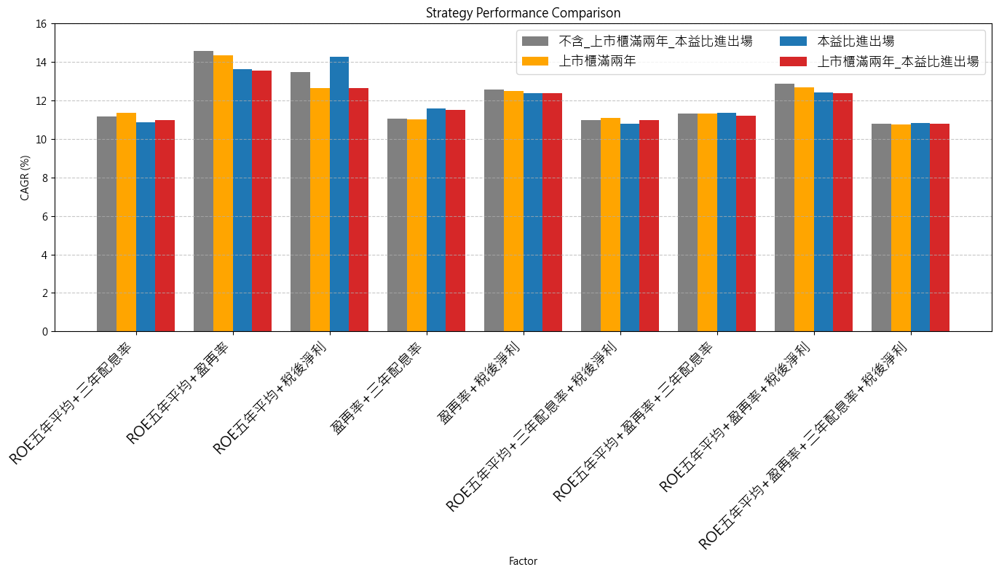

In [98]:
def create_grouped_bar_chart(df):
    # 從 Strategy 中提取因子組合
    def extract_factor(strategy):
        # 用正則表達式匹配因子部分
        match = re.match(r'^([^_]+(?:\+[^_]+)*).*', strategy)
        if match:
            return match.group(1)
        return strategy
    
    # 為每個 Strategy 添加一個新列 'Factor'，表示其因子組合
    df['Factor'] = df['Strategy'].apply(extract_factor)
    
    # 定義標示類型
    def get_label_type(strategy):
        if '_上市櫃滿兩年_本益比進出場' in strategy:
            return '上市櫃滿兩年_本益比進出場'
        elif '_上市櫃滿兩年' in strategy:
            return '上市櫃滿兩年'
        elif '_本益比進出場' in strategy:
            return '本益比進出場'
        else:
            return '不含_上市櫃滿兩年_本益比進出場'
    
    df['Label'] = df['Strategy'].apply(get_label_type)
    
    # 根據圖片中的順序定義因子順序
    factor_order = [
        'ROE五年平均+三年配息率',
        'ROE五年平均+盈再率',
        'ROE五年平均+稅後淨利',
        '盈再率+三年配息率',
        '盈再率+稅後淨利',
        'ROE五年平均+三年配息率+稅後淨利',
        'ROE五年平均+盈再率+三年配息率',
        'ROE五年平均+盈再率+稅後淨利',
        'ROE五年平均+盈再率+三年配息率+稅後淨利'
    ]
    
    # 過濾掉 DataFrame 中沒有的因子
    factor_order = [f for f in factor_order if f in df['Factor'].unique()]
    
    # 獲取唯一的標籤類型
    label_types = ['不含_上市櫃滿兩年_本益比進出場', '上市櫃滿兩年', '本益比進出場', '上市櫃滿兩年_本益比進出場']
    colors = ['gray', 'orange', 'tab:blue', 'tab:red']
    
    # 設置圖表大小
    plt.figure(figsize=(14, 8))
    
    # 設置每個組的寬度和組內 bar 的寬度
    n_groups = len(factor_order)
    n_bars = len(label_types)
    group_width = 0.8
    bar_width = group_width / n_bars
    
    # 計算每個 bar 的位置
    indices = np.arange(n_groups)
    
    # 繪製 grouped bar chart
    for i, (label_type, color) in enumerate(zip(label_types, colors)):
        data = []
        for factor in factor_order:
            rows = df[(df['Factor'] == factor) & (df['Label'] == label_type)]
            if not rows.empty:
                data.append(rows['CAGR (%)'].values[0])
            else:
                data.append(0)
        
        positions = indices - group_width/2 + (i + 0.5) * bar_width
        plt.bar(positions, data, bar_width, label=label_type, color=color)
    
    # 設置 x 軸標籤、圖表標題等
    plt.xlabel('Factor')
    plt.ylabel('CAGR (%)')
    plt.title('Strategy Performance Comparison')
    plt.xticks(indices, factor_order, rotation=45, ha='right', fontsize=14)
    # legend 改為橫向
    plt.legend(loc='upper right',  ncol=2, fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.ylim(0, 16)  # 設置 y 軸範圍與圖片一致
    
    # 調整佈局
    plt.tight_layout()
    
    # 顯示圖表
    plt.show()


# 調用函數繪製圖表
create_grouped_bar_chart(df)

In [99]:
pd.options.display.float_format = '{:.2f}'.format


def analyze_signal_groups(signal_dict_comb):
    # 初始化結果字典
    results = {
        '包含ROE五年平均': [],
        '包含盈再率': [],
        '包含配息率': [],
        '包含稅後淨利': [],
        # '包含董監持股+上市櫃滿兩年': []
    }

    # 遍歷策略並分類
    for strategy in signal_dict_comb.index:
        if 'ROE五年平均' in strategy:
            results['包含ROE五年平均'].append(strategy)
        if '盈再率' in strategy:
            results['包含盈再率'].append(strategy)
        if '三年配息率' in strategy:
            results['包含配息率'].append(strategy)
        if '稅後淨利' in strategy:
            results['包含稅後淨利'].append(strategy)
        # if '董監持股+上市櫃滿兩年' in strategy:
        #     results['包含董監持股+上市櫃滿兩年'].append(strategy)

    # 計算每組的平均值，細分為包含/不包含條件、有/無本益比進出場、綜合
    summary_data = []
    for group, strategies in results.items():
        condition_name = group.split('包含')[1]

        # 包含條件與不包含條件
        for include_condition in [True, False]:
            filtered_strategies_condition = [s for s in signal_dict_comb.index if (condition_name in s) == include_condition]

            # 細分有/無本益比進出場
            for include_pe in [True, False]:
                filtered_strategies = [s for s in filtered_strategies_condition if ('本益比進出場' in s) == include_pe]
                if filtered_strategies:
                    filtered_df = signal_dict_comb.loc[filtered_strategies]
                    avg_cagr = filtered_df['CAGR (%)'].mean()
                    avg_mdd = filtered_df['MDD (%)'].mean()
                    avg_selected_stock = filtered_df['入選股數平均'].mean()
                    condition_label = f"{'包含' if include_condition else '不包含'}{condition_name} ({'含本益比進出場' if include_pe else '不含本益比進出場'})"
                    summary_data.append([condition_label, avg_cagr, avg_mdd, avg_selected_stock])

            # 綜合分析
            combined_df = signal_dict_comb.loc[filtered_strategies_condition]
            if not combined_df.empty:
                avg_cagr_combined = combined_df['CAGR (%)'].mean()
                avg_mdd_combined = combined_df['MDD (%)'].mean()
                avg_selected_stock_combined = combined_df['入選股數平均'].mean()
                condition_label = f"{'包含' if include_condition else '不包含'}{condition_name} (綜合)"
                summary_data.append([condition_label, avg_cagr_combined, avg_mdd_combined, avg_selected_stock_combined])

    # 返回新的 DataFrame
    summary_df = pd.DataFrame(summary_data, columns=['Group', 'Average CAGR (%)', 'Average MDD (%)', 'Average Selected Stock Count'])
    return summary_df

# signal_dict_comb = sim_conditions(signal_dict, resample='ME', data=data)
summary_df = analyze_signal_groups(signal_dict_comb.selected_stock_count_analysis())
summary_df

,Group,Average CAGR (%),Average MDD (%),Average Selected Stock Count
0,包含ROE五年平均 (含本益比進出場),11.91,-53.02,89.06
1,包含ROE五年平均 (不含本益比進出場),12.10,-51.80,154.56
2,包含ROE五年平均 (綜合),12.00,-52.41,121.81
3,不包含ROE五年平均 (含本益比進出場),11.21,-53.91,119.95
4,不包含ROE五年平均 (不含本益比進出場),10.89,-53.77,211.65
5,不包含ROE五年平均 (綜合),11.04,-53.84,165.80
6,包含盈再率 (含本益比進出場),11.80,-52.75,103.94
7,包含盈再率 (不含本益比進出場),11.85,-51.91,186.20
8,包含盈再率 (綜合),11.83,-52.33,145.07
9,不包含盈再率 (含本益比進出場),11.38,-54.40,93.92


### 繪圖

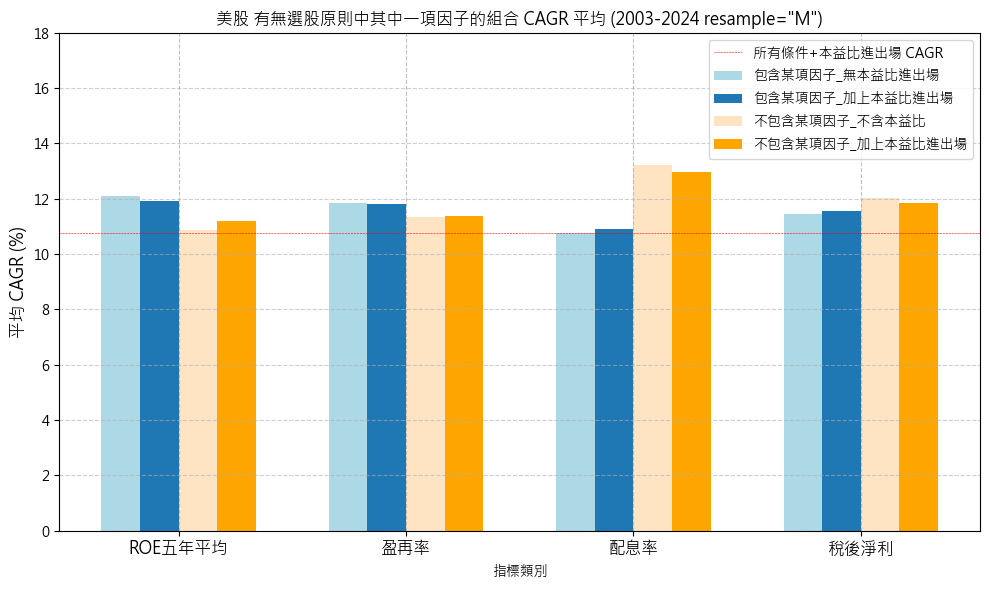

In [100]:
# 創建DataFrame
df = summary_df.copy()

# # 處理數據：提取所需的行（包含/不包含且是含本益比進出場的組合）
# mask = df['Group'].str.contains('含本益比進出場')
# filtered_df = df[mask].copy()

# # 定義類別順序
# categories = ['ROE五年平均', '盈再率', '配息率', '稅後淨利']

# # 創建類別對應的數據
# included_values = []
# excluded_values = []

# for category in categories:
#     # 獲取包含該類別的資料
#     included_mask = filtered_df['Group'].str.contains(f'包含{category}')
#     excluded_mask = filtered_df['Group'].str.contains(f'不包含{category}')
    
#     included_value = filtered_df[included_mask]['Average CAGR (%)'].values[0]
#     excluded_value = filtered_df[excluded_mask]['Average CAGR (%)'].values[0]
    
#     included_values.append(included_value)
#     excluded_values.append(excluded_value)

# # 設置圖表風格和大小
# # plt.style.use('seaborn')
# plt.figure(figsize=(14, 6))

# # 設置bar的寬度
# width = 0.17

# # 設置x軸位置
# x = np.arange(len(categories))

# # 繪製條形圖
# bars1 = plt.bar(x - width/2, included_values, width, label='包含', color='tab:blue')
# bars2 = plt.bar(x + width/2, excluded_values, width, label='不包含', color='orange')

# # 設置圖表標題和標籤
# plt.title('台股 有無選股原則中其中一項因子的組合 CAGR 平均 (含本益比進出場)', fontsize=12)
# plt.xlabel('指標類別')
# plt.ylabel('Average CAGR (%)')

# # 設置x軸刻度和標籤
# plt.xticks(x, categories)

# # 設置y軸範圍
# plt.ylim(0, 16)

# # 添加網格線
# plt.grid(True, linestyle='--', alpha=0.8)

# benchmark_value = signal_dict_comb.selected_stock_count_analysis().loc['ROE五年平均+盈再率+三年配息率+稅後淨利_董監持股+上市櫃滿兩年_本益比進出場']['CAGR (%)']
# plt.axhline(y=benchmark_value, color='red', linestyle='--', label='所有條件+本益比進出場 CAGR', linewidth=0.3)

# # 添加圖例
# plt.legend(loc='upper center', bbox_to_anchor=(1.15, 1), fontsize=10)

# # 調整布局
# plt.tight_layout()

# # 顯示圖表
# plt.show()

# 定義類別順序
categories = ['ROE五年平均', '盈再率', '配息率', '稅後淨利']

# 創建類別對應的數據
included_no_pe_values = []  # 包含但不含本益比
included_with_pe_values = []  # 包含且含本益比
excluded_no_pe_values = []  # 不包含且不含本益比
excluded_with_pe_values = []  # 不包含且含本益比

for category in categories:
    # 包含且不含本益比
    mask_included_no_pe = df['Group'].str.contains(f'包含{category} \(不含本益比進出場\)')
    included_no_pe_values.append(df[mask_included_no_pe]['Average CAGR (%)'].values[0])
    
    # 包含且含本益比
    mask_included_with_pe = df['Group'].str.contains(f'包含{category} \(含本益比進出場\)')
    included_with_pe_values.append(df[mask_included_with_pe]['Average CAGR (%)'].values[0])
    
    # 不包含且不含本益比
    mask_excluded_no_pe = df['Group'].str.contains(f'不包含{category} \(不含本益比進出場\)')
    excluded_no_pe_values.append(df[mask_excluded_no_pe]['Average CAGR (%)'].values[0])
    
    # 不包含且含本益比
    mask_excluded_with_pe = df['Group'].str.contains(f'不包含{category} \(含本益比進出場\)')
    excluded_with_pe_values.append(df[mask_excluded_with_pe]['Average CAGR (%)'].values[0])

# 設置圖表大小
plt.figure(figsize=(10, 6))

# 設置bar的寬度
width = 0.17

# 設置x軸位置
x = np.arange(len(categories))

# 繪製條形圖
bars1 = plt.bar(x - width*1.5, included_no_pe_values, width, 
                label='包含某項因子_無本益比進出場', color='lightblue')
bars2 = plt.bar(x - width/2, included_with_pe_values, width, 
                label='包含某項因子_加上本益比進出場', color='tab:blue')
bars3 = plt.bar(x + width/2, excluded_no_pe_values, width, 
                label='不包含某項因子_不含本益比', color='bisque')
bars4 = plt.bar(x + width*1.5, excluded_with_pe_values, width, 
                label='不包含某項因子_加上本益比進出場', color='orange')

# 設置圖表標題和標籤
plt.title('美股 有無選股原則中其中一項因子的組合 CAGR 平均 (2003-2024 resample="M")', fontsize=12)
plt.xlabel('指標類別')
plt.ylabel('平均 CAGR (%)', fontsize=12)

# 設置x軸刻度和標籤
plt.xticks(x, categories, fontsize=12)

# 設置y軸範圍
plt.ylim(0, 18)

# # 添加網格線
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.grid(axis='x', linestyle='--', alpha=0.8)

# 添加基準線
benchmark_value = signal_dict_comb.selected_stock_count_analysis().loc['ROE五年平均+盈再率+三年配息率+稅後淨利_上市櫃滿兩年_本益比進出場']['CAGR (%)']
plt.axhline(y=benchmark_value, color='red', linestyle='--', 
            label='所有條件+本益比進出場 CAGR', linewidth=0.4)

# # 在bar上添加數值標籤
# def add_value_labels(bars):
#     for bar in bars:
#         height = bar.get_height()
#         plt.text(bar.get_x() + bar.get_width()/2., height,
#                 f'{height:.2f}%',
#                 ha='center', va='bottom',
#                 fontsize=8)

# add_value_labels(bars1)
# add_value_labels(bars2)
# add_value_labels(bars3)
# add_value_labels(bars4)

# 添加圖例
plt.legend()

# 調整布局
plt.tight_layout()

# 顯示圖表
plt.show()

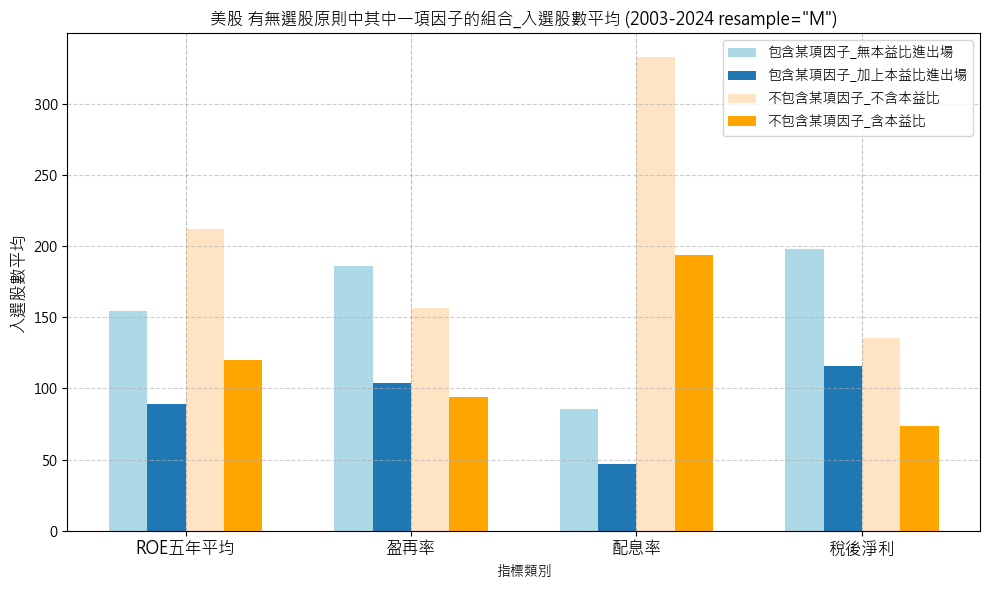

In [101]:
# 創建DataFrame
df = summary_df.copy()


# 定義類別順序
categories = ['ROE五年平均', '盈再率', '配息率', '稅後淨利']

# 創建類別對應的數據
included_no_pe_values = []  # 包含但不含本益比
included_with_pe_values = []  # 包含且含本益比
excluded_no_pe_values = []  # 不包含且不含本益比
excluded_with_pe_values = []  # 不包含且含本益比

for category in categories:
    # 包含且不含本益比
    mask_included_no_pe = df['Group'].str.contains(f'包含{category} \(不含本益比進出場\)')
    included_no_pe_values.append(df[mask_included_no_pe]['Average Selected Stock Count'].values[0])
    
    # 包含且含本益比
    mask_included_with_pe = df['Group'].str.contains(f'包含{category} \(含本益比進出場\)')
    included_with_pe_values.append(df[mask_included_with_pe]['Average Selected Stock Count'].values[0])
    
    # 不包含且不含本益比
    mask_excluded_no_pe = df['Group'].str.contains(f'不包含{category} \(不含本益比進出場\)')
    excluded_no_pe_values.append(df[mask_excluded_no_pe]['Average Selected Stock Count'].values[0])
    
    # 不包含且含本益比
    mask_excluded_with_pe = df['Group'].str.contains(f'不包含{category} \(含本益比進出場\)')
    excluded_with_pe_values.append(df[mask_excluded_with_pe]['Average Selected Stock Count'].values[0])

# 設置圖表大小
plt.figure(figsize=(10, 6))

# 設置bar的寬度
width = 0.17

# 設置x軸位置
x = np.arange(len(categories))

# 繪製條形圖
bars1 = plt.bar(x - width*1.5, included_no_pe_values, width, 
                label='包含某項因子_無本益比進出場', color='lightblue')
bars2 = plt.bar(x - width/2, included_with_pe_values, width, 
                label='包含某項因子_加上本益比進出場', color='tab:blue')
bars3 = plt.bar(x + width/2, excluded_no_pe_values, width, 
                label='不包含某項因子_不含本益比', color='bisque')
bars4 = plt.bar(x + width*1.5, excluded_with_pe_values, width, 
                label='不包含某項因子_含本益比', color='orange')

# 設置圖表標題和標籤
plt.title('美股 有無選股原則中其中一項因子的組合_入選股數平均 (2003-2024 resample="M")', fontsize=12)
plt.xlabel('指標類別')
plt.ylabel('入選股數平均', fontsize=12)

# 設置x軸刻度和標籤
plt.xticks(x, categories, fontsize=12)

# # 設置y軸範圍
# plt.ylim(0, 16)

# # 添加網格線
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.grid(axis='x', linestyle='--', alpha=0.8)



# 添加圖例
plt.legend()

# 調整布局
plt.tight_layout()

# 顯示圖表
plt.show()

In [102]:
# # 創建DataFrame
# df = summary_df

# # 設定中文字型
# plt.rcParams['font.sans-serif'] = ['Microsoft JhengHei']
# plt.rcParams['axes.unicode_minus'] = False

# # 處理數據：提取所需的行（包含/不包含且是含本益比進出場的組合）
# mask = df['Group'].str.contains('不含本益比進出場')
# filtered_df = df[mask].copy()

# # 定義類別順序
# categories = ['ROE五年平均', '盈再率', '配息率', '稅後淨利']

# # 創建類別對應的數據
# included_values = []
# excluded_values = []

# for category in categories:
#     # 獲取包含該類別的資料
#     included_mask = filtered_df['Group'].str.contains(f'包含{category}')
#     excluded_mask = filtered_df['Group'].str.contains(f'不包含{category}')
    
#     included_value = filtered_df[included_mask]['Average CAGR (%)'].values[0]
#     excluded_value = filtered_df[excluded_mask]['Average CAGR (%)'].values[0]
    
#     included_values.append(included_value)
#     excluded_values.append(excluded_value)

# # 設置圖表風格和大小
# # plt.style.use('seaborn')
# plt.figure(figsize=(14, 5))

# # 設置bar的寬度
# width = 0.17

# # 設置x軸位置
# x = np.arange(len(categories))

# # 繪製條形圖
# bars1 = plt.bar(x - width/2, included_values, width, label='包含', color='tab:blue')
# bars2 = plt.bar(x + width/2, excluded_values, width, label='不包含', color='orange')

# # 設置圖表標題和標籤
# plt.title('台股 有無選股原則中其中一項因子的組合 CAGR 平均 (不含本益比進出場)', fontsize=12)
# plt.xlabel('指標類別')
# plt.ylabel('Average CAGR (%)')

# # 設置x軸刻度和標籤
# plt.xticks(x, categories)



# # 設置y軸範圍
# plt.ylim(0, 16)

# # 添加網格線
# plt.grid(True, linestyle='--', alpha=0.8)

# benchmark_value=signal_dict_comb.selected_stock_count_analysis().loc['ROE五年平均+盈再率+三年配息率+稅後淨利_董監持股+上市櫃滿兩年']['CAGR (%)']
# plt.axhline(y=benchmark_value, color='red', linestyle='--', label='所有條件_沒有本益比進出場CAGR', linewidth=0.3)

# # 添加圖例
# plt.legend(loc='upper center', bbox_to_anchor=(1.15, 1), fontsize=12)


# # 調整布局
# plt.tight_layout()

# # 顯示圖表
# plt.show()

---

# TODO

## 選股策略使用不同篩選標準

#### memo

In [103]:
# # 無本益比進出場 #
# # 稅後淨利條件
# orig_all_cond = (roe_cond & rr_cond & payout_cond & netprofit_cond & listed_cond)[START_DATE:END_DATE]
# # 稅前淨利條件
# orig_all_cond_inc_bf_tax = (roe_cond & rr_cond & payout_cond & income_bf_tax_cond & listed_cond)[START_DATE:END_DATE]

# # 有本益比進出場 #
# # 每季本益比 #
# # 稅後淨利條件
# orig_all_cond_and_pe = ((orig_all_cond & pe_cond_entry[START_DATE:END_DATE]).hold_until((~orig_all_cond) | pe_cond_exit[START_DATE:END_DATE]))
# # 稅前淨利條件
# orig_all_cond_and_pe_inc_bf_tax = ((orig_all_cond_inc_bf_tax & pe_cond_entry[START_DATE:END_DATE]).hold_until((~orig_all_cond_inc_bf_tax) | pe_cond_exit[START_DATE:END_DATE]))

# # 每月月底本益比 #
# # 稅後淨利條件
# orig_all_cond_and_pe_daily = ((orig_all_cond & daily_pe_entry[START_DATE:END_DATE]).hold_until((~orig_all_cond) | daily_pe_exit[START_DATE:END_DATE]))
# # 稅前淨利條件
# orig_all_cond_and_pe_daily_inc_bf_tax = ((orig_all_cond_inc_bf_tax & daily_pe_entry[START_DATE:END_DATE]).hold_until((~orig_all_cond_inc_bf_tax) | daily_pe_exit[START_DATE:END_DATE]))

---

In [165]:
def plot_strategy_comparison(df, compare='CAGR (%)', title=None, order_list=None, pattern=False):
    """
    繪製策略比較的柱狀圖
    
    Parameters:
    -----------
    df : pandas DataFrame
        包含策略資訊的數據框
    compare : str, default='CAGR (%)'
        要比較的指標欄位名稱
    title : str, default=None
        自訂圖表標題，若為None則使用預設標題
    order_list : list, default=None
        指定策略前綴的顯示順序，若為None則使用原始順序
    pattern : bool, default=False
        是否顯示子標籤模式
    """
    import matplotlib.pyplot as plt
    import re
    
    # 取得所有策略名稱並分組
    strategies = df['Strategy'].tolist()
    strategy_pairs = {}
    
    for strategy in strategies:
        if '有本益比進出場' in strategy:
            prefix = strategy.replace('有本益比進出場', '')
            strategy_type = '有本益比'
        else:
            prefix = strategy.replace('無本益比進出場', '')
            strategy_type = '無本益比'
            
        if prefix not in strategy_pairs:
            strategy_pairs[prefix] = {}
        strategy_pairs[prefix][strategy_type] = df[df['Strategy'] == strategy][compare].values[0]

    # 如果有指定順序，重新排序strategy_pairs
    if order_list is not None:
        ordered_pairs = {k: strategy_pairs[k] for k in order_list if k in strategy_pairs}
        strategy_pairs = ordered_pairs

    # 設定圖表
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # 設定柱狀圖位置
    x = range(len(strategy_pairs))
    width = 0.35
    
    # 繪製柱狀圖
    rects1 = ax.bar([i - width/2 for i in x], 
                    [pair['有本益比'] for pair in strategy_pairs.values()],
                    width, label='有本益比')
    
    rects2 = ax.bar([i + width/2 for i in x], 
                    [pair['無本益比'] for pair in strategy_pairs.values()],
                    width, label='無本益比')

    # 設定主要x軸標籤
    ax.set_ylabel(compare)
    ax.set_title(title if title else f'策略比較 - {compare}')
    ax.set_xticks(x)
    ax.set_xticklabels(strategy_pairs.keys(), rotation=45, ha='right', fontsize=14)

    # 處理pattern模式的子標籤
    if pattern:
        # 創建第二個x軸
        ax2 = ax.twiny()
        ax2.spines['top'].set_position(('axes', 1.0))
        
        # 找出所有前綴模式
        prefixes = list(strategy_pairs.keys())
        patterns = set()
        for prefix in prefixes:
            match = re.match(r'([^_]+_[^_]+)_.*', prefix)
            if match:
                patterns.add(match.group(1))
        
        patterns = sorted(list(patterns))
        pattern_positions = {}
        
        # 計算每個模式的平均位置
        for pattern in patterns:
            pattern_indices = [i for i, prefix in enumerate(prefixes) if prefix.startswith(pattern)]
            if pattern_indices:
                pattern_positions[pattern] = sum(pattern_indices) / len(pattern_indices)
        
        # 設定子標籤
        ax2.set_xlim(ax.get_xlim())
        ax2.set_xticks([pattern_positions[pattern] for pattern in patterns])
        ax2.set_xticklabels(patterns, rotation=0, ha='center', fontsize=14)
        
        # 添加垂直分隔線
        ax.grid(False)  # 關閉默認格線
        
        # 獲取y軸的範圍
        ymin, ymax = ax.get_ylim()
        
        # 在每個pattern的起始和結束位置添加垂直線
        for pattern in patterns:
            pattern_start = min([i for i, prefix in enumerate(prefixes) if prefix.startswith(pattern)]) - 0.5
            pattern_end = max([i for i, prefix in enumerate(prefixes) if prefix.startswith(pattern)]) + 0.5
            
            # # 添加淺色背景區塊
            # ax.axvspan(pattern_start, pattern_end, 
            #           color='gray', alpha=0.1)
            
            # 添加垂直分隔線
            ax.axvline(x=pattern_start, color='gray', 
                      linestyle='--', alpha=0.7, linewidth=0.5)
            ax.axvline(x=pattern_end, color='gray', 
                      linestyle='--', alpha=0.7, linewidth=0.5)
        
    ax.legend(loc='upper right')
    plt.tight_layout()
    
    plt.show()

### 其他條件固定，ROE參數最佳化

In [105]:
roe_value_cond = {}
no_roe_conds = (rr_cond & netprofit_cond & payout_cond & listed_cond)[START_DATE:END_DATE]

for i in range(10, 31, 5): # 大於 10~30%
    for n in range(3, 6): # 3, 4, 5年平均
        

        roe_opt_df = roe.copy()
        roe_opt_df['month'] = roe_opt_df.index.month

        roe_df_result = roe_opt_df.groupby('month', group_keys=False).apply(lambda group: group.rolling(n, min_periods=n).mean(), include_groups=False)

        roe_cond_opt = (roe_df_result > (i/100))[START_DATE:END_DATE]

        roe_value_cond[f'roe_{n}y_{i}_無本益比進出場'] = (roe_cond_opt & no_roe_conds)[START_DATE:END_DATE]
        roe_value_cond[f'roe_{n}y_{i}_有本益比進出場'] = ((roe_cond_opt & no_roe_conds & daily_pe_entry[START_DATE:END_DATE]).hold_until((~(roe_cond_opt & no_roe_conds)) | daily_pe_exit[START_DATE:END_DATE]))
        
roe_collection = sim_conditions(roe_value_cond, resample='ME', data=data)
roe_collection.selected_stock_count_analysis()

Backtesting progress: 100%|██████████| 30/30 [01:14<00:00,  2.48s/condition]


,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
roe_3y_30_有本益比進出場,13.93,-50.98,9.02,10.00,6.25,12.00,3.00,18.00
roe_4y_25_有本益比進出場,13.04,-49.50,12.12,13.00,10.00,15.00,5.00,24.00
roe_3y_30_無本益比進出場,12.84,-42.94,17.17,15.00,8.00,25.00,4.00,37.00
roe_5y_25_有本益比進出場,12.75,-49.50,11.71,12.00,10.00,14.00,5.00,24.00
roe_3y_25_有本益比進出場,12.57,-52.24,12.02,13.00,9.00,15.00,5.00,24.00
roe_4y_30_有本益比進出場,12.51,-56.20,8.80,9.00,6.00,11.00,4.00,18.00
roe_4y_25_無本益比進出場,12.51,-45.93,22.77,21.00,12.00,33.75,7.00,45.00
roe_5y_30_有本益比進出場,12.34,-55.49,9.24,10.00,7.00,12.00,3.00,20.00
roe_3y_20_有本益比進出場,12.18,-49.93,16.22,17.00,14.00,19.00,7.00,28.00


In [106]:
roe_collection_df = roe_collection.selected_stock_count_analysis()
roe_collection_df.reset_index(inplace=True)

In [107]:
# 建立顏色映射
colors = {
    '10': 'tab:blue',
    '15': 'orange',
    '20': 'tab:green',
    '25': 'tab:red', 
    '30': 'tab:purple'
}

# 提取年份和ROE閾值
roe_collection_df['Year'] = roe_collection_df['Strategy'].str.extract(r'roe_(\d)y')
roe_collection_df['ROE'] = roe_collection_df['Strategy'].str.extract(r'_(\d+)_')
roe_collection_df['PE'] = roe_collection_df['Strategy'].str.contains('有本益比')

In [108]:
# 獲取唯一的年份值
years = sorted(roe_collection_df['Year'].unique())

# 設定長條的寬度
bar_width = 0.15

# 計算每個年份組的位置
positions = np.arange(len(years))

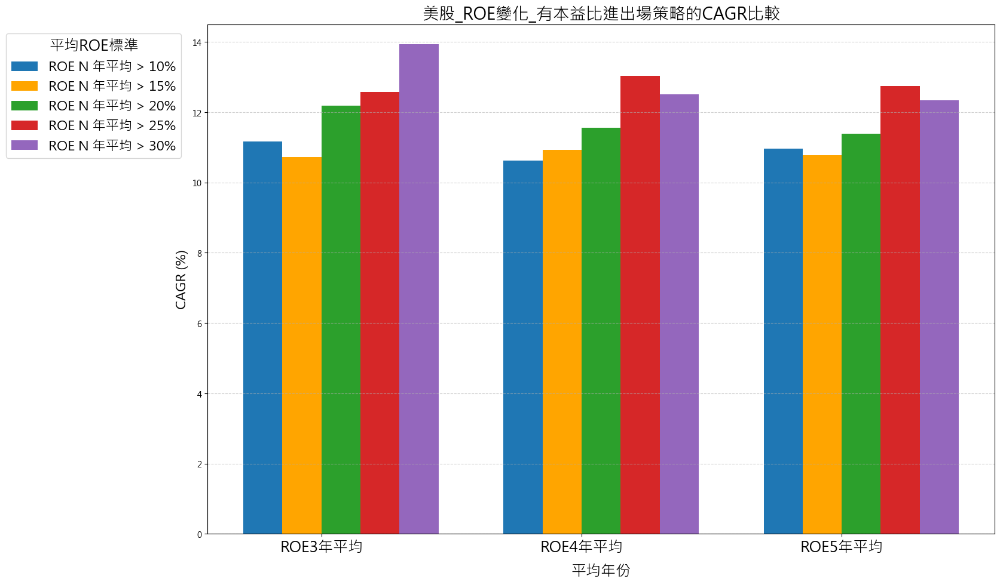

In [109]:
# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 10))

fig, ax1 = plt.subplots(figsize=(14, 10))

# 儲存所有CAGR值用於設定y軸範圍
roeopt_cagr_values = []

# 儲存有本益比和無本益比的CAGR值
cagr_with_pe = []
cagr_without_pe = []

# 繪製有本益比的長條圖
bars = []  # 儲存長條物件用於之後設定legend
for i, roe_bound in enumerate(['10', '15', '20', '25', '30']):
    mask_with_pe = (roe_collection_df['ROE'] == roe_bound) & (roe_collection_df['PE'])
    data_with_pe = [roe_collection_df[mask_with_pe & (roe_collection_df['Year'] == year)]['CAGR (%)'].values[0] 
                    if len(roe_collection_df[mask_with_pe & (roe_collection_df['Year'] == year)]) > 0 else 0 
                    for year in years]
    roeopt_cagr_values.extend(data_with_pe)
    cagr_with_pe.extend(data_with_pe)
    
    # 計算長條的位置
    x = positions + (i - 1.5) * bar_width

    # 繪製長條
    bar = ax1.bar(x, data_with_pe, bar_width, label=f'ROE {roe_bound}%', color=colors[roe_bound])
    bars.append(bar)

# # 繪製無本益比的長條圖
# for i, roe_bound in enumerate(['10', '15', '20', '25', '30']):
#     mask_without_pe = (roe_collection_df['ROE'] == roe_bound) & (~roe_collection_df['PE'])
#     data_without_pe = [roe_collection_df[mask_without_pe & (roe_collection_df['Year'] == year)]['CAGR (%)'].values[0] 
#                       if len(roe_collection_df[mask_without_pe & (roe_collection_df['Year'] == year)]) > 0 else 0 
#                       for year in years]
#     roeopt_cagr_values.extend(data_without_pe)
#     cagr_without_pe.extend(data_without_pe)
    
#     # 計算長條的位置
#     x = positions + (i - 1.5) * bar_width

#     # 繪製長條
#     ax2.bar(x, data_without_pe, bar_width, color=colors[roe_bound])

# 計算CAGR平均數
avg_cagr_with_pe = sum(cagr_with_pe) / len(cagr_with_pe)
# avg_cagr_without_pe = sum(cagr_without_pe) / len(cagr_without_pe)

# 設定兩個子圖的共同y軸範圍
ax1.set_ylim(0, 14.5)
# ax2.set_ylim(0, 14.5)

# 設定左方子圖（有本益比）
ax1.set_xticks(positions)
ax1.set_xticklabels([f'ROE{year}年平均' for year in years], fontsize=18)
ax1.set_title(f"美股_ROE變化_有本益比進出場策略的CAGR比較", fontsize=20)
ax1.set_xlabel('平均年份', fontsize=18, labelpad=10)
ax1.set_ylabel('CAGR (%)', fontsize=16)
ax1.grid(axis='y', linestyle='--', alpha=0.6)

# # 設定右方子圖（無本益比）
# ax2.set_xticks(positions)
# ax2.set_xticklabels([f'ROE{year}年平均' for year in years], fontsize=16)
# ax2.set_title(f"美股_ROE變化_無本益比進出場策略的CAGR比較", fontsize=16) # \nCAGR平均: {avg_cagr_without_pe:.2f}%'
# ax2.set_ylabel('CAGR (%)', fontsize=12)
# ax2.grid(axis='y', linestyle='--', alpha=0.6)

# 調整版面配置
plt.tight_layout()

# 將legend放在整個圖表的最左側
legend = fig.legend(bars, 
                   [f'ROE N 年平均 > {roe_bound}%' for roe_bound in ['10', '15', '20', '25', '30']], 
                   loc='upper left',
                   bbox_to_anchor=(-0.2, 0.95),  # 調整這些數值以微調legend位置
                   fontsize=16,
                   title="平均ROE標準", title_fontsize=18)


# # 在兩圖中間下方添加legend
# legend = fig.legend(bars, [f'ROE N 年平均 > {roe_bound}%' for roe_bound in ['10', '15', '20', '25', '30']], 
#                    loc='center', bbox_to_anchor=(0.5, 0.02),
#                    ncol=5, frameon=False, fontsize=14)

# 調整子圖之間的間距和底部空間
plt.subplots_adjust(bottom=0.1)  # 為legend留出空間

# 顯示圖表
plt.show()

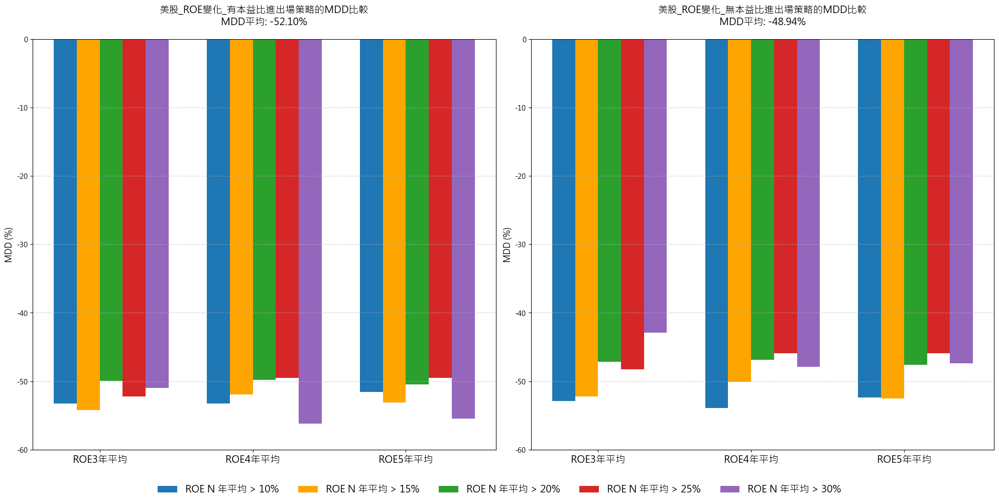

In [110]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

roeopt_mdd_values = []

# 儲存有本益比和無本益比的MDD值
mdd_with_pe = []
mdd_without_pe = []

# 繪製有本益比的長條圖
bars = []  # 儲存長條物件用於之後設定legend
for i, roe_bound in enumerate(['10', '15', '20', '25', '30']):
    mask_with_pe = (roe_collection_df['ROE'] == roe_bound) & (roe_collection_df['PE'])
    data_with_pe = [roe_collection_df[mask_with_pe & (roe_collection_df['Year'] == year)]['MDD (%)'].values[0] 
                    if len(roe_collection_df[mask_with_pe & (roe_collection_df['Year'] == year)]) > 0 else 0 
                    for year in years]
    roeopt_mdd_values.extend(data_with_pe)
    mdd_with_pe.extend(data_with_pe)
    
    # 計算長條的位置
    x = positions + (i - 1.5) * bar_width

    # 繪製長條
    bar = ax1.bar(x, data_with_pe, bar_width, label=f'ROE {roe_bound}%', color=colors[roe_bound])
    bars.append(bar)

# 繪製無本益比的長條圖
for i, roe_bound in enumerate(['10', '15', '20', '25', '30']):
    mask_without_pe = (roe_collection_df['ROE'] == roe_bound) & (~roe_collection_df['PE'])
    data_without_pe = [roe_collection_df[mask_without_pe & (roe_collection_df['Year'] == year)]['MDD (%)'].values[0] 
                      if len(roe_collection_df[mask_without_pe & (roe_collection_df['Year'] == year)]) > 0 else 0 
                      for year in years]
    roeopt_mdd_values.extend(data_without_pe)
    mdd_without_pe.extend(data_without_pe)
    
    # 計算長條的位置
    x = positions + (i - 1.5) * bar_width

    # 繪製長條
    ax2.bar(x, data_without_pe, bar_width, color=colors[roe_bound])

# 計算MDD平均數
avg_mdd_with_pe = sum(mdd_with_pe) / len(mdd_with_pe)
avg_mdd_without_pe = sum(mdd_without_pe) / len(mdd_without_pe)

# 設定兩個子圖的共同y軸範圍
ax1.set_ylim(-60, 0)
ax2.set_ylim(-60, 0)

# 設定左方子圖（有本益比）
ax1.set_xticks(positions)
ax1.set_xticklabels([f'ROE{year}年平均' for year in years], fontsize=14)
ax1.set_title(f'美股_ROE變化_有本益比進出場策略的MDD比較\nMDD平均: {avg_mdd_with_pe:.2f}%', fontsize=14, pad=20)
ax1.set_ylabel('MDD (%)', fontsize=12)
ax1.grid(axis='y', linestyle='--', alpha=0.6)

# 設定右方子圖（無本益比）
ax2.set_xticks(positions)
ax2.set_xticklabels([f'ROE{year}年平均' for year in years], fontsize=14)
ax2.set_title(f'美股_ROE變化_無本益比進出場策略的MDD比較\nMDD平均: {avg_mdd_without_pe:.2f}%', fontsize=14, pad=20)
ax2.set_ylabel('MDD (%)', fontsize=12)
ax2.grid(axis='y', linestyle='--', alpha=0.6)

# 調整版面配置
plt.tight_layout()

# 在兩圖中間下方添加legend
legend = fig.legend(bars, [f'ROE N 年平均 > {roe_bound}%' for roe_bound in ['10', '15', '20', '25', '30']], 
                   loc='center', bbox_to_anchor=(0.5, 0.02),
                   ncol=5, frameon=False, fontsize=14)

# 調整子圖之間的間距和底部空間
plt.subplots_adjust(bottom=0.1)  # 為legend留出空間

# 顯示圖表
plt.show()

#### 入選股數平均

In [111]:
# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

# # 儲存所有CAGR值用於設定y軸範圍
# roeopt_stock_values = []

# # 繪製有本益比的長條圖
# bars = []  # 儲存長條物件用於之後設定legend
# for i, roe_bound in enumerate(['10', '15', '20', '25', '30']):
#     mask_with_pe = (roe_collection_df['ROE'] == roe_bound) & (roe_collection_df['PE'])
#     data_with_pe = [roe_collection_df[mask_with_pe & (roe_collection_df['Year'] == year)]['入選股數平均'].values[0] 
#                     if len(roe_collection_df[mask_with_pe & (roe_collection_df['Year'] == year)]) > 0 else 0 
#                     for year in years]
#     roeopt_stock_values.extend(data_with_pe)
    
#     # 計算長條的位置
#     x = positions + (i - 1.5) * bar_width

#     # 繪製長條
#     bar = ax1.bar(x, data_with_pe, bar_width, label=f'ROE {roe_bound}%', color=colors[roe_bound])
#     bars.append(bar)

# # 繪製無本益比的長條圖
# for i, roe_bound in enumerate(['10', '15', '20', '25', '30']):
#     mask_without_pe = (roe_collection_df['ROE'] == roe_bound) & (~roe_collection_df['PE'])
#     data_without_pe = [roe_collection_df[mask_without_pe & (roe_collection_df['Year'] == year)]['入選股數平均'].values[0] 
#                       if len(roe_collection_df[mask_without_pe & (roe_collection_df['Year'] == year)]) > 0 else 0 
#                       for year in years]
#     roeopt_stock_values.extend(data_without_pe)
    
#     # 計算長條的位置
#     x = positions + (i - 1.5) * bar_width

#     # 繪製長條
#     ax2.bar(x, data_without_pe, bar_width, color=colors[roe_bound])

# # 設定兩個子圖的共同y軸範圍
# ax1.set_ylim(0,60)
# ax2.set_ylim(0,60)

# # 設定左方子圖（有本益比）
# ax1.set_xticks(positions)
# ax1.set_xticklabels([f'ROE{year}年平均' for year in years], fontsize=14)
# ax1.set_title('美股_ROE變化_有本益比進出場策略_入選股數平均', fontsize=14, pad=20)
# # ax1.set_xlabel('年份', fontsize=12)
# ax1.set_ylabel('數量', fontsize=12)
# ax1.grid(axis='y', linestyle='--', alpha=0.6)

# # 設定右方子圖（無本益比）
# ax2.set_xticks(positions)
# ax2.set_xticklabels([f'ROE{year}年平均' for year in years], fontsize=14)
# ax2.set_title('美股_ROE變化_無本益比進出場策略_入選股數平均', fontsize=14, pad=20)
# # ax2.set_xlabel('年份', fontsize=12)
# ax2.set_ylabel('數量', fontsize=12)
# ax2.grid(axis='y', linestyle='--', alpha=0.6)

# # 調整版面配置
# plt.tight_layout()

# # 在兩圖中間下方添加legend
# legend = fig.legend(bars, [f'ROE N 年平均 > {roe_bound}%' for roe_bound in ['10', '15', '20', '25', '30']], 
#                    loc='center', bbox_to_anchor=(0.5, 0.02),
#                    ncol=5, frameon=False, fontsize=14)

# # 調整子圖之間的間距和底部空間
# plt.subplots_adjust(bottom=0.1)  # 為legend留出空間

# # 顯示圖表
# plt.show()

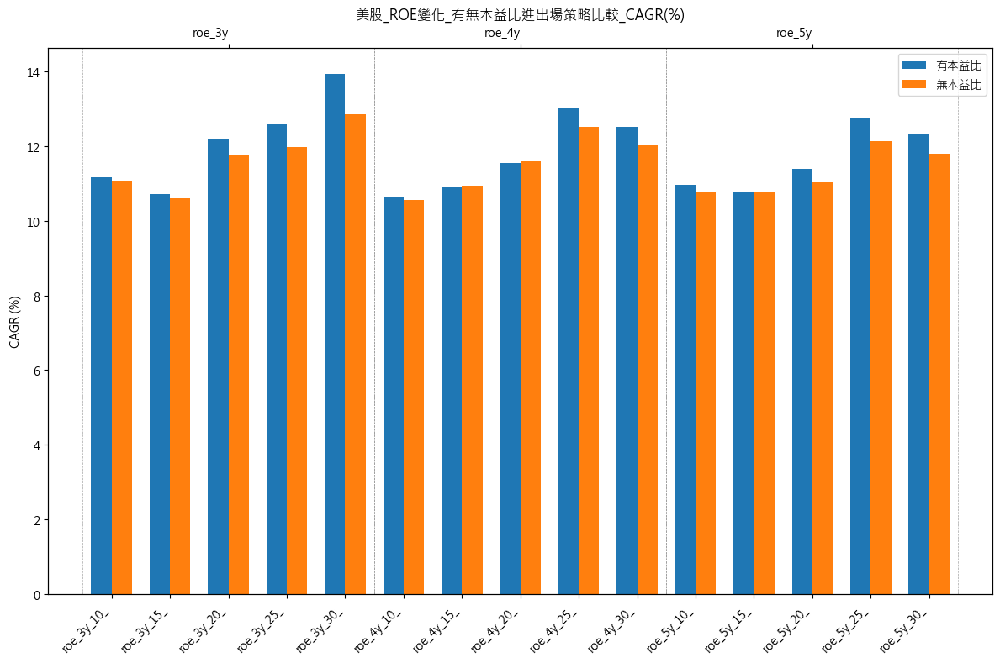

In [112]:
plot_strategy_comparison(roe_collection_df, 
                         title='美股_ROE變化_有無本益比進出場策略比較_CAGR(%)',
                         order_list=['roe_3y_10_', 'roe_3y_15_', 'roe_3y_20_', 'roe_3y_25_', 'roe_3y_30_',
                                     'roe_4y_10_', 'roe_4y_15_', 'roe_4y_20_', 'roe_4y_25_', 'roe_4y_30_',
                                     'roe_5y_10_', 'roe_5y_15_', 'roe_5y_20_', 'roe_5y_25_', 'roe_5y_30_'],
                         pattern=True)

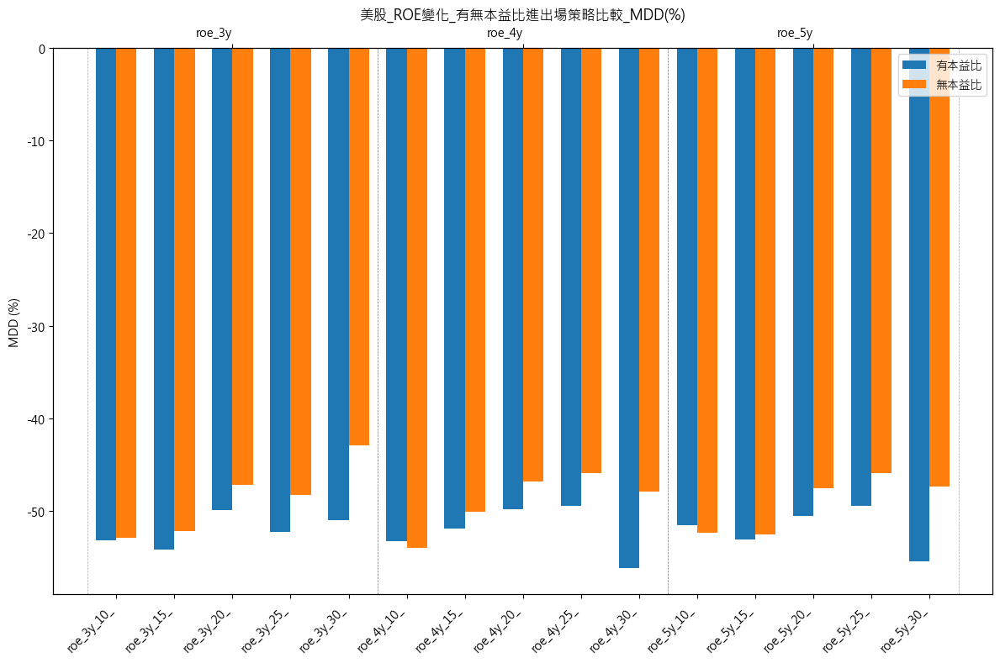

In [113]:
plot_strategy_comparison(roe_collection_df,
                            compare='MDD (%)',
                            title='美股_ROE變化_有無本益比進出場策略比較_MDD(%)',
                            order_list=['roe_3y_10_', 'roe_3y_15_', 'roe_3y_20_', 'roe_3y_25_', 'roe_3y_30_',
                                     'roe_4y_10_', 'roe_4y_15_', 'roe_4y_20_', 'roe_4y_25_', 'roe_4y_30_',
                                     'roe_5y_10_', 'roe_5y_15_', 'roe_5y_20_', 'roe_5y_25_', 'roe_5y_30_'],
                            pattern=True)

In [114]:
# plot_strategy_comparison(roe_collection_df,
#                             compare='入選股數平均',
#                             title='美股_ROE變化_有無本益比進出場策略比較_入選股數平均',
#                             order_list=['roe_3y_10_', 'roe_3y_15_', 'roe_3y_20_', 'roe_3y_25_', 'roe_3y_30_',
#                                      'roe_4y_10_', 'roe_4y_15_', 'roe_4y_20_', 'roe_4y_25_', 'roe_4y_30_',
#                                      'roe_5y_10_', 'roe_5y_15_', 'roe_5y_20_', 'roe_5y_25_', 'roe_5y_30_'])

### 其他條件固定，盈餘再投資率參數最佳化

In [115]:
rr_value_cond = {}
no_rr_conds = (roe_cond & netprofit_cond & payout_cond & listed_cond)[START_DATE:END_DATE]

for r in range(0, 81, 10): # 小於 0~40% (80%)

    rr_opt_df = rr.copy()
    rr_cond_opt = (rr_opt_df < (r/100))[START_DATE:END_DATE]

    rr_value_cond[f'盈再率小於_{r}_無本益比進出場'] = (rr_cond_opt & no_rr_conds)[START_DATE:END_DATE]
    rr_value_cond[f'盈再率小於_{r}_有本益比進出場'] = ((rr_cond_opt & no_rr_conds & daily_pe_entry[START_DATE:END_DATE]).hold_until((~(rr_cond_opt & no_rr_conds)) | daily_pe_exit[START_DATE:END_DATE]))

rr_collection = sim_conditions(rr_value_cond, resample='ME', data=data)
rr_collection.selected_stock_count_analysis()

Backtesting progress: 100%|██████████| 18/18 [00:48<00:00,  2.71s/condition]


,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
盈再率小於_10_無本益比進出場,12.14,-53.70,26.82,23.00,15.00,34.75,10.00,57.00
盈再率小於_20_有本益比進出場,12.07,-52.13,17.40,18.00,13.00,22.00,9.00,26.00
盈再率小於_10_有本益比進出場,12.04,-54.27,13.81,14.00,11.00,16.00,8.00,21.00
盈再率小於_20_無本益比進出場,11.80,-51.60,34.88,31.00,23.00,47.00,12.00,69.00
盈再率小於_30_有本益比進出場,11.26,-53.00,20.55,21.50,16.00,26.00,10.00,32.00
盈再率小於_30_無本益比進出場,10.88,-52.46,39.02,35.00,25.25,54.00,12.00,72.00
盈再率小於_70_無本益比進出場,10.87,-52.66,46.71,39.00,30.00,67.00,18.00,79.00
盈再率小於_80_無本益比進出場,10.86,-52.66,47.46,40.00,30.00,68.00,19.00,80.00
盈再率小於_0_無本益比進出場,10.83,-61.40,15.48,14.00,8.00,22.00,3.00,42.00


In [116]:
rr_collection_df = rr_collection.selected_stock_count_analysis()
rr_collection_df.reset_index(inplace=True)

改成柱狀圖

In [117]:
# # 分離有無本益比的策略
# no_pe_mask = rr_collection_df['Strategy'].str.contains('無本益比')
# with_pe_mask = rr_collection_df['Strategy'].str.contains('有本益比')

# # 從策略名稱中提取百分比數值
# rr_collection_df['threshold'] = rr_collection_df['Strategy'].str.extract(r'小於_(\d+)').astype(float)

# # 排序數據
# no_pe_data = rr_collection_df[no_pe_mask].sort_values('threshold')
# with_pe_data = rr_collection_df[with_pe_mask].sort_values('threshold')

# # 繪圖設定
# plt.figure(figsize=(10, 6))

# # 繪製無本益比策略的折線
# plt.plot(no_pe_data['threshold'], 
#          no_pe_data['CAGR (%)'], 
#          marker='o', 
#          linestyle='-', 
#          label='無本益比進出場', 
#          linewidth=2)

# # 繪製有本益比策略的折線
# plt.plot(with_pe_data['threshold'], 
#          with_pe_data['CAGR (%)'], 
#          marker='s', 
#          linestyle='--', 
#          label='有本益比進出場', 
#          linewidth=2)

# # 設定圖表格式
# plt.title('美股_盈再率變化_CAGR(%)比較', fontsize=14)
# plt.xlabel('盈再率 (%)', fontsize=12)
# plt.ylabel('CAGR (%)', fontsize=12)
# plt.grid(True, linestyle='--', alpha=0.7)
# plt.legend(fontsize=10)

# # 設定X軸刻度
# plt.xticks(no_pe_data['threshold'])

# # 顯示圖表
# plt.tight_layout()
# plt.show()

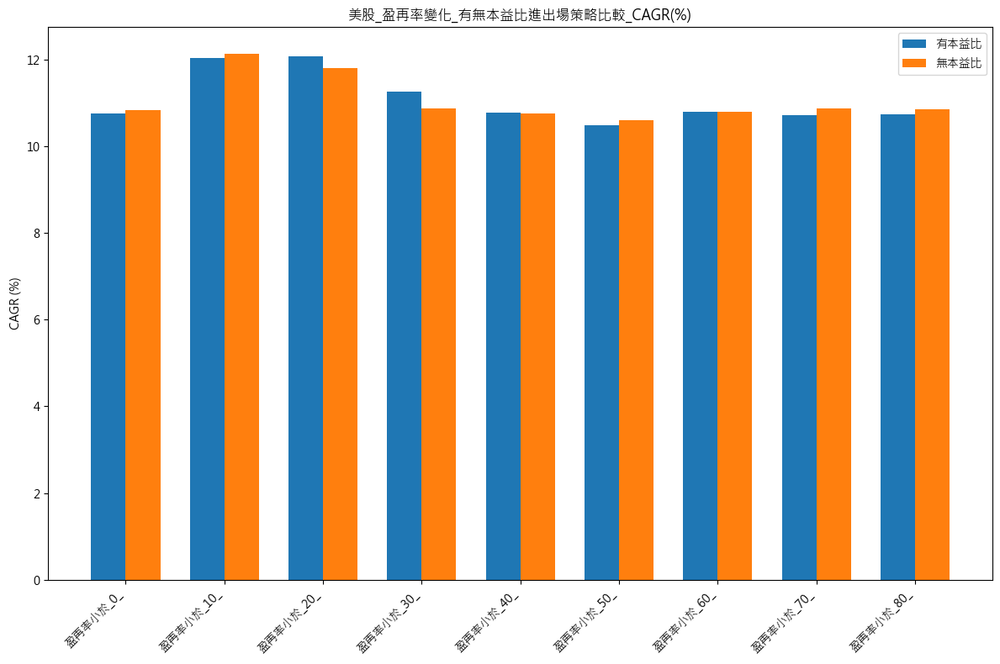

In [118]:
plot_strategy_comparison(rr_collection_df,
                            compare='CAGR (%)',
                            title='美股_盈再率變化_有無本益比進出場策略比較_CAGR(%)',
                            order_list=['盈再率小於_0_', '盈再率小於_10_', '盈再率小於_20_', '盈再率小於_30_', '盈再率小於_40_', '盈再率小於_50_', '盈再率小於_60_', '盈再率小於_70_', '盈再率小於_80_'])

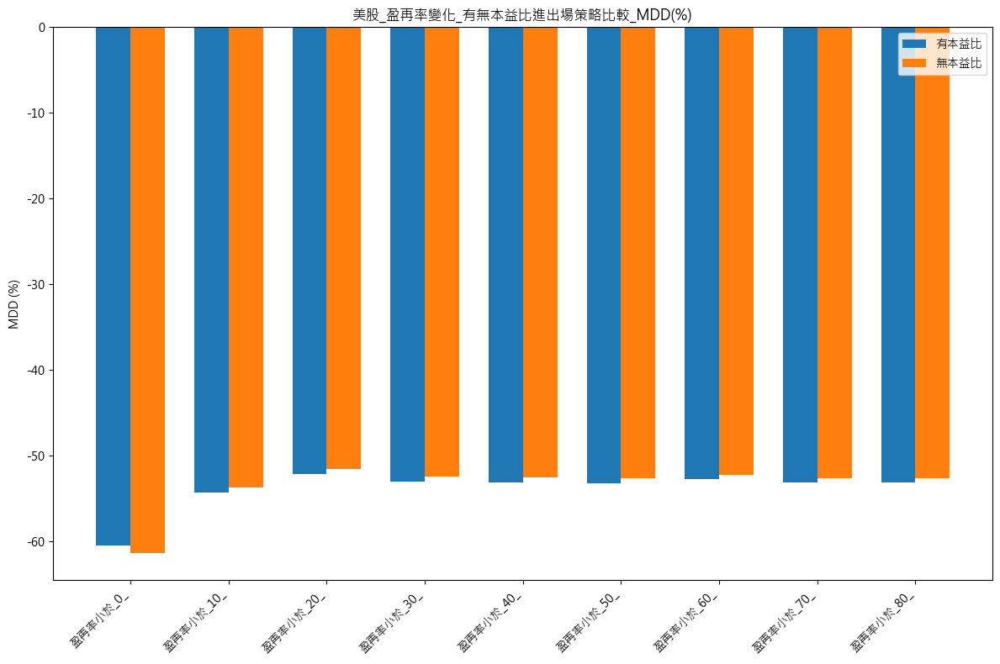

In [119]:
plot_strategy_comparison(rr_collection_df,
                            compare='MDD (%)',
                            title='美股_盈再率變化_有無本益比進出場策略比較_MDD(%)',
                            order_list=['盈再率小於_0_', '盈再率小於_10_', '盈再率小於_20_', '盈再率小於_30_', '盈再率小於_40_', '盈再率小於_50_', '盈再率小於_60_', '盈再率小於_70_', '盈再率小於_80_'])

In [120]:
# plot_strategy_comparison(rr_collection_df,
#                             compare='入選股數平均',
#                             title='美股_盈再率變化_有無本益比進出場策略比較_入選股數平均',
#                             order_list=['盈再率小於_0_', '盈再率小於_10_', '盈再率小於_20_', '盈再率小於_30_', '盈再率小於_40_', '盈再率小於_50_', '盈再率小於_60_', '盈再率小於_70_', '盈再率小於_80_'])

In [121]:
# rr_test_cond = {}
# no_rr_conds = (roe_cond & netprofit_cond & payout_cond & listed_cond)[START_DATE:END_DATE]

# # 小於0%的情境
# rr_test_df = rr.copy()
# rr_test_opt = (rr_test_df < 0)[START_DATE:END_DATE]
# rr_test_cond['盈再率小於_0_無本益比進出場'] = (rr_test_opt & no_rr_conds)[START_DATE:END_DATE]
# rr_test_cond['盈再率小於_0_有本益比進出場'] = ((rr_test_opt & no_rr_conds & daily_pe_entry[START_DATE:END_DATE]).hold_until((~(rr_test_opt & no_rr_conds)) | daily_pe_exit[START_DATE:END_DATE]))

# # 0%到80%，每20%一個區間
# for r in range(0, 61, 20):
#     rr_test_df = rr.copy()
#     rr_test_opt = ((rr_test_df >= (r/100)) & (rr_test_df < ((r+20)/100)))[START_DATE:END_DATE]
    
#     rr_test_cond[f'盈再率大於_{r}_小於_{r+20}_無本益比進出場'] = (rr_test_opt & no_rr_conds)[START_DATE:END_DATE]
#     rr_test_cond[f'盈再率大於_{r}_小於_{r+20}_有本益比進出場'] = ((rr_test_opt & no_rr_conds & daily_pe_entry[START_DATE:END_DATE]).hold_until((~(rr_test_opt & no_rr_conds)) | daily_pe_exit[START_DATE:END_DATE]))

# # 大於80%的情境
# rr_test_opt = (rr_test_df >= 0.8)[START_DATE:END_DATE]
# rr_test_cond['盈再率大於_80_無本益比進出場'] = (rr_test_opt & no_rr_conds)[START_DATE:END_DATE]
# rr_test_cond['盈再率大於_80_有本益比進出場'] = ((rr_test_opt & no_rr_conds & daily_pe_entry[START_DATE:END_DATE]).hold_until((~(rr_test_opt & no_rr_conds)) | daily_pe_exit[START_DATE:END_DATE]))

# rr_test_collection = sim_conditions(rr_test_cond, resample='ME', data=data)
# rr_test_collection.selected_stock_count_analysis()

In [122]:
rr_test_cond = {}
no_rr_conds = (roe_cond & netprofit_cond & payout_cond & listed_cond)[START_DATE:END_DATE]

# 小於0%的情境
rr_test_df = rr.copy()
rr_test_opt = (rr_test_df < 0)[START_DATE:END_DATE]
rr_test_cond['盈再率小於_0'] = (rr_test_opt & no_rr_conds)[START_DATE:END_DATE]
# rr_test_cond['盈再率小於_0_有本益比進出場'] = ((rr_test_opt & no_rr_conds & daily_pe_entry[START_DATE:END_DATE]).hold_until((~(rr_test_opt & no_rr_conds)) | daily_pe_exit[START_DATE:END_DATE]))

# 0%到80%，每20%一個區間
for r in range(0, 61, 20):
    rr_test_df = rr.copy()
    rr_test_opt = ((rr_test_df >= (r/100)) & (rr_test_df < ((r+20)/100)))[START_DATE:END_DATE]
    
    rr_test_cond[f'盈再率大於_{r}_小於_{r+20}'] = (rr_test_opt & no_rr_conds)[START_DATE:END_DATE]
    # rr_test_cond[f'盈再率大於_{r}_小於_{r+20}_有本益比進出場'] = ((rr_test_opt & no_rr_conds & daily_pe_entry[START_DATE:END_DATE]).hold_until((~(rr_test_opt & no_rr_conds)) | daily_pe_exit[START_DATE:END_DATE]))

# 大於80%的情境
rr_test_opt = (rr_test_df >= 0.8)[START_DATE:END_DATE]
rr_test_cond['盈再率大於_80'] = (rr_test_opt & no_rr_conds)[START_DATE:END_DATE]
# rr_test_cond['盈再率大於_80_有本益比進出場'] = ((rr_test_opt & no_rr_conds & daily_pe_entry[START_DATE:END_DATE]).hold_until((~(rr_test_opt & no_rr_conds)) | daily_pe_exit[START_DATE:END_DATE]))

rr_test_collection = sim_conditions(rr_test_cond, resample='ME', data=data)

Backtesting progress: 100%|██████████| 6/6 [00:13<00:00,  2.20s/condition]


In [123]:
rr_test_collection_df = rr_test_collection.selected_stock_count_analysis()
rr_test_collection_df.drop(columns=['CAGR (%)', 'MDD (%)', '25%', '75%'], inplace=True)

In [124]:
rr_test_collection_df.sort_values('入選股數平均', ascending=False)

,入選股數平均,中位數,Min,Max
Strategy,,,,
盈再率大於_0_小於_20,19.40,20.00,8.00,34.00
盈再率小於_0,15.48,14.00,3.00,42.00
盈再率大於_80,8.25,8.00,3.00,16.00
盈再率大於_20_小於_40,6.84,6.00,2.00,18.00
盈再率大於_40_小於_60,3.94,3.00,0.00,13.00
盈再率大於_60_小於_80,1.81,2.00,0.00,7.00


In [125]:
pr_value_cond = {}
no_pr_conds = (roe_cond & rr_cond & netprofit_cond & listed_cond)[START_DATE:END_DATE]

for k in range(0, 56, 5): # 大於 0~55%

    pr_cond_opt = (payout_ratio_rol.copy() > (k/100))[START_DATE:END_DATE]

    pr_value_cond[f'配息_三年至少{k}_無本益比進出場'] = (pr_cond_opt & no_pr_conds)[START_DATE:END_DATE]
    pr_value_cond[f'配息_三年至少{k}_有本益比進出場'] = ((pr_cond_opt & no_pr_conds & daily_pe_entry[START_DATE:END_DATE]).hold_until((~(pr_cond_opt & no_pr_conds)) | daily_pe_exit[START_DATE:END_DATE]))
    
pr_collection = sim_conditions(pr_value_cond, resample='ME', data=data)
pr_collection.selected_stock_count_analysis()

Backtesting progress: 100%|██████████| 24/24 [01:35<00:00,  3.98s/condition]


,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
配息_三年至少10_無本益比進出場,12.18,-49.12,149.71,137.50,122.00,191.00,71.00,226.00
配息_三年至少10_有本益比進出場,12.05,-49.85,90.53,98.00,73.25,111.00,45.00,131.00
配息_三年至少5_無本益比進出場,12.02,-50.87,164.94,152.00,135.00,215.75,84.00,251.00
配息_三年至少0_無本益比進出場,12.01,-51.74,175.14,165.00,143.00,223.75,92.00,276.00
配息_三年至少5_有本益比進出場,11.84,-51.77,100.14,108.00,84.00,119.75,49.00,145.00
配息_三年至少15_無本益比進出場,11.77,-49.63,133.71,122.00,104.25,172.50,66.00,207.00
配息_三年至少0_有本益比進出場,11.66,-53.03,107.86,115.00,91.00,126.75,54.00,157.00
配息_三年至少20_無本益比進出場,11.58,-48.05,113.95,107.00,83.50,148.00,54.00,183.00
配息_三年至少15_有本益比進出場,11.49,-50.20,79.22,86.00,59.00,98.00,42.00,116.00


In [126]:
# pr_value_cond = {}
# no_pr_conds = (roe_cond & rr_cond & netprofit_cond & listed_cond)[START_DATE:END_DATE]

# for year in range(1, 4): # 當年至少大於N%、兩年內、三年內
#     for k in range(0, 56, 5): # 大於 0~40%

#         pr_opt_df = payout_ratio.copy()
#         pr_opt_df['month'] = pr_opt_df.index.month

#         pr_df_result = pr_opt_df.groupby('month', group_keys=False).apply(lambda group: group.rolling(year, min_periods=year).min(), include_groups=False)

#         pr_cond_opt = (pr_df_result > (k/100))[START_DATE:END_DATE]

#         pr_value_cond[f'配息_{year}年_至少{k}_無本益比進出場'] = (pr_cond_opt & no_pr_conds)[START_DATE:END_DATE]
#         pr_value_cond[f'配息_{year}年_至少{k}_有本益比進出場'] = ((pr_cond_opt & no_pr_conds & daily_pe_entry[START_DATE:END_DATE]).hold_until((~(pr_cond_opt & no_pr_conds)) | daily_pe_exit[START_DATE:END_DATE]))
        
# pr_collection = sim_conditions(pr_value_cond, resample='ME', data=data)
# pr_collection.selected_stock_count_analysis()

In [127]:
pr_collection_df = pr_collection.selected_stock_count_analysis()
pr_collection_df.reset_index(inplace=True)

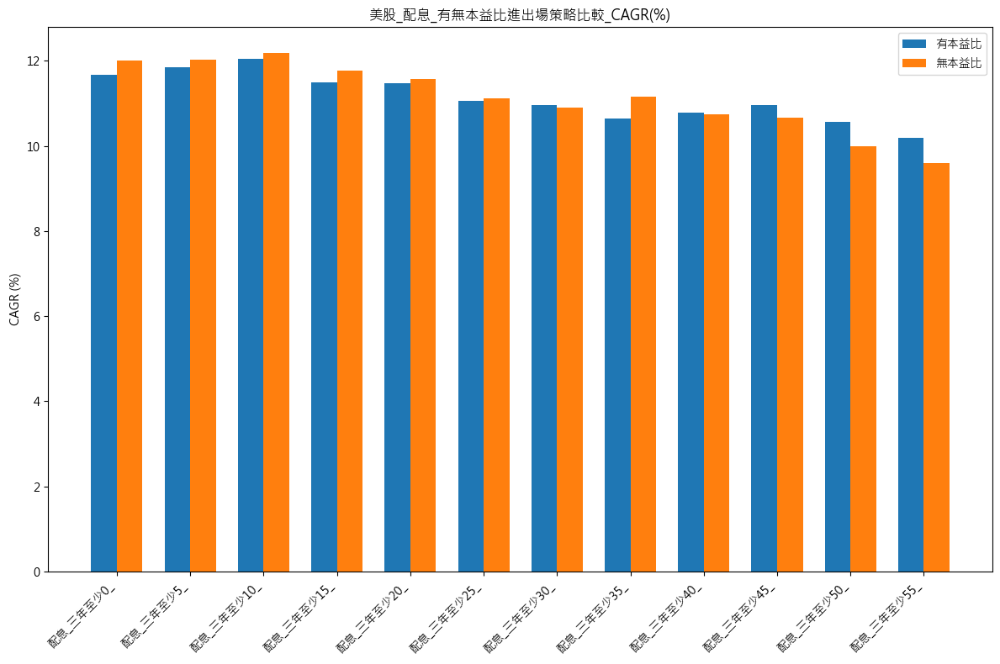

In [128]:
plot_strategy_comparison(pr_collection_df,
                            title='美股_配息_有無本益比進出場策略比較_CAGR(%)',
                            order_list=['配息_三年至少0_', '配息_三年至少5_', '配息_三年至少10_', '配息_三年至少15_', '配息_三年至少20_', '配息_三年至少25_', '配息_三年至少30_', '配息_三年至少35_', '配息_三年至少40_', '配息_三年至少45_', '配息_三年至少50_', '配息_三年至少55_'],
                            )

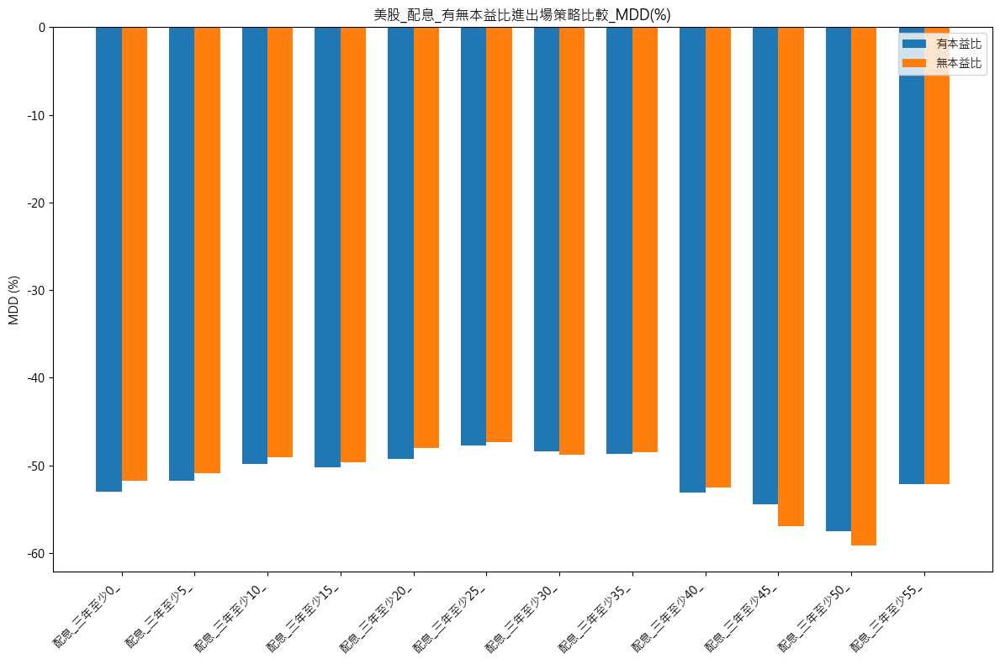

In [129]:
plot_strategy_comparison(pr_collection_df,
                            compare='MDD (%)',
                            title='美股_配息_有無本益比進出場策略比較_MDD(%)',
                            order_list=['配息_三年至少0_', '配息_三年至少5_', '配息_三年至少10_', '配息_三年至少15_', '配息_三年至少20_', '配息_三年至少25_', '配息_三年至少30_', '配息_三年至少35_', '配息_三年至少40_', '配息_三年至少45_', '配息_三年至少50_', '配息_三年至少55_'],
                            )

In [130]:
# plot_strategy_comparison(pr_collection_df,
#                             compare='入選股數平均',
#                             title='美股_配息率變化_有無本益比進出場策略比較_入選股數平均',
#                             order_list=['配息_三年至少0_', '配息_三年至少5_', '配息_三年至少10_', '配息_三年至少15_', '配息_三年至少20_', '配息_三年至少25_', '配息_三年至少30_', '配息_三年至少35_', '配息_三年至少40_', '配息_三年至少45_', '配息_三年至少50_', '配息_三年至少55_'])

In [131]:
# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# # 資料處理
# # 提取年數和門檻值
# pr_collection_df['years'] = pr_collection_df['Strategy'].str.extract(r'配息_(\d)年').astype(int)
# pr_collection_df['threshold'] = pr_collection_df['Strategy'].str.extract(r'至少(\d+)').astype(int)

# # 分離有無本益比的資料，並過濾掉Min為0的資料
# no_pe_data = pr_collection_df[pr_collection_df['Strategy'].str.contains('無本益比')]
# with_pe_data = pr_collection_df[pr_collection_df['Strategy'].str.contains('有本益比')]
# no_pe_data = no_pe_data[no_pe_data['Min'] != 0]
# with_pe_data = with_pe_data[with_pe_data['Min'] != 0]

# # 獲取排序後的門檻值和年份
# thresholds = sorted(pr_collection_df['threshold'].unique())
# years = sorted(pr_collection_df['years'].unique())

# # 設定線型和顏色
# line_styles = ['-', '--', '-.']
# colors = ['tab:blue', 'tab:orange', 'green']

# # 繪製有本益比進出場的子圖 (左側)
# for idx, year in enumerate(years):
#     year_data = with_pe_data[with_pe_data['years'] == year].sort_values('threshold')
#     if not year_data.empty:  # 確保有資料才繪圖
#         ax1.plot(year_data['threshold'],
#                  year_data['CAGR (%)'],
#                  label=f'{year}年',
#                  linestyle=line_styles[idx],
#                  color=colors[idx],
#                  marker='o',
#                  markersize=3,
#                  linewidth=1)

# # 繪製無本益比進出場的子圖 (右側)
# for idx, year in enumerate(years):
#     year_data = no_pe_data[no_pe_data['years'] == year].sort_values('threshold')
#     if not year_data.empty:  # 確保有資料才繪圖
#         ax2.plot(year_data['threshold'], 
#                  year_data['CAGR (%)'],
#                  label=f'{year}年',
#                  linestyle=line_styles[idx],
#                  color=colors[idx],
#                  marker='o',
#                  markersize=3,
#                  linewidth=1)

# # 設定子圖1的格式 (左側 - 有本益比)
# ax1.set_title('有本益比進出場', fontsize=12)
# ax1.set_xlabel('配息率 (%)', fontsize=10)
# ax1.set_ylabel('CAGR (%)', fontsize=10)
# ax1.grid(True, linestyle='--', alpha=0.7)
# ax1.legend(title='年期')

# # 設定子圖2的格式 (右側 - 無本益比)
# ax2.set_title('無本益比進出場', fontsize=12)
# ax2.set_xlabel('配息率 (%)', fontsize=10)
# ax2.set_ylabel('CAGR (%)', fontsize=10)
# ax2.grid(True, linestyle='--', alpha=0.7)
# ax2.legend(title='年期')

# # 設定X軸刻度
# ax1.set_xticks(thresholds)
# ax2.set_xticks(thresholds)

# ax1.set_ylim(8, 12.5)
# ax2.set_ylim(8, 12.5)

# # 調整圖表整體佈局
# plt.suptitle('美股_配息率變化_CAGR(%)比較', fontsize=14)
# plt.tight_layout()
# plt.show()

In [132]:
# pr_collection.reports['配息_1年_至少55_無本益比進出場'].display()
# pr_collection.reports['配息_3年_至少55_無本益比進出場'].trades

### 其他條件固定，PE進場條件參數最佳化

In [ ]:
pe_entry_value_cond = {}

# orig_all_cond
# daily_pe_entry = (pe_daily < 12).resample('ME').last()

for pe_entry_value in range(8, 13, 2): # 小於 8~12

    pe_entry_opt_df = (pe_daily < pe_entry_value).resample('ME').last()[START_DATE:END_DATE]

    pe_entry_value_cond[f'pe小於_{pe_entry_value}進場'] = ((orig_all_cond & pe_entry_opt_df).hold_until((~orig_all_cond) | daily_pe_exit[START_DATE:END_DATE]))

pe_entry_collection = sim_conditions(pe_entry_value_cond, resample='ME', data=data)
pe_entry_collection.selected_stock_count_analysis()

Backtesting progress: 100%|██████████| 3/3 [00:07<00:00,  2.59s/condition]


,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
pe小於_8進場,11.66,-55.93,11.61,10.00,8.00,15.00,4.00,23.00
pe小於_12進場,10.78,-53.11,22.28,24.00,18.00,26.75,11.00,38.00
pe小於_10進場,10.65,-54.91,16.52,16.00,12.00,20.00,9.00,29.00


In [166]:
pe_entry_collection.reports['pe小於_8進場'].display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,11.66%,22.65,-55.93%,69.57%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
PSA,2022-12-01,2024-10-01,2022-11-30,2024-09-30,0.08,459.00,5767.00,6226.00,0.31,-0.16,0.34,0.08,-0.23,240.00,0.00,0.00
APAM,2022-04-01,NaT,2022-03-31,NaT,0.14,691.00,5599.00,-1.00,0.30,-0.32,0.49,0.05,-0.35,391.00,0.12,0.14
BKE,2022-06-01,NaT,2022-05-31,NaT,0.12,650.00,5640.00,-1.00,0.91,-0.17,1.04,0.00,-0.34,599.00,0.12,0.14
CPB,2020-12-01,NaT,2020-11-30,2024-12-31,0.14,1027.00,5263.00,-1.00,-0.06,-0.18,0.22,0.06,-0.32,409.00,0.12,0.00
CVI,2024-05-01,NaT,2024-04-30,NaT,0.11,169.00,6121.00,-1.00,-0.35,-0.44,0.04,0.04,-0.46,15.00,0.12,0.14
GIS,2009-04-01,NaT,2009-03-31,NaT,0.04,3965.00,2325.00,-1.00,3.16,-0.03,4.67,0.01,-0.45,3953.00,0.12,0.14
KTB,2022-09-01,NaT,2022-08-31,NaT,0.11,586.00,5704.00,-1.00,1.47,-0.13,1.72,0.02,-0.28,544.00,0.12,0.14
OMC,2020-04-01,NaT,2020-03-31,NaT,0.07,1196.00,5094.00,-1.00,0.95,-0.09,1.39,0.24,-0.30,1170.00,0.12,0.14
OMF,2022-04-01,NaT,2022-03-31,NaT,0.14,691.00,5599.00,-1.00,0.36,-0.37,0.51,0.04,-0.39,334.00,0.12,0.14


In [134]:
# pe_entry_collection.reports['pe小於_8進場'].display()

---

## 兩兩一組

In [135]:
# def plot_strategy_heatmap(df, compare='CAGR (%)', x_first=True, figsize=(14, 6), title=None):
#     """
#     繪製策略熱力圖
    
#     Parameters:
#     -----------
#     df : pandas DataFrame
#         包含 'Strategy' 和比較欄位的數據框
#     compare : str, default='CAGR (%)'
#         要比較的欄位名稱，例如 'CAGR (%)' 或 'MDD (%)'
#     x_first : bool, default=True
#         True: 條件1為X軸，條件2為Y軸
#         False: 條件1為Y軸，條件2為X軸
#     figsize : tuple, default=(14, 6)
#         圖形尺寸
#     title : str, optional
#         圖表標題，如果不指定則自動生成
#     """
    
#     # 檢查比較欄位是否存在
#     if compare not in df.columns:
#         raise ValueError(f"Column '{compare}' not found in DataFrame")
    
#     # 初始化列表存儲參數
#     param1_values = []
#     param2_values = []
    
#     # 從策略名稱中提取參數
#     for strategy in df['Strategy']:
#         parts = strategy.split('_')
#         param1 = float(parts[1].replace('%', ''))
#         param2 = float(parts[3].replace('%', ''))
#         param1_values.append(param1)
#         param2_values.append(param2)
    
#     # 將提取的參數加入 DataFrame
#     df['Param1'] = param1_values
#     df['Param2'] = param2_values
    
#     # 獲取條件名稱
#     condition1_name = df['Strategy'].iloc[0].split('_')[0]
#     condition2_name = df['Strategy'].iloc[0].split('_')[2]
    
#     # 創建樞紐表
#     if x_first:
#         pivot_table = df.pivot(
#             index='Param2',
#             columns='Param1',
#             values=compare
#         )
#         xlabel = f"{condition1_name} (%)"
#         ylabel = f"{condition2_name} (%)"
#     else:
#         pivot_table = df.pivot(
#             index='Param1',
#             columns='Param2',
#             values=compare
#         )
#         # 當x_first=False時，反轉index順序
#         pivot_table = pivot_table.reindex(index=sorted(pivot_table.index, reverse=True))
#         xlabel = f"{condition2_name} (%)"
#         ylabel = f"{condition1_name} (%)"
    
#     # 設置圖形
#     plt.figure(figsize=figsize)
    
#     # 繪製熱力圖
#     sns.heatmap(pivot_table,
#                 annot=True,
#                 annot_kws={'size': 14},
#                 fmt='.2f',
#                 cmap='coolwarm',
#                 cbar_kws={'label': compare},  # 使用比較欄位名稱作為色階標籤
#                 square=True
#     )
    
#     # 設置標題和軸標籤
#     if title is None:
#         title = f'{condition1_name} vs {condition2_name} 策略{compare}比較'
#     plt.title(title)
#     plt.xlabel(xlabel)
#     plt.ylabel(ylabel)
    
#     # 調整布局
#     plt.tight_layout()
#     plt.show()

In [136]:
# def plot_strategy_heatmap(df, compare='CAGR (%)', x_first=True, figsize=(14, 6), title=None):
#     """
#     繪製策略熱力圖，當df['Min']==0時顯示灰色

#     Parameters:
#     -----------
#     df : pandas DataFrame
#         包含 'Strategy' 和比較欄位的數據框
#     compare : str, default='CAGR (%)'
#         要比較的欄位名稱，例如 'CAGR (%)' 或 'MDD (%)'
#     x_first : bool, default=True
#         True: 條件1為X軸，條件2為Y軸
#         False: 條件1為Y軸，條件2為X軸
#     figsize : tuple, default=(14, 6)
#         圖形尺寸
#     title : str, optional
#         圖表標題，如果不指定則自動生成
#     """
    
#     # 檢查比較欄位是否存在
#     if compare not in df.columns:
#         raise ValueError(f"Column '{compare}' not found in DataFrame")
    
#     # 初始化列表存儲參數
#     param1_values = []
#     param2_values = []
    
#     # 從策略名稱中提取參數
#     for strategy in df['Strategy']:
#         parts = strategy.split('_')
#         param1 = float(parts[1].replace('%', ''))
#         param2 = float(parts[3].replace('%', ''))
#         param1_values.append(param1)
#         param2_values.append(param2)
    
#     # 將提取的參數加入 DataFrame
#     df['Param1'] = param1_values
#     df['Param2'] = param2_values
    
#     # 獲取條件名稱
#     condition1_name = df['Strategy'].iloc[0].split('_')[0]
#     condition2_name = df['Strategy'].iloc[0].split('_')[2]

#     # 創建樞紐表 - 比較值
#     if x_first:
#         pivot_table = df.pivot(
#             index='Param2',
#             columns='Param1',
#             values=compare
#         )
#         min_pivot = df.pivot(
#             index='Param2',
#             columns='Param1',
#             values='Min'
#         )
#         # 修正：將索引按降序排列，確保圖上最下方是最小值
#         pivot_table = pivot_table.reindex(index=sorted(pivot_table.index, reverse=True))
#         min_pivot = min_pivot.reindex(index=sorted(min_pivot.index, reverse=True))
        
#         xlabel = f"{condition1_name} (%)"
#         ylabel = f"{condition2_name} (%)"
#     else:
#         pivot_table = df.pivot(
#             index='Param1',
#             columns='Param2',
#             values=compare
#         )
#         min_pivot = df.pivot(
#             index='Param1',
#             columns='Param2',
#             values='Min'
#         )
#         pivot_table = pivot_table.reindex(index=sorted(pivot_table.index, reverse=True))
#         min_pivot = min_pivot.reindex(index=sorted(min_pivot.index, reverse=True))
        
#         xlabel = f"{condition2_name} (%)"
#         ylabel = f"{condition1_name} (%)"
    
#     # 設置圖形
#     plt.figure(figsize=figsize)
    
#     # 創建遮罩
#     mask = (min_pivot == 0)
    
#     # 繪製熱力圖
#     sns.heatmap(pivot_table,
#                 annot=True,
#                 annot_kws={'size': 14},
#                 fmt='.2f',
#                 cmap='coolwarm',
#                 cbar_kws={'label': compare},
#                 square=True,
#                 mask=None)
    
#     # 在Min==0的位置上覆蓋統一的灰色方塊
#     for i in range(len(pivot_table.index)):
#         for j in range(len(pivot_table.columns)):
#             if mask.iloc[i, j]:
#                 plt.gca().add_patch(plt.Rectangle((j, i), 1, 1, fill=True, color='#808080'))
    
#     # 設置標題和軸標籤
#     if title is None:
#         title = f'{condition1_name} vs {condition2_name} 策略{compare}比較'
#     plt.title(title)
#     plt.xlabel(xlabel)
#     plt.ylabel(ylabel)
    
#     # 調整布局
#     plt.tight_layout()
#     plt.show()


In [137]:
def plot_strategy_heatmap(df, compare='CAGR (%)', x_first=True, figsize=(14, 6), title=None, 
                         benchmark_param1=None, benchmark_param2=None):
    """
    繪製策略熱力圖，當df['Min']==0時顯示灰色，並用白色框線標記Benchmark位置

    Parameters:
    -----------
    df : pandas DataFrame
        包含 'Strategy' 和比較欄位的數據框
    compare : str, default='CAGR (%)'
        要比較的欄位名稱，例如 'CAGR (%)' 或 'MDD (%)'
    x_first : bool, default=True
        True: 條件1為X軸，條件2為Y軸
        False: 條件1為Y軸，條件2為X軸
    figsize : tuple, default=(14, 6)
        圖形尺寸
    title : str, optional
        圖表標題，如果不指定則自動生成
    benchmark_param1 : float, optional
        指標1的基準值
    benchmark_param2 : float, optional
        指標2的基準值
    """
    
    if compare not in df.columns:
        raise ValueError(f"Column '{compare}' not found in DataFrame")
    
    param1_values = []
    param2_values = []
    
    # 從策略名稱中提取參數
    for strategy in df['Strategy']:
        parts = strategy.split('_')
        # 處理可能帶有%的數值
        param1 = float(parts[1].replace('%', ''))
        param2 = float(parts[3].replace('%', ''))
        param1_values.append(param1)
        param2_values.append(param2)
    
    df['Param1'] = param1_values
    df['Param2'] = param2_values
    
    condition1_name = df['Strategy'].iloc[0].split('_')[0]
    condition2_name = df['Strategy'].iloc[0].split('_')[2]

    if x_first:
        pivot_table = df.pivot(
            index='Param2',
            columns='Param1',
            values=compare
        )
        min_pivot = df.pivot(
            index='Param2',
            columns='Param1',
            values='Min'
        )
        pivot_table = pivot_table.reindex(index=sorted(pivot_table.index, reverse=True))
        min_pivot = min_pivot.reindex(index=sorted(min_pivot.index, reverse=True))
        
        xlabel = f"{condition1_name} (%)"
        ylabel = f"{condition2_name} (%)"
        
        # 找出Benchmark在熱力圖中的位置
        if benchmark_param1 is not None and benchmark_param2 is not None:
            benchmark_x = pivot_table.columns.get_loc(benchmark_param1)
            benchmark_y = pivot_table.index.get_loc(benchmark_param2)
    else:
        pivot_table = df.pivot(
            index='Param1',
            columns='Param2',
            values=compare
        )
        min_pivot = df.pivot(
            index='Param1',
            columns='Param2',
            values='Min'
        )
        pivot_table = pivot_table.reindex(index=sorted(pivot_table.index, reverse=True))
        min_pivot = min_pivot.reindex(index=sorted(min_pivot.index, reverse=True))
        
        xlabel = f"{condition2_name} (%)"
        ylabel = f"{condition1_name} (%)"
        
        # 找出Benchmark在熱力圖中的位置
        if benchmark_param1 is not None and benchmark_param2 is not None:
            benchmark_x = pivot_table.columns.get_loc(benchmark_param2)
            benchmark_y = pivot_table.index.get_loc(benchmark_param1)
    
    plt.figure(figsize=figsize)
    
    mask = (min_pivot == 0)
    
    # 繪製熱力圖
    sns.heatmap(pivot_table,
                annot=True,
                annot_kws={'size': 14},
                fmt='.2f',
                cmap='coolwarm',
                cbar_kws={'label': compare},
                square=True,
                mask=None)
    
    # 在Min==0的位置上覆蓋統一的灰色方塊
    for i in range(len(pivot_table.index)):
        for j in range(len(pivot_table.columns)):
            if mask.iloc[i, j]:
                plt.gca().add_patch(plt.Rectangle((j, i), 1, 1, fill=True, color='#808080'))
    
    # 如果有指定Benchmark參數，繪製白色框線
    if benchmark_param1 is not None and benchmark_param2 is not None:
        plt.gca().add_patch(plt.Rectangle((benchmark_x, benchmark_y), 1, 1, 
                                        fill=False, edgecolor='white', linewidth=2))
    
    if title is None:
        title = f'{condition1_name} vs {condition2_name} 策略{compare}比較'
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    plt.tight_layout()
    plt.show()

### ROE & 盈餘再投資率

In [138]:
roe_rr_opt_base_conds = payout_cond & netprofit_cond & listed_cond

roe_rr_pe_opt_conds = {}

for roevalue in range(10, 41, 5): # ROE5y平均 10~25%
    for rrvalue in range(0, 81, 10):  # 盈再率 0~80%
        rrvalue_opt = rr.copy() < (rrvalue/100)
        roe_5y_opt = roe_rol.copy() > (roevalue/100)
        
        roe_rr_opt_all_conds = (roe_rr_opt_base_conds & roe_5y_opt & rrvalue_opt)[START_DATE:END_DATE]

        roe_rr_pe_opt_conds[f'ROE5年平均_{roevalue}%_盈再率_{rrvalue}%__本益比進出場'] = (roe_rr_opt_all_conds & daily_pe_entry[START_DATE:END_DATE]).hold_until((~roe_rr_opt_all_conds) | daily_pe_exit[START_DATE:END_DATE])



roe_rr_pe_opt_collecs = sim_conditions(roe_rr_pe_opt_conds, resample='ME', data=data)
roe_rr_pe_opt_collecs.selected_stock_count_analysis()

Backtesting progress: 100%|██████████| 63/63 [02:22<00:00,  2.27s/condition]


,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
ROE5年平均_40%_盈再率_10%__本益比進出場,17.54,-39.08,3.53,4.00,2.00,5.00,0.00,6.00
ROE5年平均_40%_盈再率_0%__本益比進出場,15.36,-39.08,1.95,2.00,1.00,3.00,0.00,5.00
ROE5年平均_40%_盈再率_20%__本益比進出場,14.86,-43.80,4.41,5.00,3.00,6.00,1.00,8.00
ROE5年平均_35%_盈再率_10%__本益比進出場,13.83,-64.72,4.18,4.00,3.00,5.00,1.00,8.00
ROE5年平均_25%_盈再率_20%__本益比進出場,13.60,-50.45,8.88,9.00,8.00,10.00,4.00,16.00
...,...,...,...,...,...,...,...,...
ROE5年平均_15%_盈再率_70%__本益比進出場,10.71,-53.14,25.07,26.00,21.00,28.00,15.00,45.00
ROE5年平均_15%_盈再率_50%__本益比進出場,10.49,-53.25,23.24,24.00,19.00,27.00,12.00,42.00
ROE5年平均_10%_盈再率_0%__本益比進出場,10.23,-56.60,12.57,12.00,9.00,15.00,6.00,25.00


In [139]:
roe_rr_pe_opt_df = roe_rr_pe_opt_collecs.selected_stock_count_analysis()
roe_rr_pe_opt_df.reset_index(inplace=True)

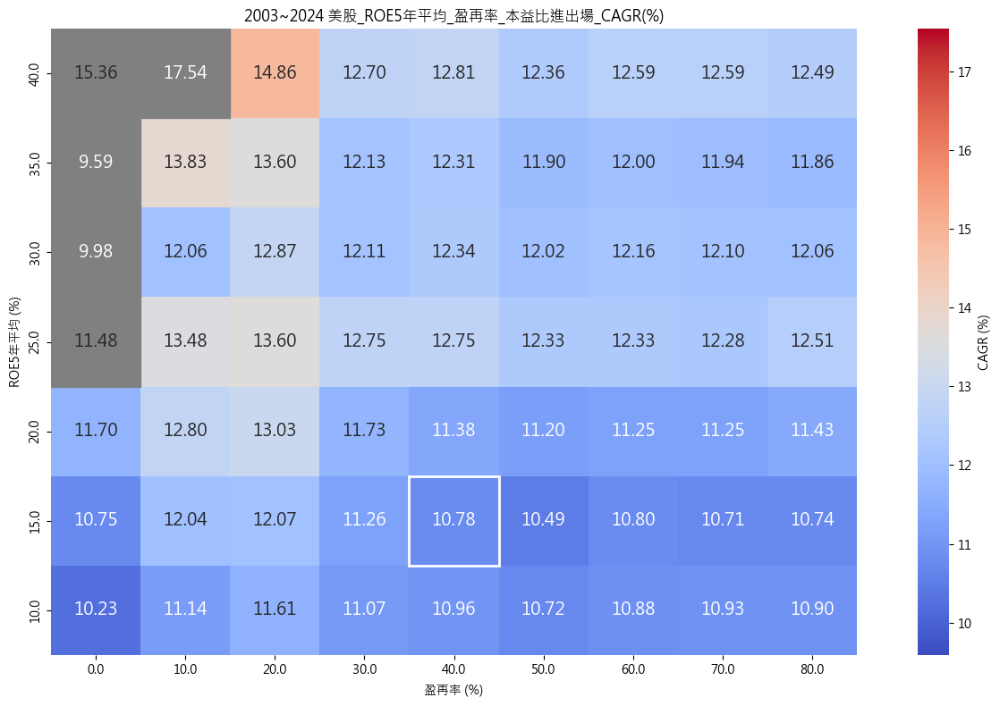

In [140]:
plot_strategy_heatmap(roe_rr_pe_opt_df,
                        x_first=False, 
                        title='2003~2024 美股_ROE5年平均_盈再率_本益比進出場_CAGR(%)',
                        figsize=(14, 8),
                        benchmark_param1=15,
                        benchmark_param2=40)

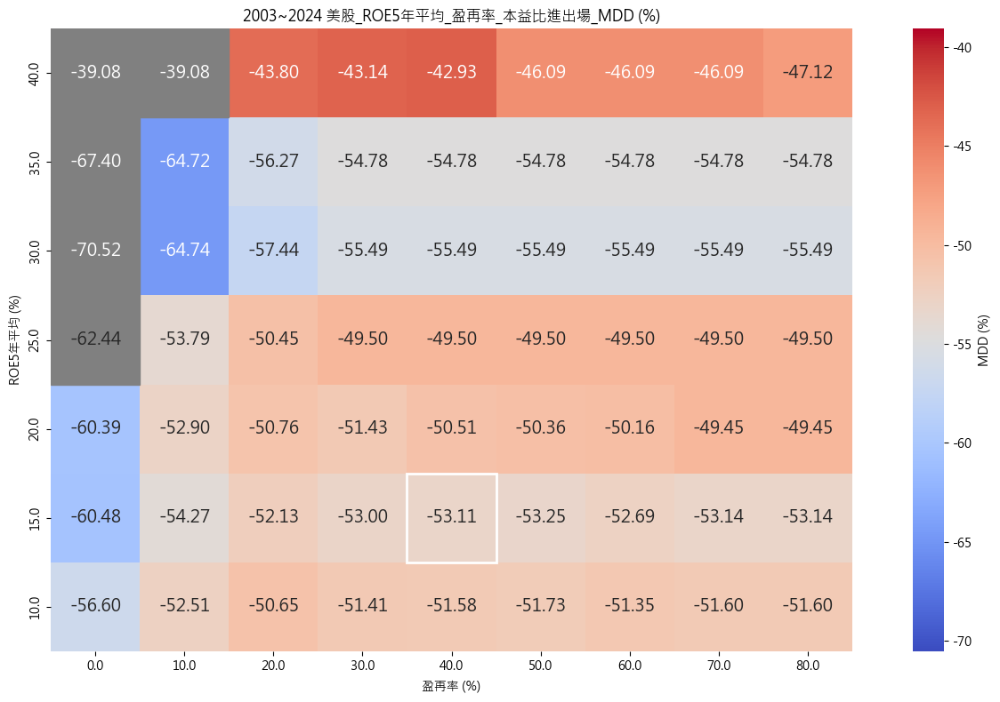

In [167]:
plot_strategy_heatmap(roe_rr_pe_opt_df,
                      compare='MDD (%)',
                        x_first=False, 
                        title='2003~2024 美股_ROE5年平均_盈再率_本益比進出場_MDD (%)',
                        figsize=(14, 8),
                        benchmark_param1=15,
                        benchmark_param2=40)

In [142]:
roe_rr_pe_opt_collecs.reports['ROE5年平均_25%_盈再率_40%__本益比進出場'].display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,12.75%,22.18,-49.5%,74.42%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
K,2018-05-01,2024-10-01,2018-04-30,2024-09-30,0.09,1615,4611,6226,0.84,-0.08,0.85,0.29,-0.30,1537.00,0.00,0.00
PSA,2023-04-03,2024-10-01,2023-03-31,2024-09-30,0.08,376,5850,6226,0.24,-0.21,0.26,0.02,-0.23,75.00,0.00,0.00
CPB,2020-12-01,2024-11-01,2020-11-30,2024-10-31,0.07,986,5263,6249,0.04,-0.18,0.22,0.06,-0.32,392.00,0.00,0.00
ALX,2024-05-01,NaT,2024-04-30,NaT,0.08,169,6121,-1,-0.05,-0.05,0.18,0.18,-0.20,144.00,0.10,0.10
APAM,2022-04-01,NaT,2022-03-31,NaT,0.11,691,5599,-1,0.30,-0.32,0.49,0.05,-0.35,391.00,0.10,0.10
BKE,2022-06-01,NaT,2022-05-31,NaT,0.09,650,5640,-1,0.91,-0.17,1.04,0.00,-0.34,599.00,0.10,0.10
CNA,2022-04-01,NaT,2022-03-31,NaT,0.11,691,5599,-1,0.15,-0.25,0.24,0.00,-0.26,231.00,0.10,0.10
CVI,2024-05-01,NaT,2024-04-30,NaT,0.08,169,6121,-1,-0.35,-0.44,0.04,0.04,-0.46,15.00,0.10,0.10
GIS,2012-09-04,NaT,2012-08-31,NaT,0.07,3101,3189,-1,1.41,-0.01,2.29,0.00,-0.45,3091.00,0.10,0.10


In [143]:
# plot_strategy_heatmap(roe_rr_pe_opt_df,
#                         compare='MDD (%)',
#                         x_first=False, 
#                         title='2003~2024 台股策略績效分析',
#                         figsize=(18, 8))

### ROE & 配息率

In [144]:
roe_dpr_opt_base_conds = rr_cond & netprofit_cond & listed_cond

roe_dpr_pe_opt_conds = {}

for roevalue in range(10, 41, 5): # ROE 10~25%
    for povalue in range(0, 56, 5):  # 配息率 0~75%
        dpr_cond_3y_opt = payout_ratio_rol.copy() >= (povalue/100)
        roe_5y_opt = roe_rol.copy() > (roevalue/100)
        
        roe_dpr_opt_all_conds = (roe_dpr_opt_base_conds & roe_5y_opt & dpr_cond_3y_opt)[START_DATE:END_DATE]

        roe_dpr_pe_opt_conds[f'ROE5年平均_{roevalue}%_配息率_{povalue}%__本益比進出場'] = (roe_dpr_opt_all_conds & daily_pe_entry[START_DATE:END_DATE]).hold_until((~roe_dpr_opt_all_conds) | daily_pe_exit[START_DATE:END_DATE])



roe_dpr_pe_opt_collecs = sim_conditions(roe_dpr_pe_opt_conds, resample='ME', data=data)
roe_dpr_pe_opt_collecs.selected_stock_count_analysis()

Backtesting progress: 100%|██████████| 84/84 [04:16<00:00,  3.05s/condition]


,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
ROE5年平均_40%_配息率_45%__本益比進出場,14.87,-49.11,3.29,3.00,2.00,4.00,0.00,8.00
ROE5年平均_25%_配息率_45%__本益比進出場,13.28,-53.44,8.10,8.00,5.00,10.00,3.00,20.00
ROE5年平均_40%_配息率_40%__本益比進出場,12.81,-42.93,5.21,6.00,4.00,7.00,1.00,10.00
ROE5年平均_25%_配息率_40%__本益比進出場,12.75,-49.50,11.71,12.00,10.00,14.00,5.00,24.00
ROE5年平均_40%_配息率_20%__本益比進出場,12.72,-47.53,10.81,12.00,7.00,14.00,4.00,17.00
...,...,...,...,...,...,...,...,...
ROE5年平均_35%_配息率_50%__本益比進出場,10.28,-64.72,3.27,3.00,2.00,4.00,1.00,10.00
ROE5年平均_15%_配息率_55%__本益比進出場,10.18,-52.10,7.31,7.00,5.00,9.00,2.00,17.00
ROE5年平均_30%_配息率_50%__本益比進出場,10.04,-67.93,4.71,5.00,2.25,6.00,1.00,13.00


In [145]:
roe_dpr_pe_opt_df = roe_dpr_pe_opt_collecs.selected_stock_count_analysis()
roe_dpr_pe_opt_df.reset_index(inplace=True)

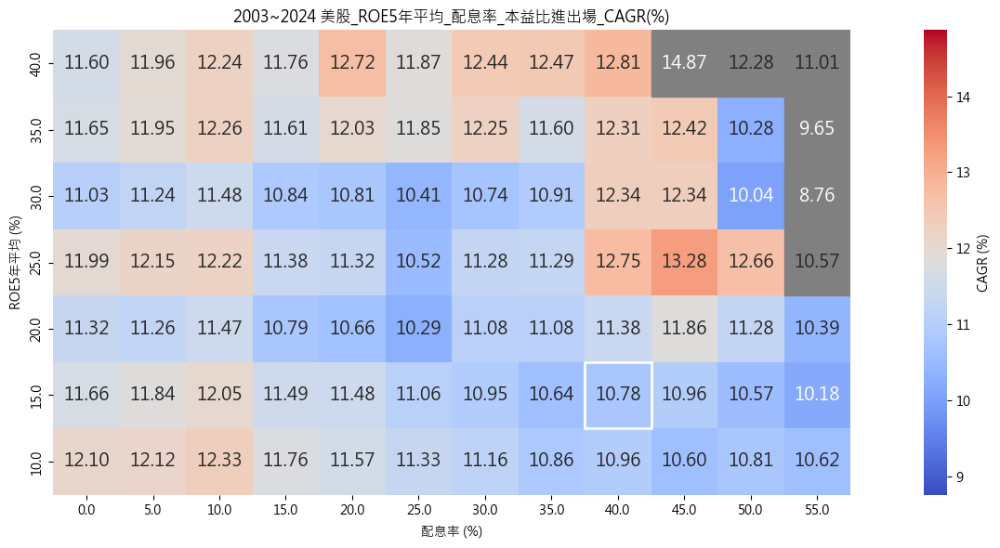

In [146]:
plot_strategy_heatmap(roe_dpr_pe_opt_df,
                        x_first=False, 
                        title='2003~2024 美股_ROE5年平均_配息率_本益比進出場_CAGR(%)',
                        figsize=(16, 6),
                        benchmark_param1=15,
                        benchmark_param2=40)

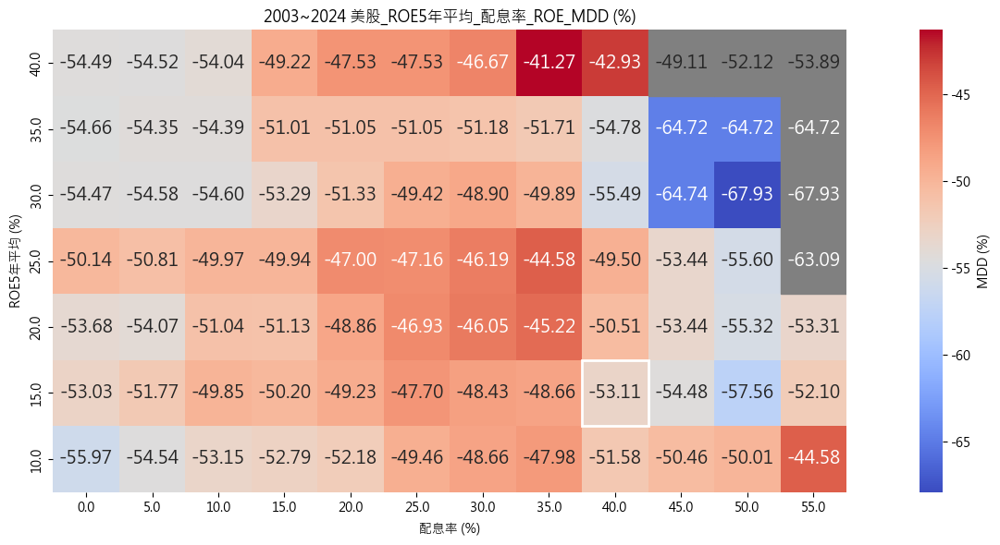

In [147]:
plot_strategy_heatmap(roe_dpr_pe_opt_df,
                        compare='MDD (%)',
                        x_first=False, 
                        title='2003~2024 美股_ROE5年平均_配息率_ROE_MDD (%)',
                        figsize=(16, 6),
                        benchmark_param1=15,
                        benchmark_param2=40)

### ROE & PE

In [148]:
roe_pee_opt_base_conds = rr_cond & payout_cond & netprofit_cond & listed_cond

roe_pee_opt_conds = {}

for roevalue in range(10, 41, 5): # ROE 10~25%
    for peevalue in range(8, 13, 2):  # 本益比

        roe_5y_opt = roe_rol.copy() > (roevalue/100)
        pee_opt = (pe_daily < peevalue).resample('ME').last()
        
        roe_pee_opt_all_conds = (roe_pee_opt_base_conds & roe_5y_opt)[START_DATE:END_DATE]

        roe_pee_opt_conds[f'ROE5年平均_{roevalue}%_本益比_{peevalue}__本益比進出場'] = (roe_pee_opt_all_conds & pee_opt[START_DATE:END_DATE]).hold_until((~roe_pee_opt_all_conds) | daily_pe_exit[START_DATE:END_DATE])


roe_pee_opt_collecs = sim_conditions(roe_pee_opt_conds, resample='ME', data=data)
roe_pee_opt_collecs.selected_stock_count_analysis()

Backtesting progress: 100%|██████████| 21/21 [01:00<00:00,  2.86s/condition]


,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
ROE5年平均_40%_本益比_8__本益比進出場,14.08,-58.99,3.06,3.00,2.00,4.00,0.00,6.00
ROE5年平均_25%_本益比_8__本益比進出場,13.43,-57.05,5.64,6.00,4.00,7.00,3.00,9.00
ROE5年平均_25%_本益比_10__本益比進出場,12.94,-52.59,8.63,9.00,7.00,10.00,4.00,18.00
ROE5年平均_40%_本益比_12__本益比進出場,12.81,-42.93,5.21,6.00,4.00,7.00,1.00,10.00
ROE5年平均_25%_本益比_12__本益比進出場,12.75,-49.50,11.71,12.00,10.00,14.00,5.00,24.00
ROE5年平均_20%_本益比_8__本益比進出場,12.65,-54.57,8.34,8.00,6.00,10.00,4.00,15.00
ROE5年平均_30%_本益比_10__本益比進出場,12.39,-55.66,7.14,7.00,6.00,8.00,3.00,15.00
ROE5年平均_30%_本益比_12__本益比進出場,12.34,-55.49,9.24,10.00,7.00,12.00,3.00,20.00
ROE5年平均_35%_本益比_12__本益比進出場,12.31,-54.78,6.40,7.00,4.00,8.00,3.00,16.00


In [149]:
roe_pee_opt_df = roe_pee_opt_collecs.selected_stock_count_analysis()
roe_pee_opt_df.reset_index(inplace=True)

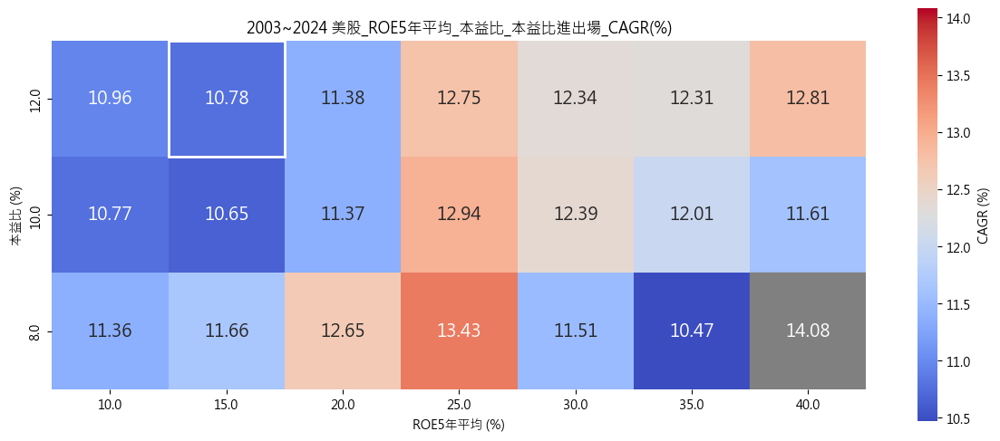

In [150]:
plot_strategy_heatmap(roe_pee_opt_df,
                        x_first=1, 
                        title='2003~2024 美股_ROE5年平均_本益比_本益比進出場_CAGR(%)',
                        figsize=(12, 5),
                        benchmark_param1=15,
                        benchmark_param2=12)

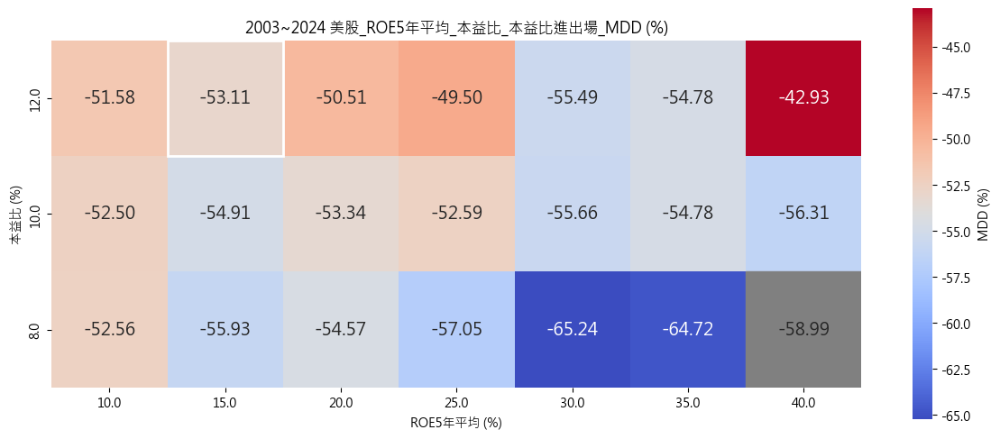

In [151]:
plot_strategy_heatmap(roe_pee_opt_df,
                      compare='MDD (%)',
                        x_first=1, 
                        title='2003~2024 美股_ROE5年平均_本益比_本益比進出場_MDD (%)',
                        figsize=(12, 5),
                        benchmark_param1=15,
                        benchmark_param2=12)

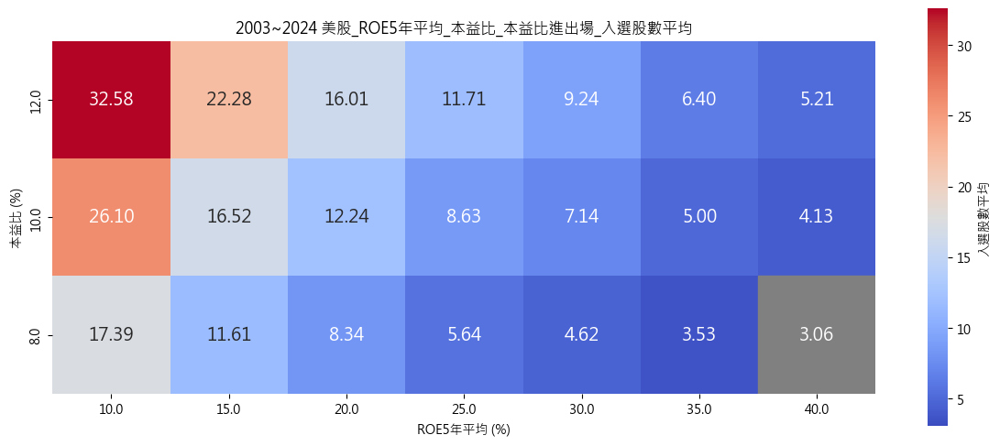

In [152]:
plot_strategy_heatmap(roe_pee_opt_df,
                      compare='入選股數平均',
                        x_first=1, 
                        title='2003~2024 美股_ROE5年平均_本益比_本益比進出場_入選股數平均',
                        figsize=(12, 5))

### 盈再率 & 配息率

In [153]:
rr_dpr_opt_base_conds = roe_cond & netprofit_cond & listed_cond

rr_dpr_pe_opt_conds = {}

for rrvalue in range(0, 81, 10): # 盈再率 
    for povalue in range(0, 56, 5):  # 配息率 0~55%

        dpr_cond_3y_opt = payout_ratio_rol.copy() >= (povalue/100)
        rrvalue_opt = rr.copy() < (rrvalue/100)
        
        rr_dpr_opt_all_conds = (rr_dpr_opt_base_conds & dpr_cond_3y_opt & rrvalue_opt)[START_DATE:END_DATE]

        rr_dpr_pe_opt_conds[f'盈再率小於_{rrvalue}%_配息率_{povalue}%__本益比進出場'] = (rr_dpr_opt_all_conds & daily_pe_entry[START_DATE:END_DATE]).hold_until((~rr_dpr_opt_all_conds) | daily_pe_exit[START_DATE:END_DATE])



rr_dpr_pe_opt_collecs = sim_conditions(rr_dpr_pe_opt_conds, resample='ME', data=data)
rr_dpr_pe_opt_collecs.selected_stock_count_analysis()

Backtesting progress: 100%|██████████| 108/108 [07:10<00:00,  3.99s/condition]


,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
盈再率小於_10%_配息率_15%__本益比進出場,13.08,-52.86,44.71,48.00,30.00,57.00,18.00,69.00
盈再率小於_10%_配息率_20%__本益比進出場,12.93,-50.97,38.08,42.00,26.00,50.00,14.00,57.00
盈再率小於_10%_配息率_10%__本益比進出場,12.92,-53.36,49.29,53.00,36.00,60.00,22.00,79.00
盈再率小於_10%_配息率_25%__本益比進出場,12.87,-49.88,31.15,35.00,21.00,40.00,14.00,47.00
盈再率小於_20%_配息率_10%__本益比進出場,12.71,-50.82,68.01,73.50,52.00,86.00,31.00,103.00
...,...,...,...,...,...,...,...,...
盈再率小於_70%_配息率_55%__本益比進出場,10.07,-51.18,8.11,7.00,6.00,10.00,2.00,20.00
盈再率小於_0%_配息率_45%__本益比進出場,8.68,-61.15,5.31,5.00,3.00,7.00,1.00,12.00
盈再率小於_10%_配息率_55%__本益比進出場,8.54,-54.78,4.68,5.00,4.00,6.00,1.00,9.00


In [154]:
rr_dpr_pe_opt_df = rr_dpr_pe_opt_collecs.selected_stock_count_analysis()
rr_dpr_pe_opt_df.reset_index(inplace=True)

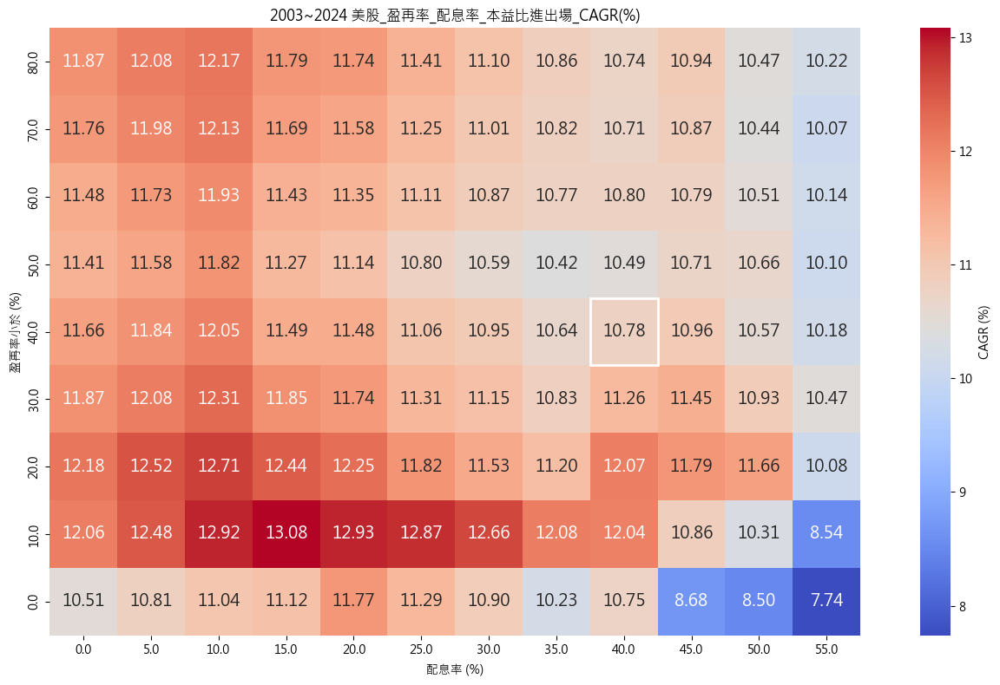

In [155]:
plot_strategy_heatmap(rr_dpr_pe_opt_df,
                        x_first=0, 
                        title='2003~2024 美股_盈再率_配息率_本益比進出場_CAGR(%)',
                        figsize=(14, 8),
                        benchmark_param1=40,
                        benchmark_param2=40)

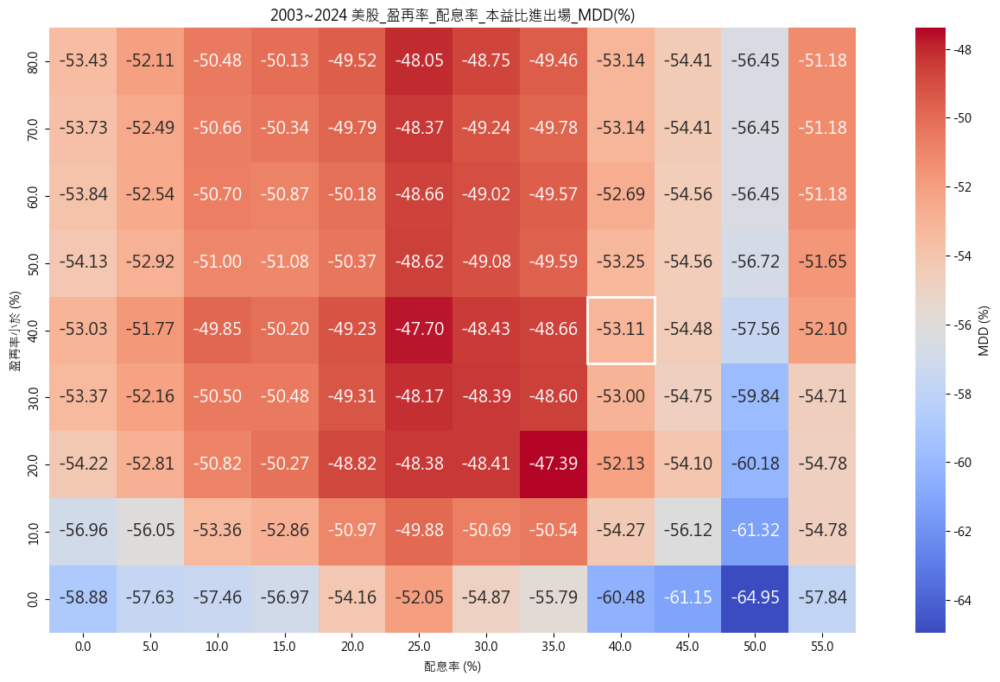

In [169]:
plot_strategy_heatmap(rr_dpr_pe_opt_df,
                        x_first=0, 
                        compare='MDD (%)',
                        title='2003~2024 美股_盈再率_配息率_本益比進出場_MDD(%)',
                        figsize=(14, 8),
                        benchmark_param1=40,
                        benchmark_param2=40)

### 盈再率 & PE

In [156]:
rr_pee_opt_base_conds = roe_cond & payout_cond & netprofit_cond & listed_cond

rr_pee_opt_conds = {}

for rrvalue in range(0, 81, 10): # 盈再率
    for peevalue in range(8, 13, 2):  # 本益比

        pee_opt = (pe_daily < peevalue).resample('ME').last()
        rrvalue_opt = rr.copy() < (rrvalue/100)
        
        rr_pee_opt_all_conds = (rr_pee_opt_base_conds & rrvalue_opt)[START_DATE:END_DATE]

        rr_pee_opt_conds[f'盈再率小於_{rrvalue}%_本益比_{peevalue}__本益比進出場'] = (rr_pee_opt_all_conds & pee_opt[START_DATE:END_DATE]).hold_until((~rr_pee_opt_all_conds) | daily_pe_exit[START_DATE:END_DATE])

rr_pee_collecs = sim_conditions(rr_pee_opt_conds, resample='ME', data=data)
rr_pee_collecs.selected_stock_count_analysis()

Backtesting progress: 100%|██████████| 27/27 [01:28<00:00,  3.27s/condition]


,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
盈再率小於_10%_本益比_8__本益比進出場,12.61,-57.90,6.35,6.00,4.00,8.00,1.00,17.00
盈再率小於_20%_本益比_8__本益比進出場,12.20,-55.91,8.56,8.00,5.00,11.00,1.00,22.00
盈再率小於_20%_本益比_12__本益比進出場,12.07,-52.13,17.40,18.00,13.00,22.00,9.00,26.00
盈再率小於_10%_本益比_12__本益比進出場,12.04,-54.27,13.81,14.00,11.00,16.00,8.00,21.00
盈再率小於_20%_本益比_10__本益比進出場,11.74,-54.46,12.66,12.00,9.00,16.00,6.00,24.00
盈再率小於_40%_本益比_8__本益比進出場,11.66,-55.93,11.61,10.00,8.00,15.00,4.00,23.00
盈再率小於_10%_本益比_10__本益比進出場,11.52,-56.91,10.08,10.00,7.00,12.00,5.00,19.00
盈再率小於_30%_本益比_10__本益比進出場,11.28,-54.93,15.13,15.00,10.00,18.00,8.00,27.00
盈再率小於_30%_本益比_8__本益比進出場,11.27,-56.52,10.33,9.00,7.00,14.00,3.00,23.00


In [157]:
rr_pee_opt_df = rr_pee_collecs.selected_stock_count_analysis()
rr_pee_opt_df.reset_index(inplace=True)

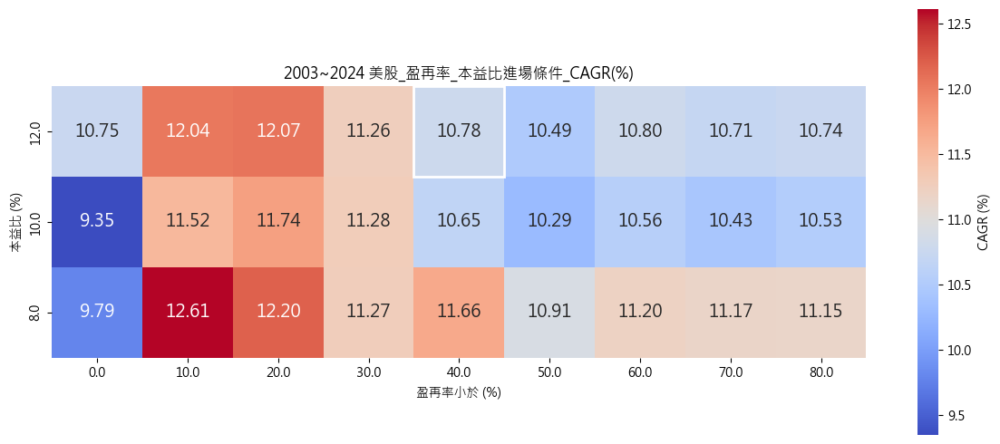

In [158]:
plot_strategy_heatmap(rr_pee_opt_df,
                        x_first=1, 
                        title='2003~2024 美股_盈再率_本益比進場條件_CAGR(%)',
                        figsize=(12, 5),
                        benchmark_param1=40,
                        benchmark_param2=12)

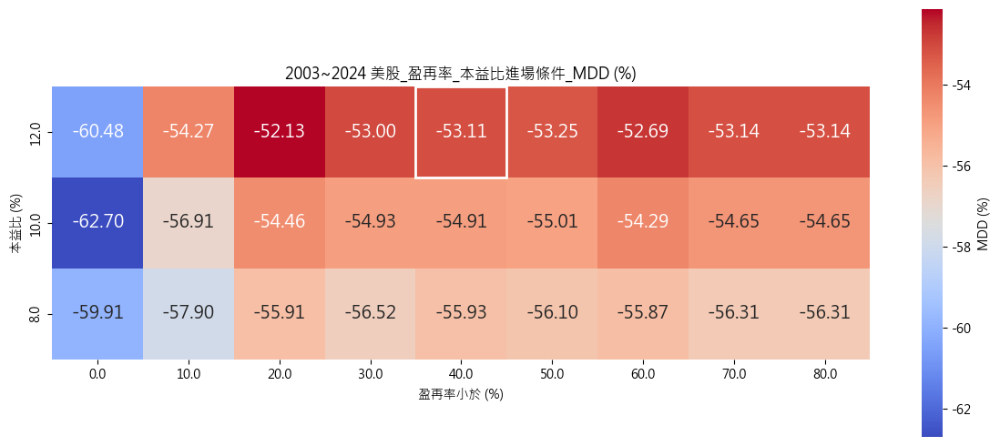

In [159]:
plot_strategy_heatmap(rr_pee_opt_df,
                      compare='MDD (%)',
                        x_first=1, 
                        title='2003~2024 美股_盈再率_本益比進場條件_MDD (%)',
                        figsize=(12, 5),
                        benchmark_param1=40,
                        benchmark_param2=12)

### 配息率 & PE

In [160]:
dpr_pee_opt_base_conds = roe_cond & rr_cond & netprofit_cond & listed_cond

dpr_pee_opt_conds = {}

for povalue in range(0, 56, 5): # 配息率
    for peevalue in range(8, 13, 2):  # 本益比

        pee_opt = (pe_daily < peevalue).resample('ME').last()
        dpr_cond_3y_opt = payout_ratio_rol.copy() >= (povalue/100)
        
        dpr_pee_opt_all_conds = (dpr_pee_opt_base_conds & dpr_cond_3y_opt)[START_DATE:END_DATE]

        dpr_pee_opt_conds[f'配息率_{povalue}%_本益比_{peevalue}__本益比進出場'] = (dpr_pee_opt_all_conds & pee_opt[START_DATE:END_DATE]).hold_until((~dpr_pee_opt_all_conds) | daily_pe_exit[START_DATE:END_DATE])

dpr_pee_opt_collecs = sim_conditions(dpr_pee_opt_conds, resample='ME', data=data)
dpr_pee_opt_collecs.selected_stock_count_analysis()

Backtesting progress: 100%|██████████| 36/36 [02:24<00:00,  4.02s/condition]


,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
配息率_55%_本益比_8__本益比進出場,12.14,-49.14,3.81,4.00,3.00,5.00,0.00,7.00
配息率_10%_本益比_12__本益比進出場,12.05,-49.85,90.53,98.00,73.25,111.00,45.00,131.00
配息率_45%_本益比_8__本益比進出場,12.03,-55.83,7.31,7.00,6.00,9.00,2.00,15.00
配息率_5%_本益比_12__本益比進出場,11.84,-51.77,100.14,108.00,84.00,119.75,49.00,145.00
配息率_0%_本益比_12__本益比進出場,11.66,-53.03,107.86,115.00,91.00,126.75,54.00,157.00
配息率_40%_本益比_8__本益比進出場,11.66,-55.93,11.61,10.00,8.00,15.00,4.00,23.00
配息率_15%_本益比_12__本益比進出場,11.49,-50.20,79.22,86.00,59.00,98.00,42.00,116.00
配息率_20%_本益比_12__本益比進出場,11.48,-49.23,66.76,72.50,47.00,83.00,37.00,100.00
配息率_50%_本益比_8__本益比進出場,11.45,-57.44,4.87,5.00,4.00,6.00,1.00,13.00


In [161]:
dpr_pee_opt_df = dpr_pee_opt_collecs.selected_stock_count_analysis()
dpr_pee_opt_df.reset_index(inplace=True)

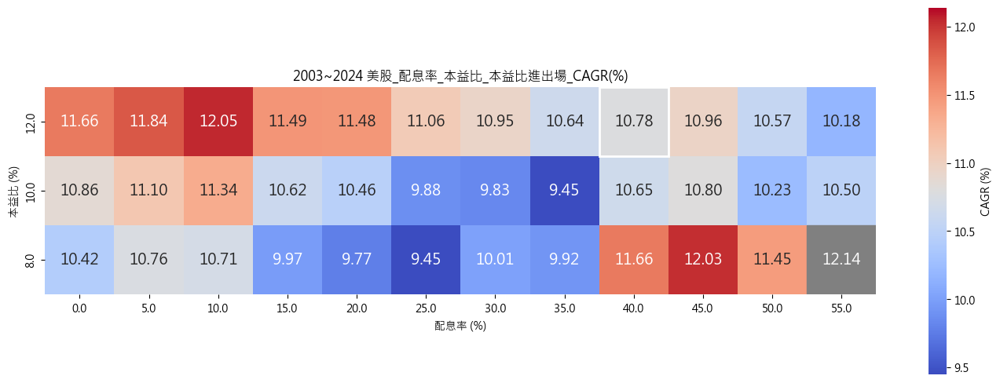

In [162]:
plot_strategy_heatmap(dpr_pee_opt_df,
                        x_first=1, 
                        title='2003~2024 美股_配息率_本益比_本益比進出場_CAGR(%)',
                        figsize=(14, 5),
                        benchmark_param1=40,
                        benchmark_param2=12)

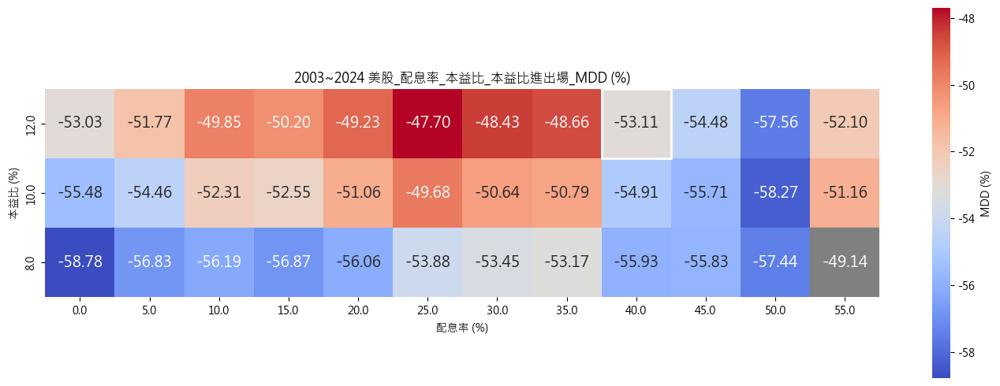

In [163]:
plot_strategy_heatmap(dpr_pee_opt_df,
                      compare="MDD (%)",
                        x_first=1, 
                        title='2003~2024 美股_配息率_本益比_本益比進出場_MDD (%)',
                        figsize=(14, 5),
                        benchmark_param1=40,
                        benchmark_param2=12)

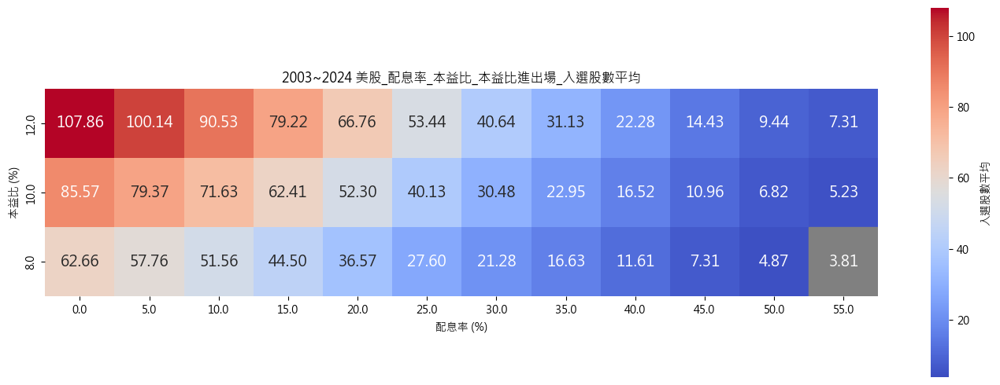

In [164]:
plot_strategy_heatmap(dpr_pee_opt_df,
                      compare="入選股數平均",
                        x_first=1, 
                        title='2003~2024 美股_配息率_本益比_本益比進出場_入選股數平均',
                        figsize=(14, 5))